# Generative modelling in deep learning

Generative modelling in machine learning can aim at achieving different goals.

The first, obvious one is that a generative model can be used to generate more data, to be used afterwards by an other algorithm. While a generative model cannot create more information to solve the issue of having too small datasets, it could be used to solve anonymity questions. Typically, sharing a generative model trained on private data could allow the exploitation of the statistical property of this data without sharing the data itself (which can be protected by privacy matters for example).

Another goal is to use generative modelling to better understand the data at hand. This is based on the hypothesis that a model that successfully learned to generate (and generalize) a dataset should have internally learned some efficient and compressed representation of the information contained in the data. In this case, analysing a posteriori the learned representation may give us insights on the data itself.

The notion of a generative model however needs to be more formally specified, in order to work with. What does it mean for the model to generate data that "looks like" the original dataset? A mathematical formulation of that is necessary, in order to define a training objective that can be used efficiently. Having some expert rate the quality of all generated datapoints one by one is definitely not an option.

Thus, modelling our data and models as probability distributions comes to the rescue. If we consider our data as coming from some underlying probability distribution, that we will name $p_D$, our goal is thus to train our model to represent another probability distribution, which we will name $p_\theta$, that should be some good approximation of $p_D$. Given we only know $p_D$ through some set of realisations from it (the dataset), we can never hope to learn it exactly.

**Q1: Can you name some ways to compare two given distributions $p_D$ and $p_\theta$?**

> As suggested below, there are mainly two ways of comparing 2 given distributions $p_D$ and $p_\theta$ using:
- The density of distributions: statistical distances allow to compare 2 probability distributions. A statistical distance is not necessarily a metric (symmetric, positive definite and subadditive distance/function). Indeed, it often does not satisfy the symmetry property. For example, the latter can be applied to divergences. Divergences are non-symmetric distances. The most popular category of divergences used for comparing 2 distributions is the set of $f$-divergence: $$D_f(P||Q) = \mathbb{E}_{X\sim P}\Bigg[f\Big(\frac{P(X)}{Q(X)}\Big)\Bigg]$$ KL-divergence is such that $f(t)=t$log$t$, reverse KL-divergence such that $f(t)=-$log$t$ or $\chi^2$-divergence such that $f(t)=(t-1)^2$. One can also cite other statistical distances that are useful for GAN: Jensen–Shannon divergence: $$JSD(P||Q)=\frac{1}{2}\Big[ D_{KL}(P||M) + D_{KL}(Q||M) \Big]$$ with $M = \frac{1}{2}(P+Q)$. Or the Wasserstein distance: $$W(P,Q) = \inf\limits_{\gamma \sim \Pi(P,Q)} \mathbb{E}_{(X,Y)\sim \gamma} \Big[||X-Y||\Big]$$ where $\Pi(P,Q)$ is the set of all possible joint probability distributions between $P$ and $Q$. Here I take $||X-Y||$ to denote a distance $d(X,Y)$ that defines a metric space.
>
> - The samples drawn from this distributions: statistical tests. For example, the most famous test used to compare 2 probability distributions through their respective samples is the Kolmogorov-Smirnov non-parametric test. However, the latter is designed for continuous, one-dimensional probability distributions. In other words, samples must be one-dimensional as the KS statistic is defined by $D_n = \sup\limits_{x} |F_n(x)-F(x)|$ with $F_n$ the empirical c.d.f: $F_n(x) = n^{-1} \displaystyle \sum_{i=1}^n \mathbb{1}_{(-\infty, x]}(X_i)$. This is not well suited for multivariate data but some generalization to mutivariate KS test have been proposed (G. Fasano, A. Franceschini; A multidimensional version of the Kolmogorov–Smirnov test, Monthly Notices of the Royal Astronomical Society, Volume 225, Issue 1, 1 March 1987, Pages 155–170, https://doi.org/10.1093/mnras/225.1.155). Other statistical tests aims at comparing means, variances or proportions from 2 independent samples. One can cite Mann-Whitney's test for comparing 2 means (non-parametric), Fisher's test for variances (parametric).


Most comparison methods can be separated into two kinds: those that compare the density of the distributions ($p_\theta(x)$ vs $p_D(x)$), and those that compare the values sampled from them directly.

**Q2: Given we want to use them as an optimisation objective, what are the caveats to keep in mind about these two kinds?**

> We are here distinguishing between computing distances ("compare the density of the distributions") and statistics ("compare the values sampled from them directly"). In the first case, we need to evaluate $p_\theta(x)$ and $p_D(x)$ which can be intractable in high-dimensional spaces $\mathcal{X}$. One can use Approximate Importance Sampling to approximate these densities but this inevitably introduces approximation errors. In the second case, we need to sample from the distributions and this can also be very costly as we shall use MCMC methods. Moreover, the objective function may be non-convex or even non-differentiable.

In this work, we will focus on two of the most widely used generative models based on deep neural networks: Generative Adversarial Networks (GANs) and Variational AutoEncoders (VAEs), in order to compare them and understand their strenghts and weaknesses.

### Generative Adversarial Networks

GANs structure is based on modelling the distribution $p_\theta$ as a learned deterministic function applied to a standard noise. Sampling from it is thus done as follows: first, some noise is sampled from a standard N-dimentional gaussian distribution: $\epsilon \sim \mathcal{N}(0;I)$, and then the output is computed as a deterministic function $x = f_\theta(\epsilon)$. The function $f_\theta$ is implemented as a neural network, $\theta$ representing its learned parameters.

**Q3: What is, a priori, the impact of the choice of N, the dimension of the input noise?**

> Drawing representative samples from $\epsilon$ can be very di􏰅fficult in high dimensional spaces, i.e when $N$ gets very large. It is not obvious to see how we can draw representative samples from $\epsilon$ without enumerating all possible states, the latter exponentially growing with the number of dimensions. This refers to the curse of dimensionality: when $N$ gets bigger, we shall need more and more (with exponential growth) samples to cover the input space. This quickly makes such a task computationally intractable. 

By construction, this generator structure only allows sampling of the distribution $p_\theta$, and does not allow the computation of the density $p_\theta(x)$ (at least not without strong assumptions on $f_\theta$). Such a model seems to need a comparison method based on samples to be trained.

The smart idea of GANs is to instead use another neural network to model the objective. Another neural network is introduced: a classifier (that we call the discriminator) which is trained to differentiate examples from the dataset from examples generated by $p_\theta$. The reasoning is as follows:

The discriminator (whose output is denoted by $D(x)$) is trained using a classic discrimination loss, so that $D(x)$ can be interpreted as the probability that $x$ came from the real dataset:

$$ \mathcal{L}_D = \mathbb{E}_{p_D} \left[ -\log D(x) \right] + \mathbb{E}_{p_\theta} \left[ -\log \left(1-D(x)\right) \right] $$

From that, it can be shown that the optimal discriminator is given by $D(x) = \frac{p_D(x)}{p_\theta(x) + p_D(x)}$, and when reached its loss takes a specific value:

$$ \mathcal{L}_D = 2 \left( \log 2 - JSD(p_\theta \| p_D) \right) $$

So, training the generator network to *maximize* the same loss would, assuming the discriminator is always trained to optimality, minimize the JSD between $p_\theta$ and $p_D$, and thus bring $p_\theta$ closer to $p_D$.

**Q4: Can you anticipate a caveat of using the JSD as a training objective for the generator?**

##### Example question 4

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

def plot_JS():
    X = np.linspace(-5, 20,1000)
    P = norm.pdf(X, loc=3, scale=1)
    Q = norm.pdf(X, loc=10, scale=1)
    M = 0.5*(P+Q)

    def kl(p, q):
        return p * np.log(p/q)

    def js(X):
        js = []
        for i in range(X.shape[0]):
            p, q, m = P[i], Q[i], M[i]
            js.append((kl(p, q) + kl(q, m)) / 2)
        return js

    plt.figure(figsize=(15, 5)); plt.subplot(1,2,1); plt.plot(X, Q, label=r'$p_D(x)$');
    plt.plot(X, P, label=r'$p_\theta(x)$'); plt.plot(X, M, label=r'$M(x)$'); plt.legend()
    plt.subplot(1,2,2); plt.plot(X, js(X), c='red', label=r'$JSD(p_\theta, p_D)$'); plt.legend()
    plt.show()

##### Answer to question 4

> To illustrate my answer, I specially made a little piece of (hidden) code above. In this example, the real distribution of the data is $\mathcal{N}(10, 1)$ and $p_\theta = \mathcal{N}(3, 1)$. In other words, $p_D$ ad $p_\theta$ are far from being "statistically" near. The consequence here is that JSD values are reaching near 0 everywhere expect where $p_\theta$ takes its significantly strictly positive values (say $[\mu-3\sigma, \mu+3\sigma]=[0, 6]$ here). If we view JSD as a training objective for the generator, it will hardly suffer from vanishing gradient when real and fake data distributions are too disjoint. This means that if fake data is somehow generated near the "region" of $p_D$, the true distribution, then the weights associated to those images will be updated very slowly as $\nabla JS$ would be very small. This can also be seen is equation (4). Indeed, this equation may not provide sufficient gradient for G to learn well. When G is poor (or D is very good), D can reject samples with high confidence because they are clearly different from the training data (thus, $D(x) \approx 0$ which is the probability that D makes a mistake). This is particularly observed at the beginning of the learning. In this case, log$(1 − D(x))$ saturates and G produces non-meaningful samples.

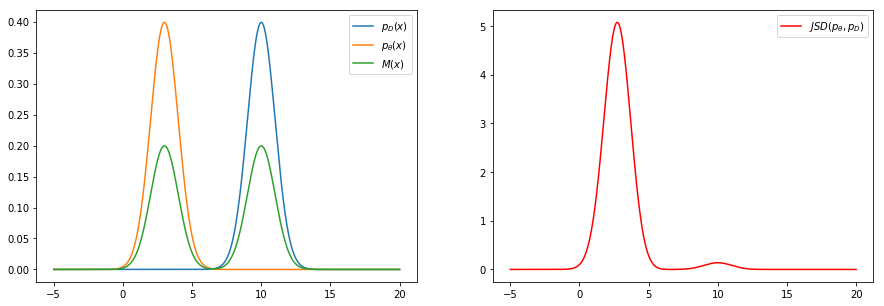

In [3]:
plot_JS()

Having the generator trained to maximize $\mathcal{L}_D$ is equivalent to setting its training loss to $ \mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x)) $.

**Q5: This loss only gives feedback to the generator on samples it generated, what can this imply?**

> This may imply a lack of diversity in the generated samples. The generator loss optimization program is to minimize the probability that D does not make mistakes (this is suggested by $\mathcal{L}_G$ above). Said differently, the latter is equivalent to maximizing the probability that D makes mistakes. So, if G is too much trained without updating D, G will tend to generate groups of same images. Indeed, as it only has feedback on samples it generated, if a generated image $x\sim p_\theta$ is such that $D(x)\approx1$ (D is a.s. making a mistake) then, G will generate images that look like $x$. That's why G and D must be trained carefully. As said by GoodFellow et al. ("Generative Adversarial Nets, 2014), "D must be synchronized well with G during training (in particular, **G must not be trained too much without updating D, in order to avoid “the Helvetica scenario” in which G collapses too many values of z to the same value of x to have enough diversity to model $p_{\text{data}}$**)". A way to avoid this is to use an unrolled optimization of the discriminator ($k$-steps training of D for each training step of G, Metz et al. "Unrolled Generative Adversarial Networks", 2017).

We will now work on implementing a GAN on a simple toy problem, to get a feeling of its behavior and test our theoretical insights. For this we will use the `pytorch` library.

While a real problem would be generating images for example (each datapoint $x$ would then be a different image), this is a kind of task that easily requires intensive CPU/GPU power, and image datasets are difficult to visualize from a geometric point of view (even small images contains hundreds of pixels, and nobody can visualize points in a 100-dimensional space). So instead we will focus on points in the plane: each datapoint $x$ will actually be a couple of numbers $(x1, x2)$, and our target dataset will be 25 Gaussian distributions with small variance, distributed on a $5\times 5$ grid.

In [35]:
import torch
import numpy as np
from tqdm import tqdm_notebook as tqdm

# Our dataset is mathematically defined, we can generate batches on the fly and enjoy
# an infinite-size dataset
def generate_batch(batchlen):
    """This function generates a batch of length 'batchlen' from the 25-gaussian dataset.
    return a torch tensor of dimensions (batchlen, 2)
    """
    # to sample from the gaussian mixture, we first sample the means for each point, then
    # add a gaussian noise with small variance
    samples = torch.multinomial(torch.tensor([0.2,0.2,0.2,0.2,0.2]), 2*batchlen, replacement=True)
    means = (2.0 * (samples - 2.0)).view(batchlen,2).type(torch.FloatTensor)
    return torch.normal(means, 0.05)

Let's plot a batch, to see what the dataset looks like.

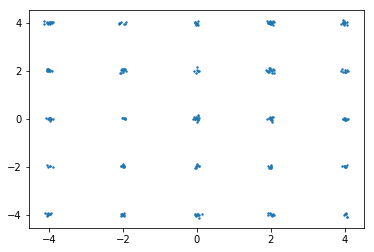

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

batch = generate_batch(256)

plt.scatter(batch[:,0], batch[:,1], s=2.0, label='Batch of data from our gaussian mixture dataset')
plt.show()

We now need to define our two neural networks, the generator and the discriminator. The generator will take as input a value $z$ sampled from a Gaussian prior, and output a value $x$ (thus a couple $(x_1,x_2)$). The discriminator takes as input a value $x$, and is a binary classifier.

When representing a binary classifier with a neural network, it is better for the last layer to consist of only a sigmoid activation, so that the output values will be between 0 and 1 and stand for the probability (according to the classifier) that the input is of the first class. The output is thus of the form $\mathrm{sigmoid}(h)$. The loss involves quantities such as $-\log(\mathrm{sigmoid}(h))$. For numerical stability reasons, it is recommended to rewrite the loss in order to make use of the $\mathrm{softplus}$ function defined by $\mathrm{softplus}(h) = \log(1 + \exp(h))$ and provided in PyTorch as `torch.softplus`.
As the $\mathrm{softplus}(h)$ formulation of the loss already contains the sigmoid activation, in practice the last layer of the discrimator network will not have any activation function (being just $h$).

In order to investigate on the influence of some parameters such that the training ratio, or the depth/width of the neural network, I chose to change the class Discriminator and Generator in such a way to be more flexible and take more parameters as input.

In [41]:
import torch.nn as nn
import torch.nn.functional as F

# Define the generator
class Generator(nn.Module):
    def __init__(self, WDTH=0, DPTH=0, PRIOR_N=1, PRIOR_STD=1.):
        super().__init__()
        self.PRIOR_N = PRIOR_N
        self.PRIOR_STD = PRIOR_STD
        # First layer
        self.fc1 = nn.Linear(PRIOR_N, WDTH)
        # Hidden layers
        self.hidden_layers = []
        for _ in range(DPTH):
            self.hidden_layers.append(nn.Linear(WDTH, WDTH))
        # Transform list into layers using nn.ModuleList
        self.hidden_layers = nn.ModuleList(self.hidden_layers)
        # Output layer
        self.fc2 = nn.Linear(WDTH, 2)

    def __call__(self, z):
        h = F.relu(self.fc1(z))
        for hidden_layer in self.hidden_layers:
            h = F.relu(hidden_layer(h))
        return self.fc2(h)
    
    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, self.PRIOR_N), self.PRIOR_STD)
        return self.__call__(z)
    

# Define the discriminator.
class Discriminator(nn.Module):
    def __init__(self, WDTH=0, DPTH=0):
        super().__init__()
        # First layer
        self.fc1 = nn.Linear(2, WDTH)
        # Hidden layers
        self.hidden_layers = []
        for _ in range(DPTH):
            self.hidden_layers.append(nn.Linear(WDTH, WDTH))
        # Transform list into layers using nn.ModuleList
        self.hidden_layers = nn.ModuleList(self.hidden_layers)
        # Output layer
        self.fc2 = nn.Linear(WDTH, 1)
    
    def __call__(self, x):
        h = F.relu(self.fc1(x))
        for hidden_layer in self.hidden_layers:
            h = F.relu(hidden_layer(h))
        return self.fc2(h)

With these classes in shape, only the training loop is still missing. To stick with the mathematical GAN framework, we should train the discriminator until convergence between each training step of the generator. This is not practical for two reasons: first it takes a lot of time, and second if the discriminator is too good, its gradient will vanish (as seen in **Q4**) and thus no information will be passed to the generator.

We will then train the discriminator a fixed number of times between each training iteration of the generator.

The following cell allows to "play" with the different parameters.

In [46]:
def GAN(TRAIN_RATIO=1, N_ITER=40001, BATCHLEN=128,
        WDTH_G=0, DPTH_G=0, WDTH_D=0, DPTH_D=0,
        PRIOR_N=1, PRIOR_STD=1., frame=1000):
    """
    TRAIN_RATIO : int, number of times to train the discriminator between two generator steps
    N_ITER : int, total number of training iterations for the generator
    BATCHLEN : int, Batch size to use
    WDTH_G : int, width of the generator (number of neurons in hidden layers)
    DPTH_G : int, number of hidden FC layers of the generator
    WDTH_D : int, width of the discriminator (number of neurons in hidden layers)
    DPTH_D : int, number of hidden FC layers of the discriminator
    PRIOR_N : int, dimension of input noise
    PRIOR_STD : float, standard deviation of p(z)
    frame : int, display data each 'frame' iteration
    """

    G = Generator(WDTH=WDTH_G, DPTH=DPTH_G, PRIOR_N=PRIOR_N, PRIOR_STD=PRIOR_STD)
    solver_G = torch.optim.Adam(G.parameters(), lr=1e-3, betas=(0.5,0.9))
    D = Discriminator(WDTH=WDTH_D, DPTH=DPTH_D)
    solver_D = torch.optim.Adam(D.parameters(), lr=1e-4, betas=(0.5,0.9))

    for i in tqdm(range(N_ITER)):
        # train the discriminator
        for _ in range(TRAIN_RATIO):
            D.zero_grad()
            real_batch = generate_batch(BATCHLEN)
            fake_batch = G.generate(BATCHLEN)

            # Compute here the discriminator loss, using functions like torch.sum, torch.exp, torch.log,
            # torch.softplus, using real_batch and fake_batch
            h_real = D(real_batch)
            h_fake = D(fake_batch)
            loss_real = torch.mean(torch.sum(F.softplus(-h_real)))
            loss_fake = torch.mean(torch.sum(F.softplus(h_fake)))
            disc_loss = loss_real + loss_fake
            disc_loss.backward()
            solver_D.step()
        # train the generator
        G.zero_grad()
        fake_batch = G.generate(BATCHLEN)
        # Compute here the generator loss, using fake_batch
        h_fake = D(fake_batch)
        gen_loss = - torch.mean(torch.sum(F.softplus(h_fake)))
        gen_loss.backward()
        solver_G.step()
        if i%frame == 0:
            print('step {}: discriminator: {:.3e}, generator: {:.3e}'.format(i, float(disc_loss), float(gen_loss)))
            # plot the result
            real_batch = generate_batch(1024)
            fake_batch = G.generate(1024).detach()
            plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
            plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
            plt.show()

Complete the previous code and train your model.

Depending on your choice of parameters, the training may not go well at all, with the generator completely collapsing quickly at the beginning of the training. It has been observed by the litterature that the generator's loss $\mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x))$ is often to blame.

The following hyperparameters lead to a satisfying convergence and good-looking results.

step 0: discriminator: 1.773e+02, generator: -8.633e+01


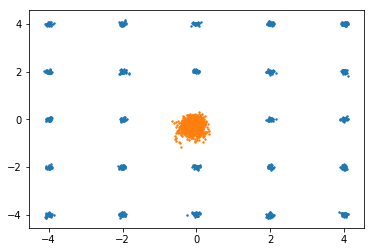

step 100: discriminator: 2.404e+02, generator: -1.354e+02


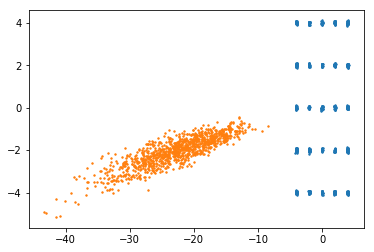

step 200: discriminator: 1.747e+02, generator: -9.543e+01


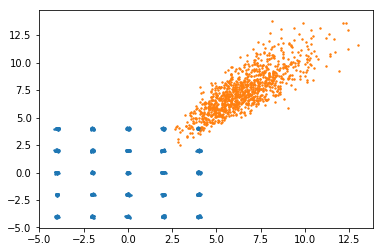

step 300: discriminator: 1.744e+02, generator: -9.949e+01


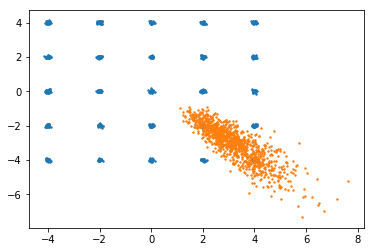

step 400: discriminator: 1.586e+02, generator: -7.220e+01


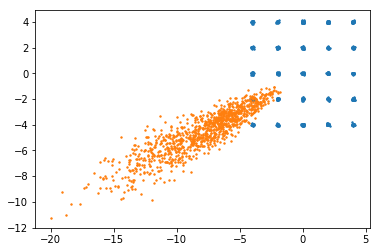

step 500: discriminator: 1.912e+02, generator: -1.095e+02


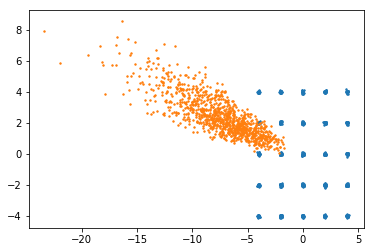

step 600: discriminator: 2.035e+02, generator: -1.130e+02


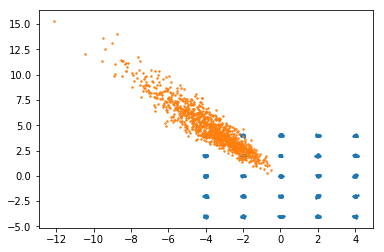

step 700: discriminator: 1.700e+02, generator: -7.731e+01


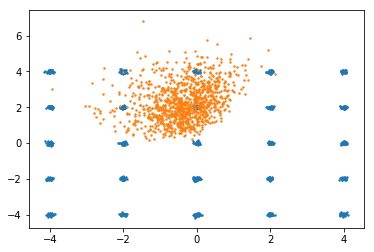

step 800: discriminator: 1.634e+02, generator: -7.617e+01


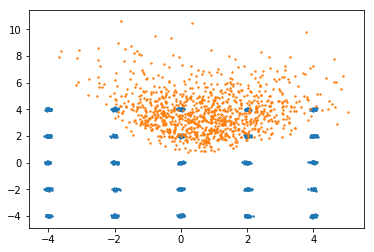

step 900: discriminator: 1.661e+02, generator: -7.857e+01


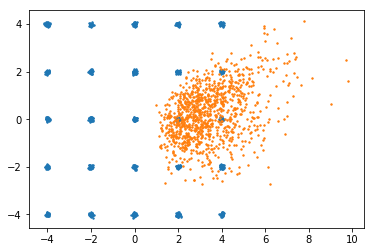

step 1000: discriminator: 1.836e+02, generator: -9.502e+01


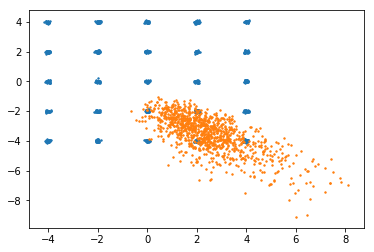

step 1100: discriminator: 1.719e+02, generator: -8.012e+01


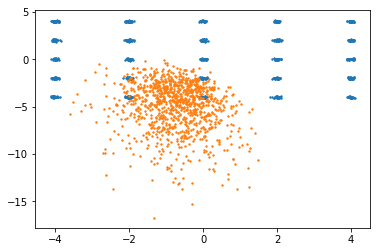

step 1200: discriminator: 1.666e+02, generator: -7.414e+01


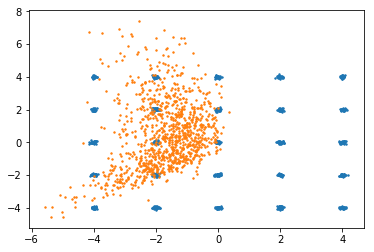

step 1300: discriminator: 1.645e+02, generator: -7.537e+01


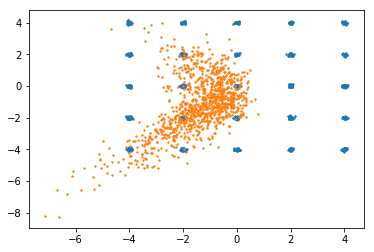

step 1400: discriminator: 1.704e+02, generator: -8.367e+01


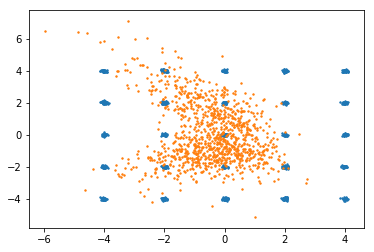

step 1500: discriminator: 1.732e+02, generator: -7.671e+01


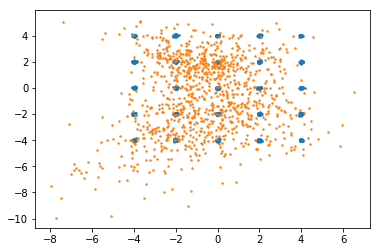

step 1600: discriminator: 1.760e+02, generator: -7.665e+01


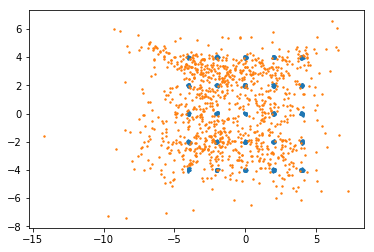

step 1700: discriminator: 1.753e+02, generator: -8.612e+01


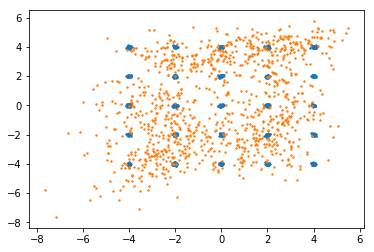

step 1800: discriminator: 1.741e+02, generator: -9.025e+01


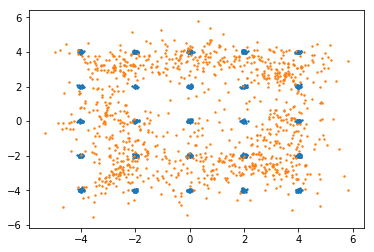

step 1900: discriminator: 1.745e+02, generator: -8.641e+01


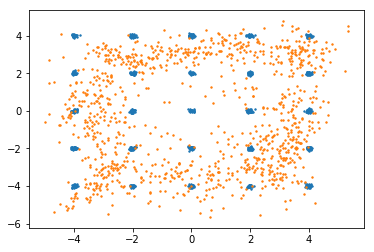

step 2000: discriminator: 1.729e+02, generator: -8.395e+01


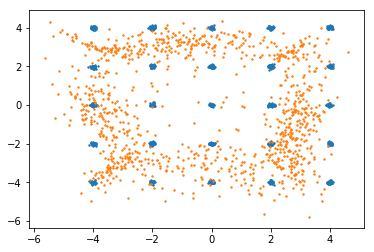

step 2100: discriminator: 1.716e+02, generator: -8.359e+01


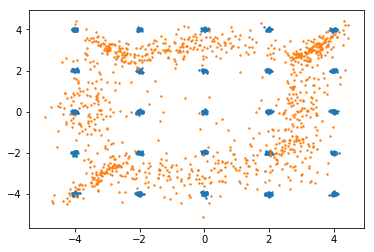

step 2200: discriminator: 1.690e+02, generator: -8.456e+01


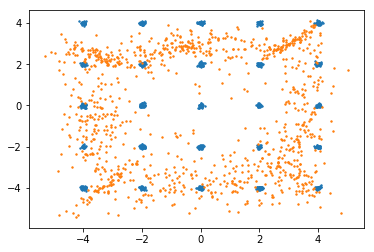

step 2300: discriminator: 1.670e+02, generator: -8.365e+01


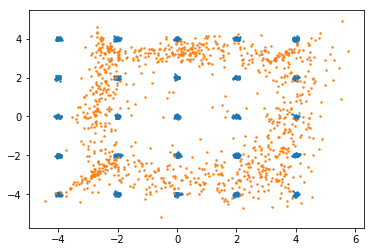

step 2400: discriminator: 1.665e+02, generator: -8.328e+01


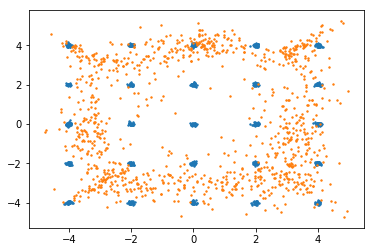

step 2500: discriminator: 1.617e+02, generator: -8.138e+01


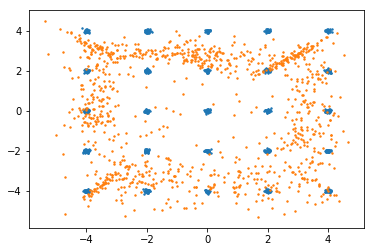

step 2600: discriminator: 1.607e+02, generator: -8.131e+01


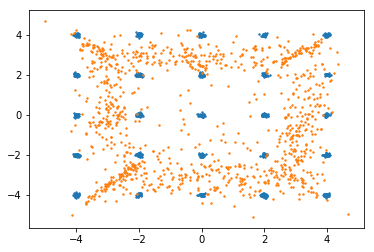

step 2700: discriminator: 1.620e+02, generator: -7.852e+01


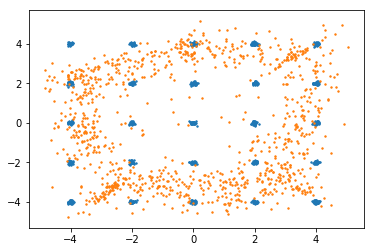

step 2800: discriminator: 1.548e+02, generator: -7.167e+01


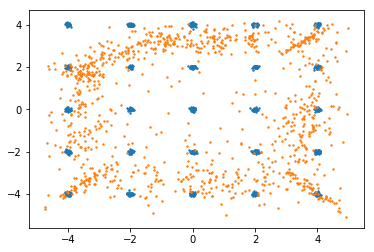

step 2900: discriminator: 1.525e+02, generator: -7.630e+01


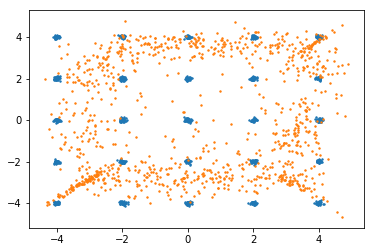

step 3000: discriminator: 1.465e+02, generator: -7.875e+01


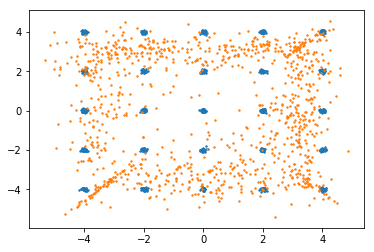

step 3100: discriminator: 1.459e+02, generator: -7.171e+01


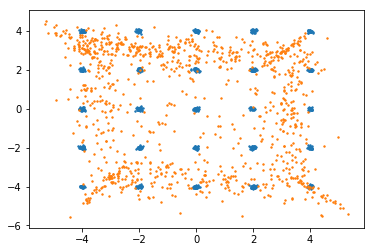

step 3200: discriminator: 1.391e+02, generator: -6.592e+01


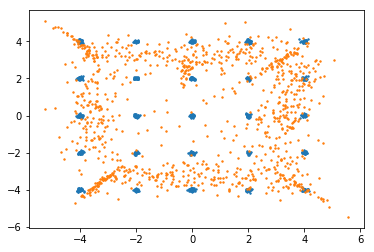

step 3300: discriminator: 1.398e+02, generator: -6.664e+01


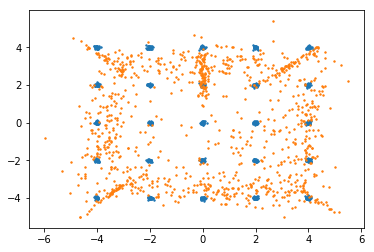

step 3400: discriminator: 1.259e+02, generator: -7.543e+01


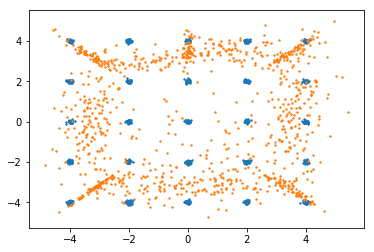

step 3500: discriminator: 1.249e+02, generator: -6.505e+01


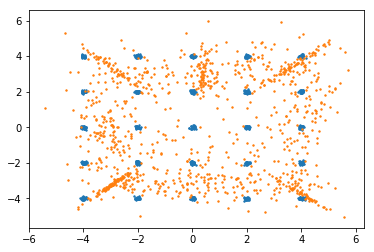

step 3600: discriminator: 1.166e+02, generator: -5.828e+01


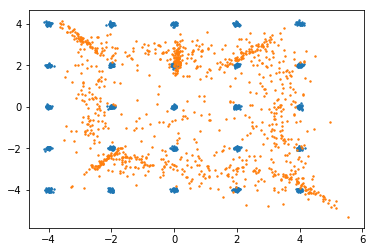

step 3700: discriminator: 1.135e+02, generator: -5.959e+01


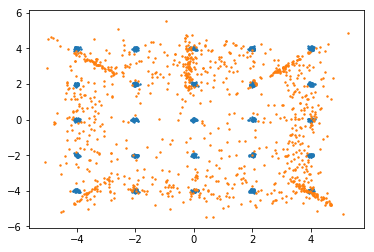

step 3800: discriminator: 1.124e+02, generator: -5.653e+01


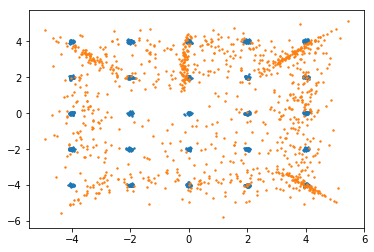

step 3900: discriminator: 1.127e+02, generator: -5.653e+01


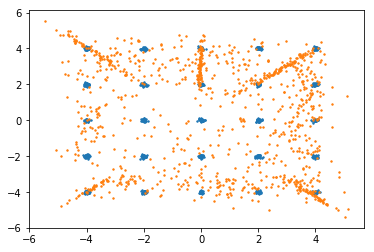

step 4000: discriminator: 1.085e+02, generator: -5.118e+01


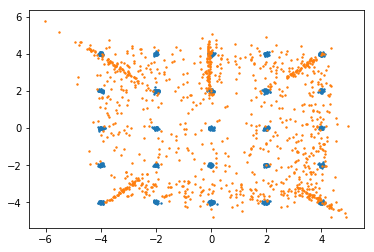

step 4100: discriminator: 1.112e+02, generator: -5.066e+01


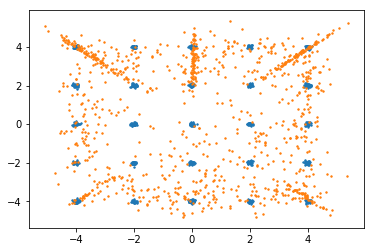

step 4200: discriminator: 1.097e+02, generator: -4.616e+01


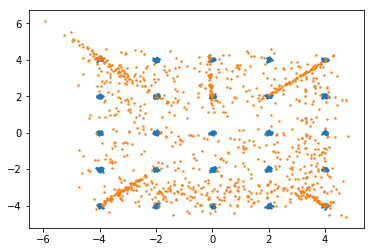

step 4300: discriminator: 1.030e+02, generator: -4.855e+01


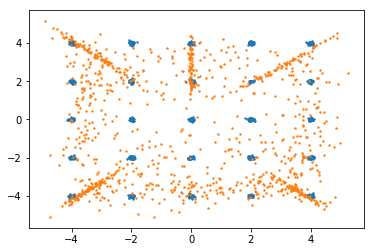

step 4400: discriminator: 9.404e+01, generator: -4.877e+01


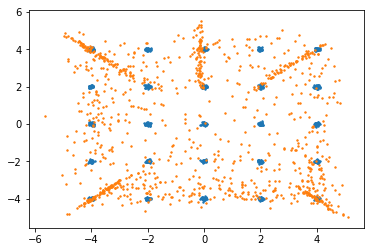

step 4500: discriminator: 9.983e+01, generator: -5.645e+01


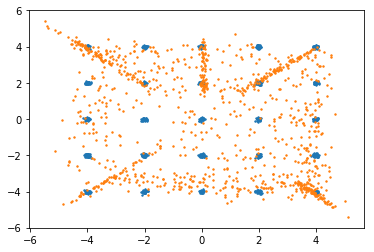

step 4600: discriminator: 9.601e+01, generator: -4.174e+01


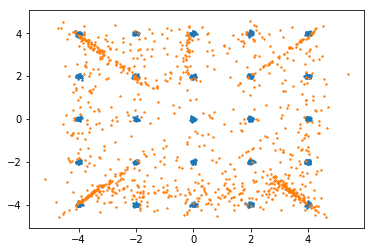

step 4700: discriminator: 9.684e+01, generator: -5.233e+01


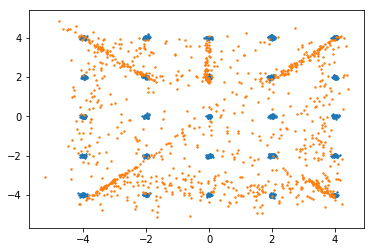

step 4800: discriminator: 9.337e+01, generator: -5.158e+01


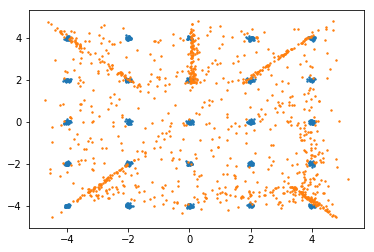

step 4900: discriminator: 9.519e+01, generator: -4.731e+01


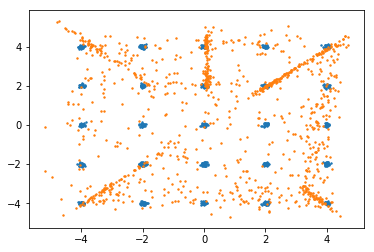

step 5000: discriminator: 9.479e+01, generator: -4.571e+01


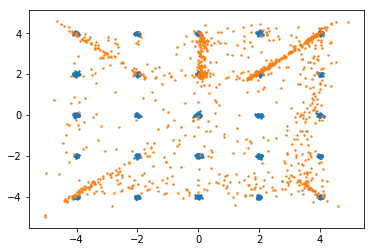

step 5100: discriminator: 7.990e+01, generator: -4.047e+01


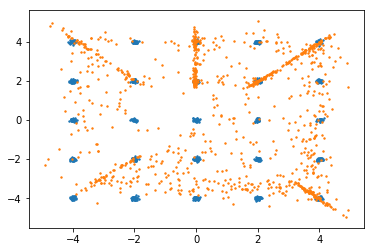

step 5200: discriminator: 8.395e+01, generator: -5.451e+01


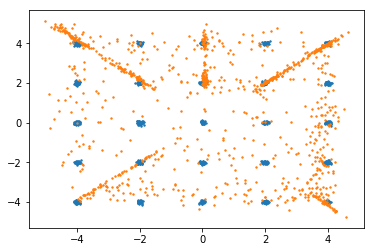

step 5300: discriminator: 9.789e+01, generator: -4.921e+01


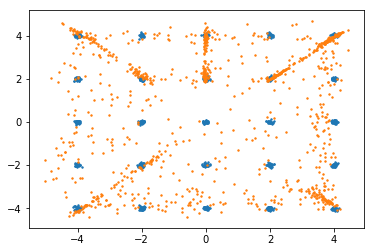

step 5400: discriminator: 9.488e+01, generator: -6.248e+01


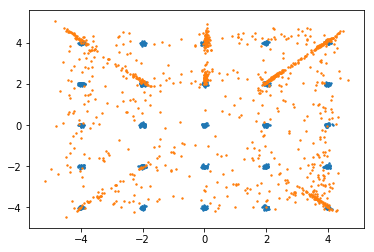

step 5500: discriminator: 9.039e+01, generator: -4.185e+01


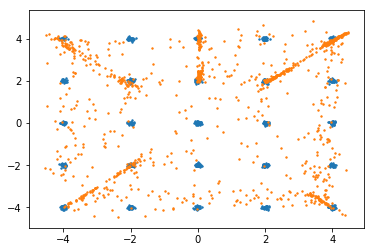

step 5600: discriminator: 8.900e+01, generator: -4.960e+01


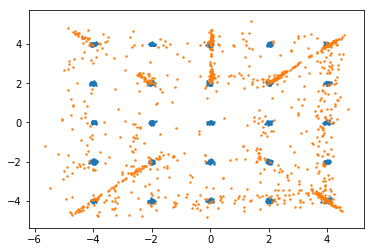

step 5700: discriminator: 9.196e+01, generator: -4.985e+01


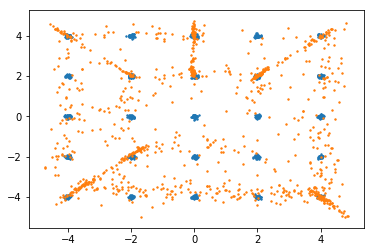

step 5800: discriminator: 9.618e+01, generator: -5.010e+01


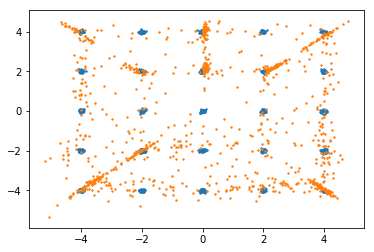

step 5900: discriminator: 9.092e+01, generator: -5.550e+01


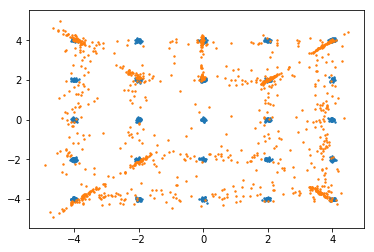

step 6000: discriminator: 8.854e+01, generator: -4.472e+01


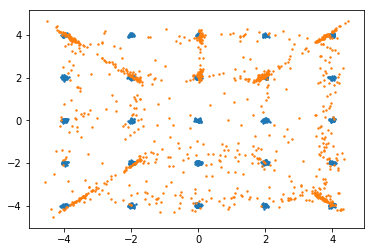

step 6100: discriminator: 9.285e+01, generator: -6.458e+01


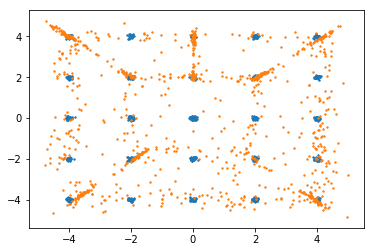

step 6200: discriminator: 9.530e+01, generator: -4.843e+01


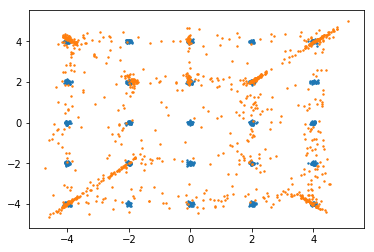

step 6300: discriminator: 9.320e+01, generator: -6.345e+01


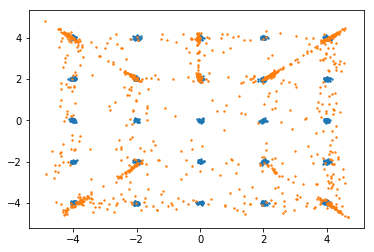

step 6400: discriminator: 9.065e+01, generator: -3.685e+01


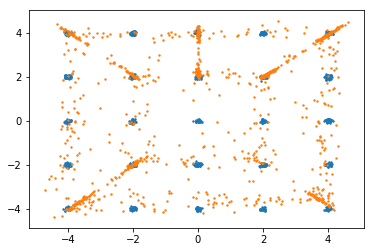

step 6500: discriminator: 9.681e+01, generator: -4.996e+01


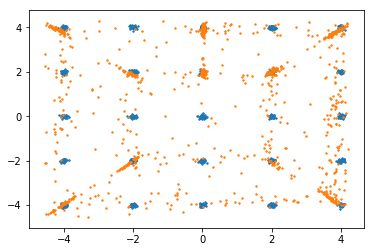

step 6600: discriminator: 8.327e+01, generator: -3.888e+01


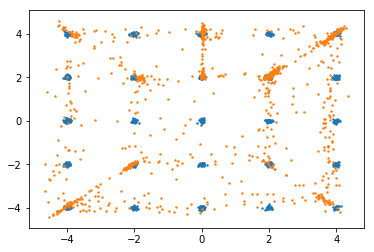

step 6700: discriminator: 9.190e+01, generator: -3.970e+01


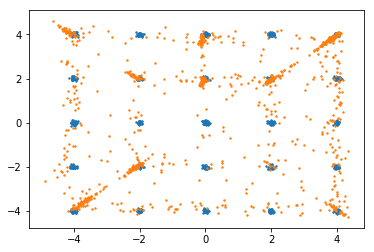

step 6800: discriminator: 9.496e+01, generator: -4.584e+01


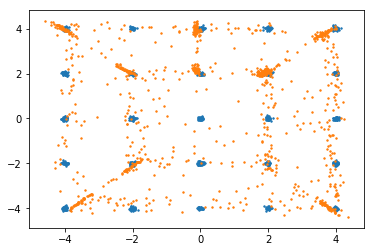

step 6900: discriminator: 8.947e+01, generator: -4.398e+01


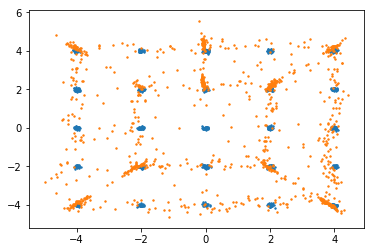

step 7000: discriminator: 9.170e+01, generator: -4.279e+01


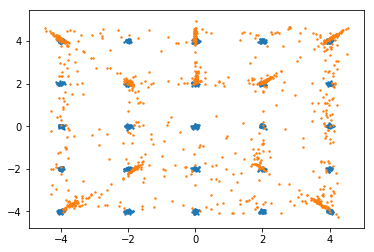

step 7100: discriminator: 9.108e+01, generator: -3.899e+01


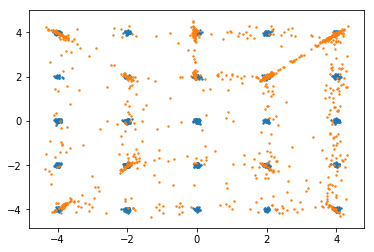

step 7200: discriminator: 9.795e+01, generator: -4.589e+01


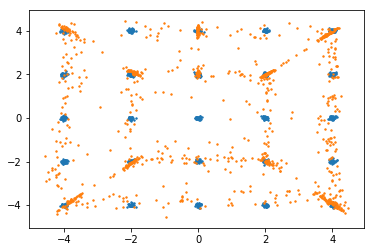

step 7300: discriminator: 9.520e+01, generator: -4.160e+01


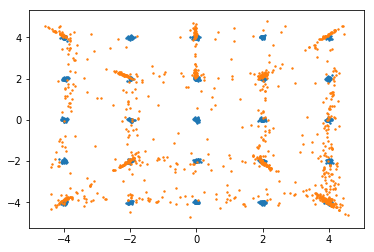

step 7400: discriminator: 8.543e+01, generator: -4.602e+01


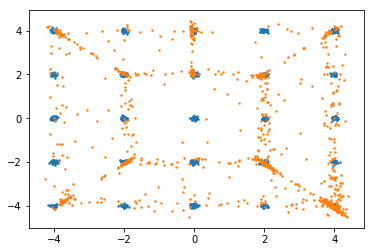

step 7500: discriminator: 1.050e+02, generator: -4.316e+01


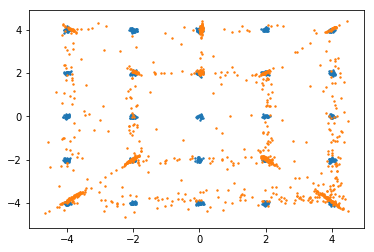

step 7600: discriminator: 1.036e+02, generator: -4.476e+01


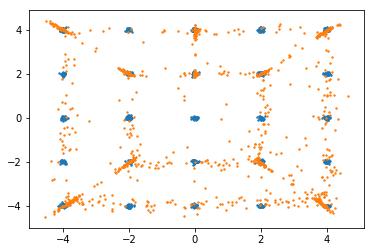

step 7700: discriminator: 9.030e+01, generator: -4.641e+01


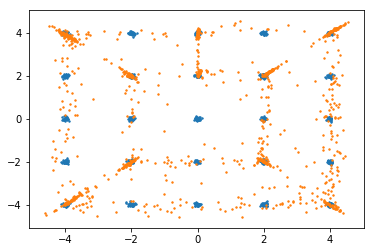

step 7800: discriminator: 1.095e+02, generator: -4.733e+01


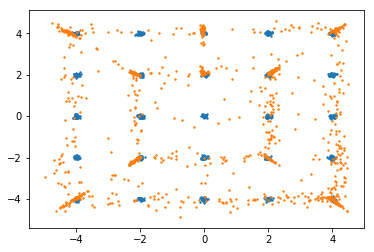

step 7900: discriminator: 9.992e+01, generator: -5.193e+01


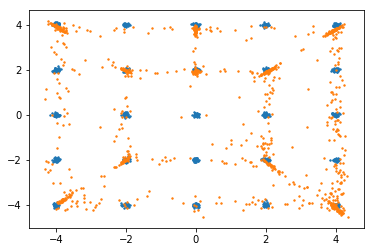

step 8000: discriminator: 1.056e+02, generator: -3.795e+01


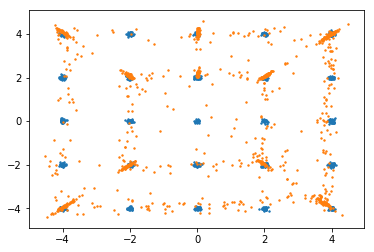

step 8100: discriminator: 9.788e+01, generator: -4.405e+01


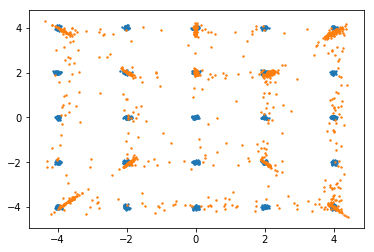

step 8200: discriminator: 1.003e+02, generator: -4.044e+01


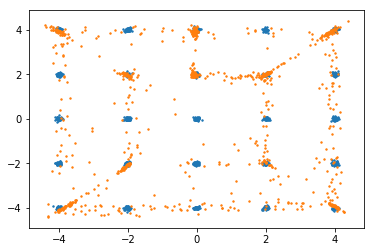

step 8300: discriminator: 8.048e+01, generator: -5.450e+01


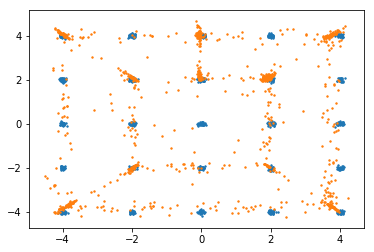

step 8400: discriminator: 9.237e+01, generator: -4.307e+01


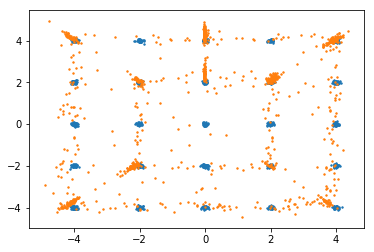

step 8500: discriminator: 9.186e+01, generator: -3.487e+01


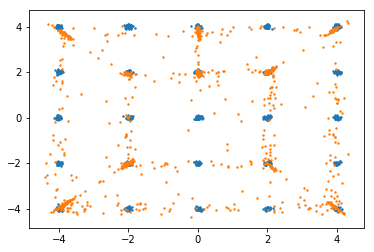

step 8600: discriminator: 1.081e+02, generator: -4.724e+01


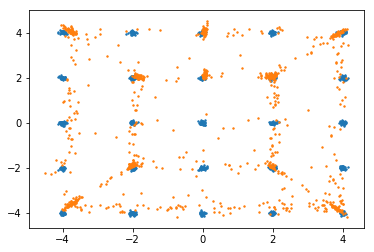

step 8700: discriminator: 9.144e+01, generator: -4.959e+01


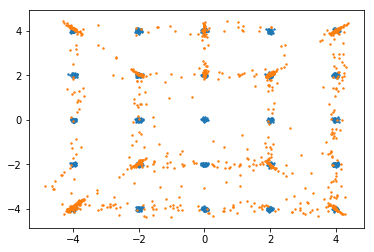

step 8800: discriminator: 1.125e+02, generator: -4.896e+01


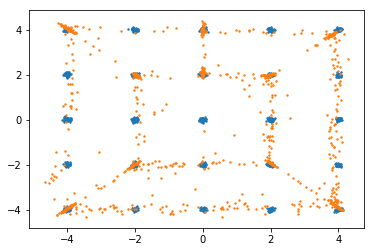

step 8900: discriminator: 1.043e+02, generator: -5.608e+01


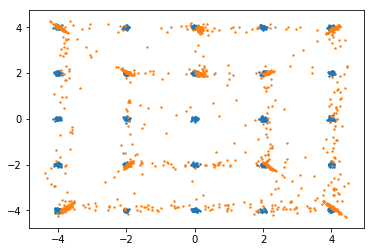

step 9000: discriminator: 8.544e+01, generator: -4.025e+01


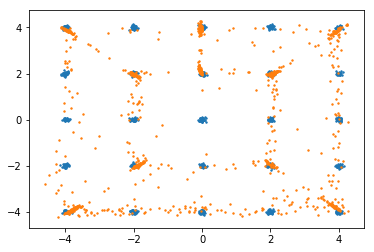

step 9100: discriminator: 9.480e+01, generator: -5.136e+01


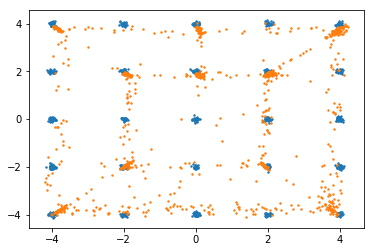

step 9200: discriminator: 8.935e+01, generator: -3.926e+01


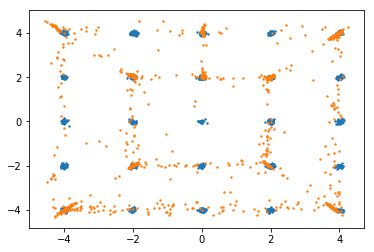

step 9300: discriminator: 9.319e+01, generator: -5.368e+01


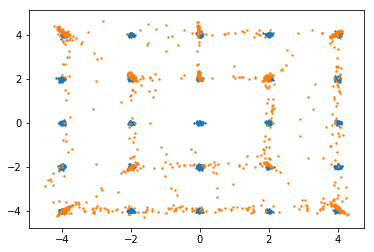

step 9400: discriminator: 1.080e+02, generator: -4.249e+01


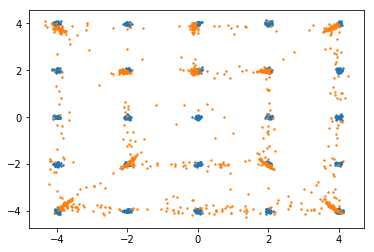

step 9500: discriminator: 9.708e+01, generator: -4.785e+01


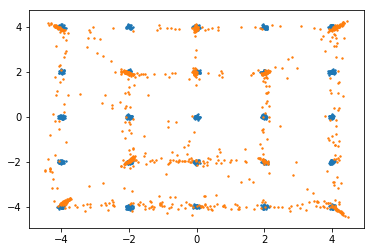

step 9600: discriminator: 1.065e+02, generator: -5.369e+01


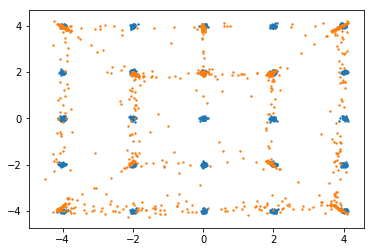

step 9700: discriminator: 8.608e+01, generator: -6.848e+01


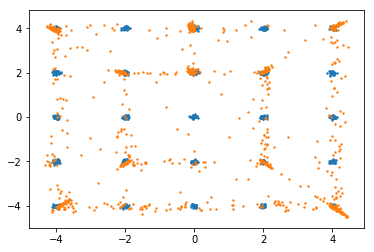

step 9800: discriminator: 9.462e+01, generator: -4.902e+01


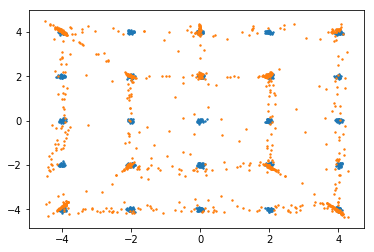

step 9900: discriminator: 9.182e+01, generator: -4.294e+01


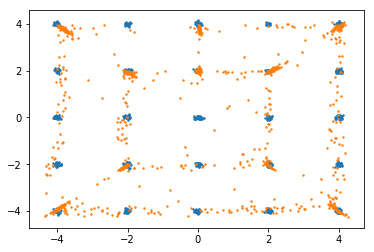

step 10000: discriminator: 9.565e+01, generator: -5.532e+01


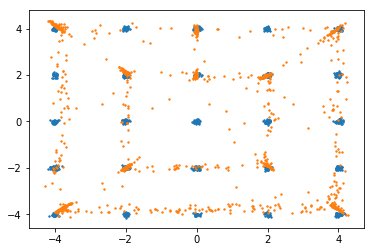

step 10100: discriminator: 9.880e+01, generator: -4.498e+01


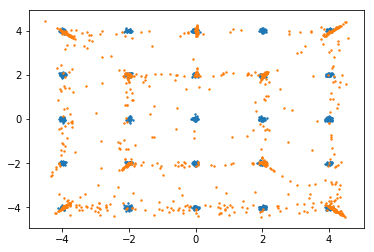

step 10200: discriminator: 1.024e+02, generator: -4.960e+01


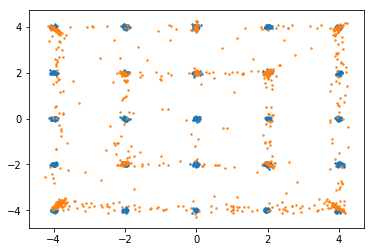

step 10300: discriminator: 1.022e+02, generator: -5.450e+01


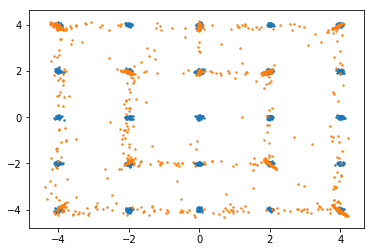

step 10400: discriminator: 8.991e+01, generator: -3.472e+01


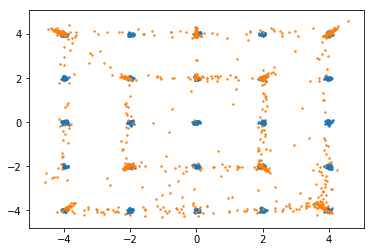

step 10500: discriminator: 8.340e+01, generator: -5.478e+01


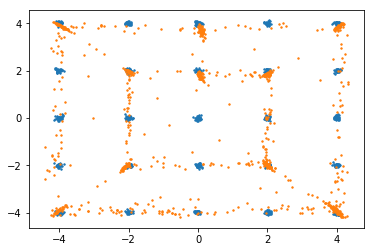

step 10600: discriminator: 1.124e+02, generator: -4.686e+01


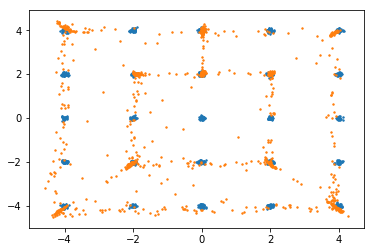

step 10700: discriminator: 9.007e+01, generator: -4.234e+01


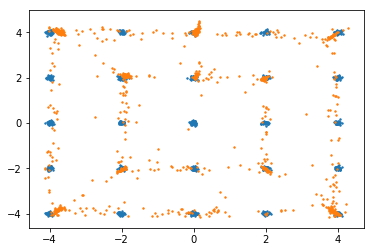

step 10800: discriminator: 9.615e+01, generator: -5.985e+01


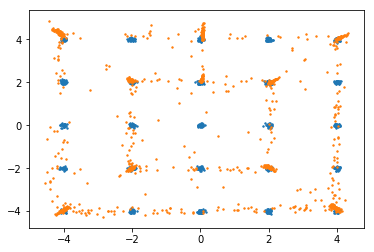

step 10900: discriminator: 1.109e+02, generator: -4.329e+01


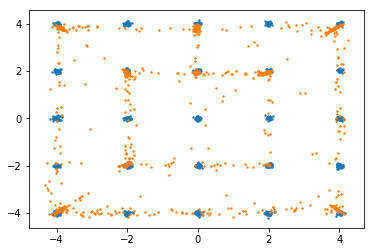

step 11000: discriminator: 1.005e+02, generator: -5.601e+01


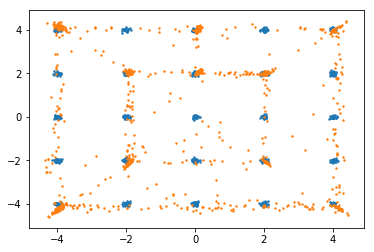

step 11100: discriminator: 8.963e+01, generator: -3.123e+01


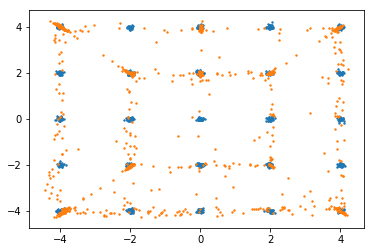

step 11200: discriminator: 8.683e+01, generator: -4.962e+01


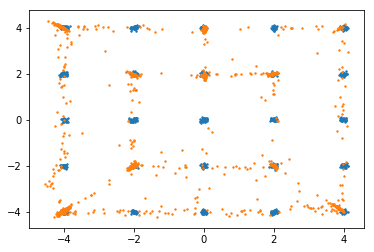

step 11300: discriminator: 8.390e+01, generator: -2.602e+01


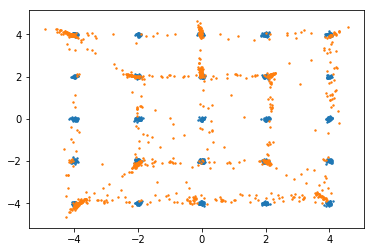

step 11400: discriminator: 1.066e+02, generator: -3.889e+01


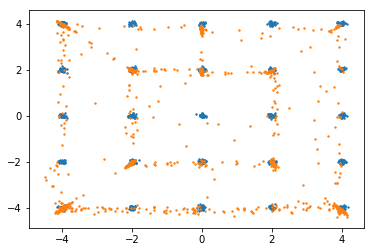

step 11500: discriminator: 9.405e+01, generator: -4.384e+01


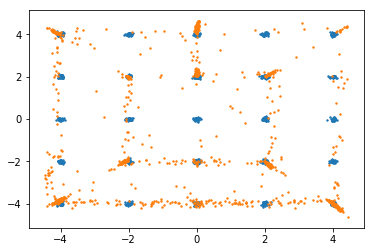

step 11600: discriminator: 8.462e+01, generator: -4.189e+01


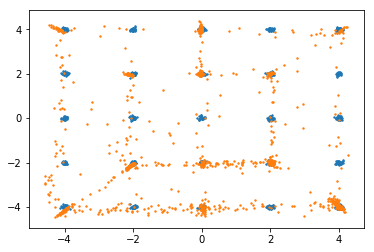

step 11700: discriminator: 1.032e+02, generator: -4.655e+01


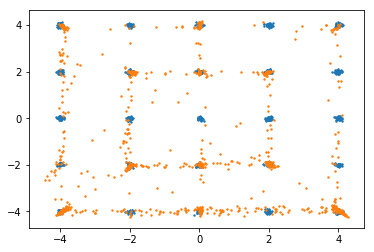

step 11800: discriminator: 9.953e+01, generator: -4.698e+01


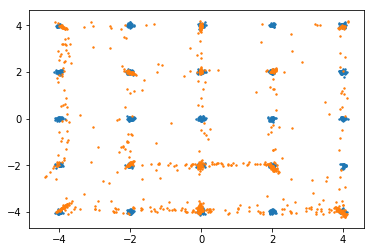

step 11900: discriminator: 1.045e+02, generator: -4.656e+01


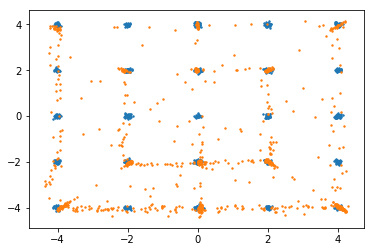

step 12000: discriminator: 9.841e+01, generator: -5.037e+01


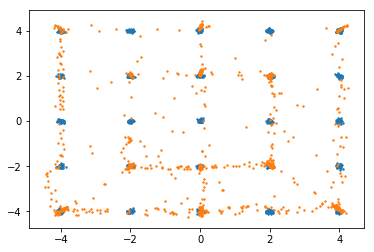

step 12100: discriminator: 1.025e+02, generator: -3.368e+01


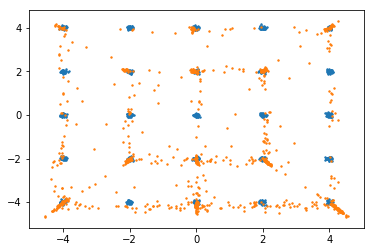

step 12200: discriminator: 1.049e+02, generator: -4.353e+01


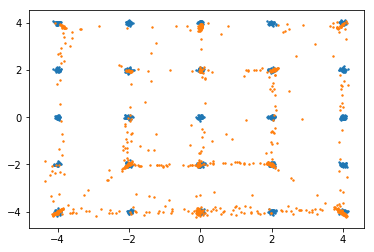

step 12300: discriminator: 1.127e+02, generator: -3.833e+01


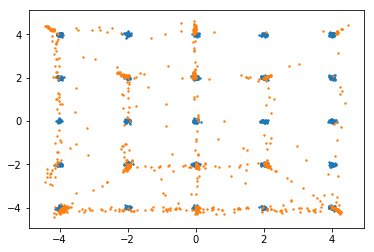

step 12400: discriminator: 1.085e+02, generator: -5.277e+01


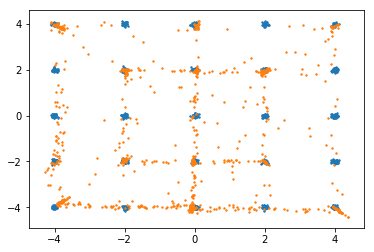

step 12500: discriminator: 1.118e+02, generator: -4.513e+01


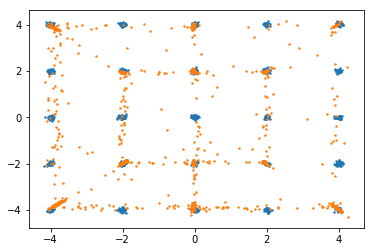

step 12600: discriminator: 1.237e+02, generator: -5.709e+01


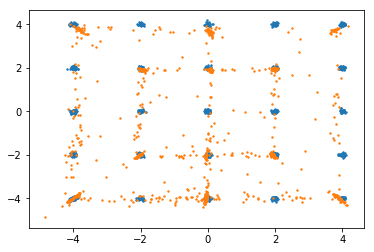

step 12700: discriminator: 9.848e+01, generator: -4.428e+01


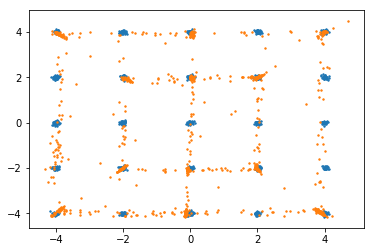

step 12800: discriminator: 8.896e+01, generator: -4.880e+01


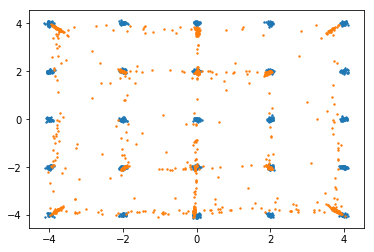

step 12900: discriminator: 1.011e+02, generator: -5.187e+01


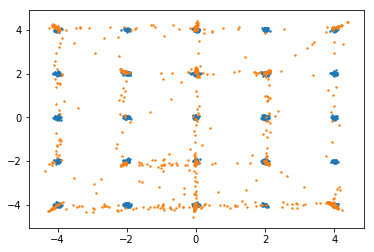

step 13000: discriminator: 1.019e+02, generator: -4.824e+01


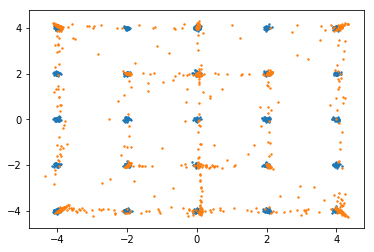

step 13100: discriminator: 1.145e+02, generator: -5.042e+01


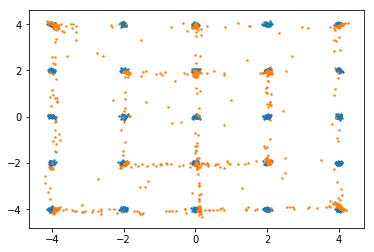

step 13200: discriminator: 1.032e+02, generator: -5.433e+01


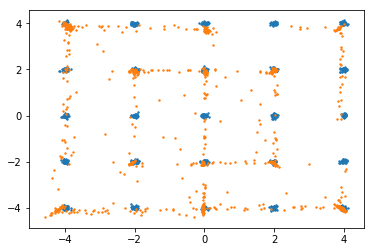

step 13300: discriminator: 1.091e+02, generator: -5.119e+01


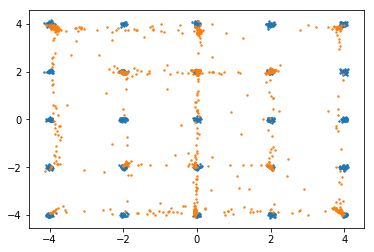

step 13400: discriminator: 9.702e+01, generator: -6.354e+01


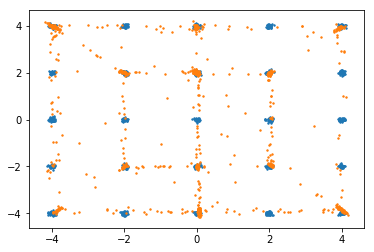

step 13500: discriminator: 1.030e+02, generator: -5.405e+01


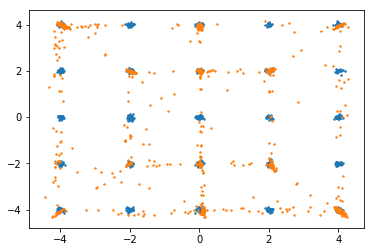

step 13600: discriminator: 1.073e+02, generator: -5.210e+01


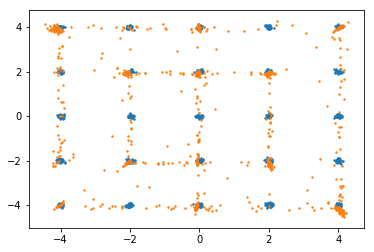

step 13700: discriminator: 1.127e+02, generator: -5.606e+01


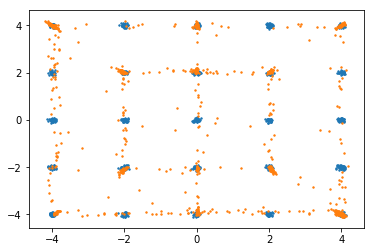

step 13800: discriminator: 9.874e+01, generator: -4.770e+01


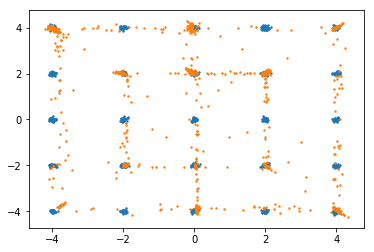

step 13900: discriminator: 1.057e+02, generator: -4.921e+01


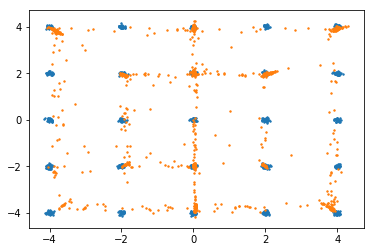

step 14000: discriminator: 8.844e+01, generator: -4.550e+01


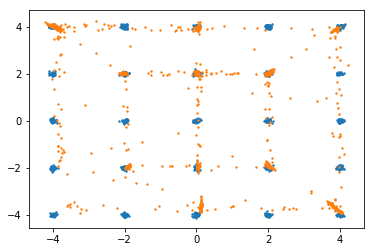

step 14100: discriminator: 1.092e+02, generator: -4.790e+01


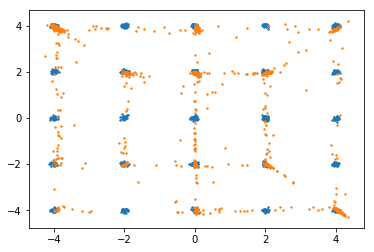

step 14200: discriminator: 1.108e+02, generator: -5.074e+01


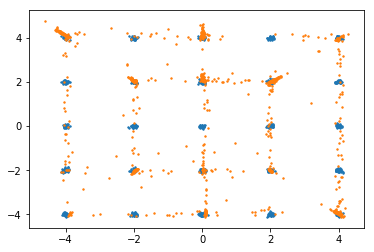

step 14300: discriminator: 1.091e+02, generator: -5.317e+01


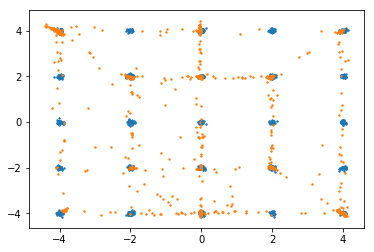

step 14400: discriminator: 1.258e+02, generator: -4.166e+01


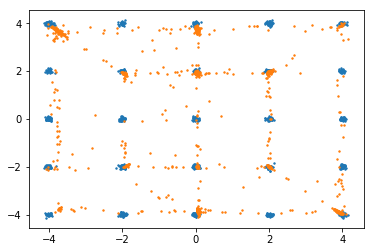

step 14500: discriminator: 1.068e+02, generator: -5.705e+01


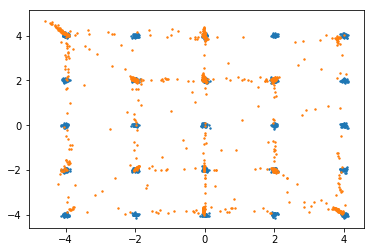

step 14600: discriminator: 9.126e+01, generator: -3.953e+01


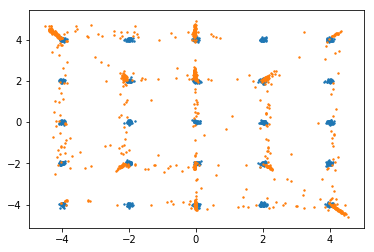

step 14700: discriminator: 1.034e+02, generator: -4.827e+01


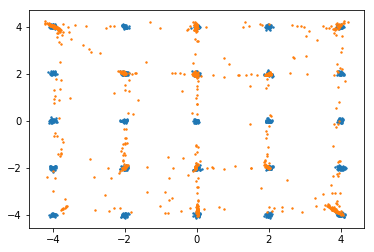

step 14800: discriminator: 9.650e+01, generator: -5.428e+01


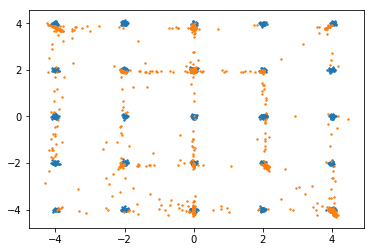

step 14900: discriminator: 8.711e+01, generator: -3.912e+01


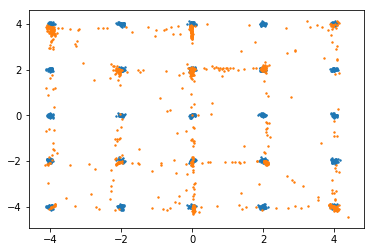

step 15000: discriminator: 1.052e+02, generator: -3.414e+01


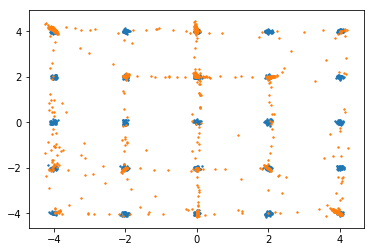

step 15100: discriminator: 1.108e+02, generator: -4.504e+01


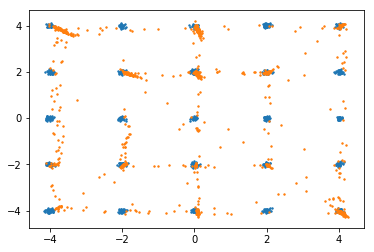

step 15200: discriminator: 1.048e+02, generator: -5.415e+01


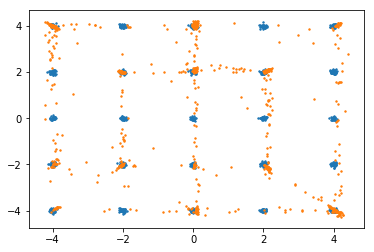

step 15300: discriminator: 9.781e+01, generator: -5.447e+01


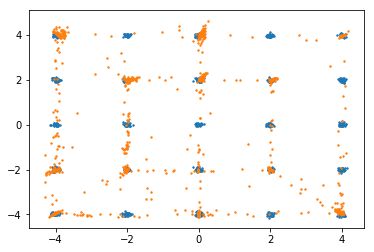

step 15400: discriminator: 9.997e+01, generator: -4.962e+01


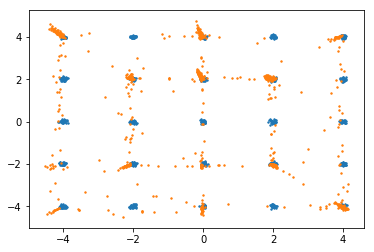

step 15500: discriminator: 1.144e+02, generator: -5.537e+01


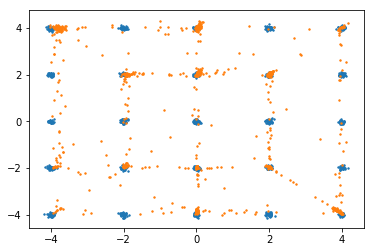

step 15600: discriminator: 1.079e+02, generator: -4.086e+01


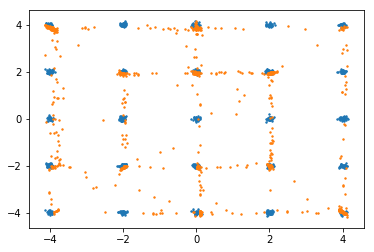

step 15700: discriminator: 1.220e+02, generator: -4.741e+01


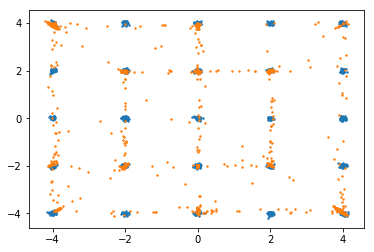

step 15800: discriminator: 1.080e+02, generator: -4.162e+01


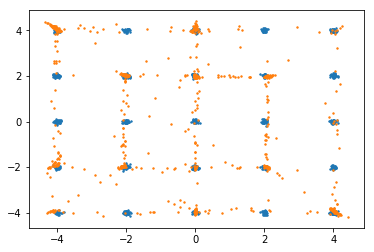

step 15900: discriminator: 1.086e+02, generator: -4.591e+01


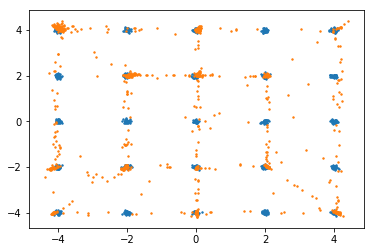

step 16000: discriminator: 1.036e+02, generator: -3.975e+01


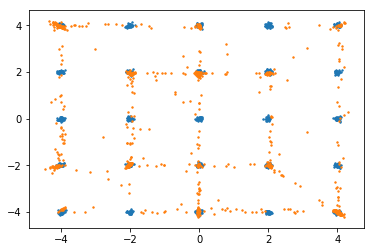

step 16100: discriminator: 1.060e+02, generator: -4.827e+01


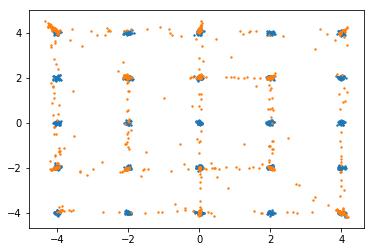

step 16200: discriminator: 1.088e+02, generator: -4.773e+01


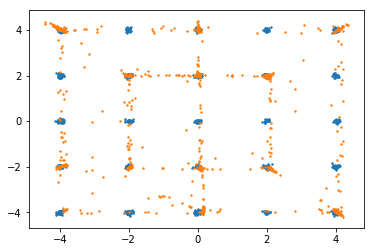

step 16300: discriminator: 1.202e+02, generator: -4.231e+01


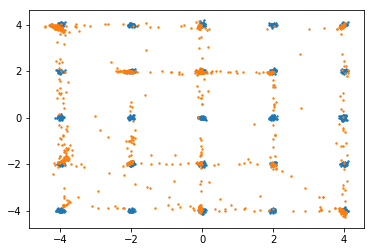

step 16400: discriminator: 1.129e+02, generator: -5.946e+01


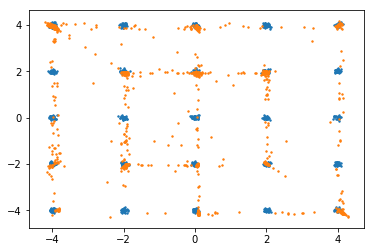

step 16500: discriminator: 9.896e+01, generator: -4.657e+01


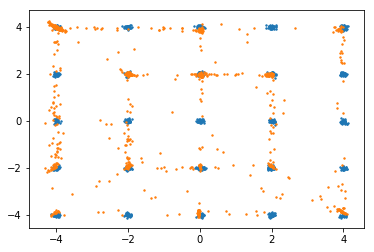

step 16600: discriminator: 1.047e+02, generator: -5.649e+01


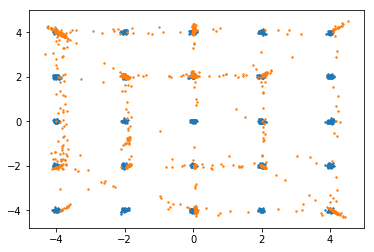

step 16700: discriminator: 1.004e+02, generator: -4.518e+01


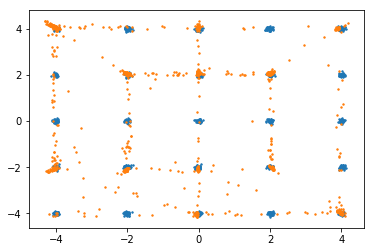

step 16800: discriminator: 1.218e+02, generator: -4.070e+01


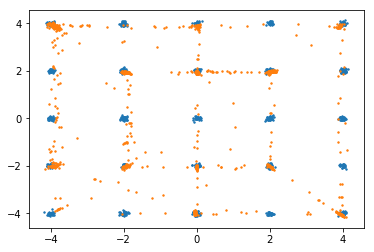

step 16900: discriminator: 1.055e+02, generator: -5.458e+01


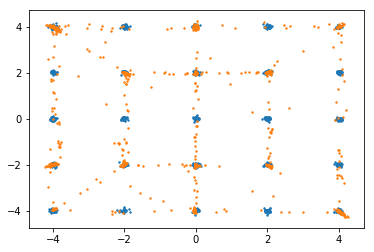

step 17000: discriminator: 1.267e+02, generator: -4.642e+01


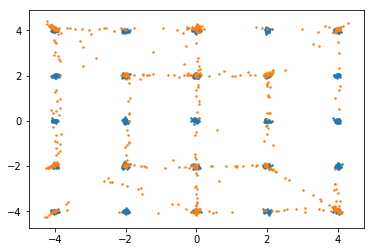

step 17100: discriminator: 9.839e+01, generator: -3.635e+01


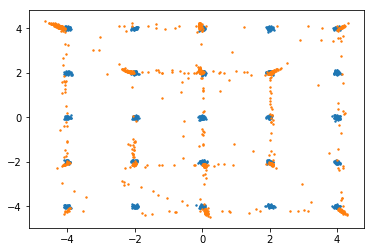

step 17200: discriminator: 1.175e+02, generator: -4.545e+01


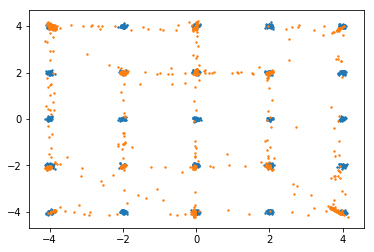

step 17300: discriminator: 1.100e+02, generator: -3.730e+01


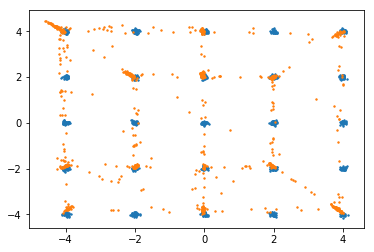

step 17400: discriminator: 1.206e+02, generator: -7.241e+01


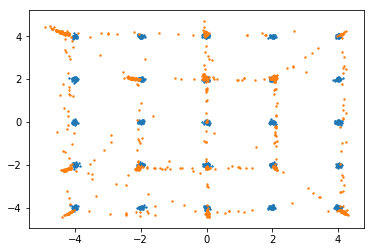

step 17500: discriminator: 1.167e+02, generator: -4.706e+01


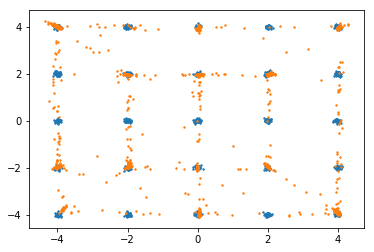

step 17600: discriminator: 1.085e+02, generator: -7.222e+01


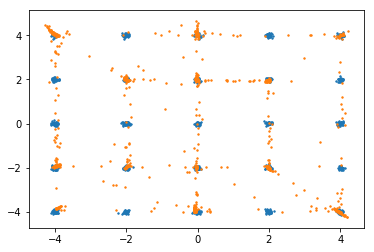

step 17700: discriminator: 9.967e+01, generator: -4.434e+01


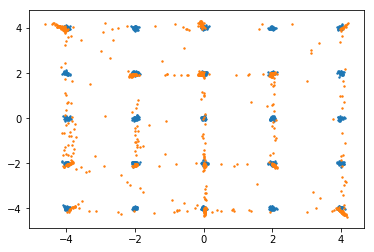

step 17800: discriminator: 9.571e+01, generator: -5.765e+01


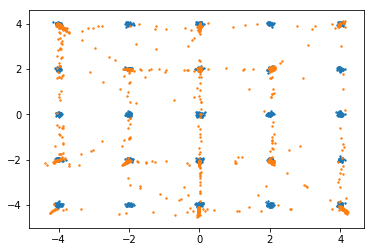

step 17900: discriminator: 1.110e+02, generator: -4.114e+01


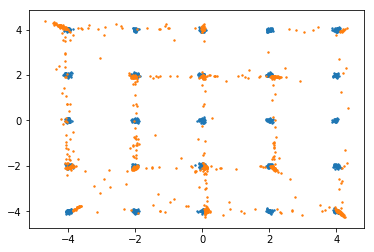

step 18000: discriminator: 1.064e+02, generator: -5.868e+01


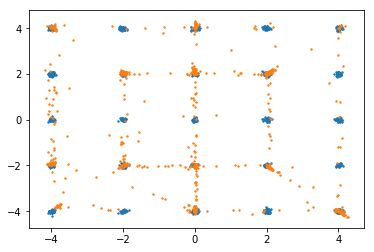

step 18100: discriminator: 1.033e+02, generator: -4.966e+01


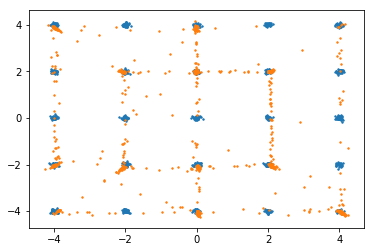

step 18200: discriminator: 1.056e+02, generator: -5.189e+01


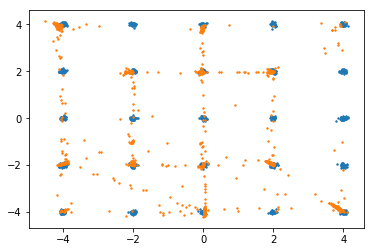

step 18300: discriminator: 1.107e+02, generator: -5.864e+01


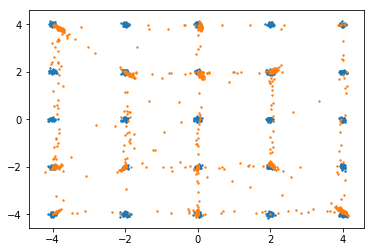

step 18400: discriminator: 1.168e+02, generator: -5.695e+01


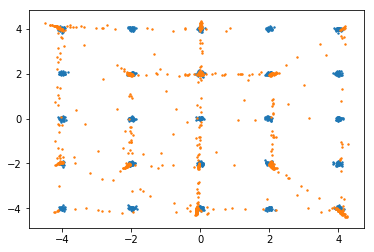

step 18500: discriminator: 9.512e+01, generator: -5.393e+01


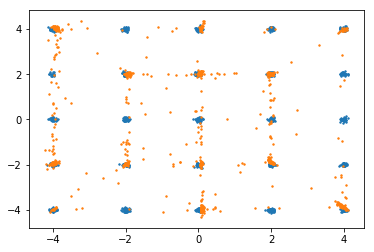

step 18600: discriminator: 1.225e+02, generator: -4.266e+01


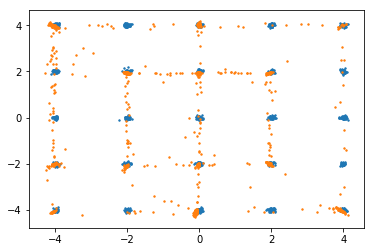

step 18700: discriminator: 1.172e+02, generator: -4.325e+01


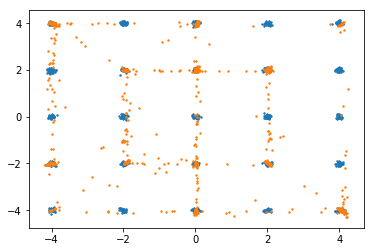

step 18800: discriminator: 1.281e+02, generator: -7.013e+01


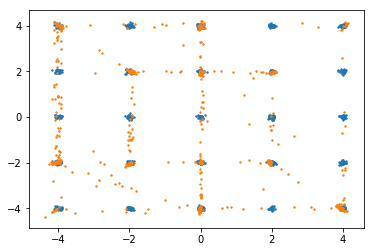

step 18900: discriminator: 1.091e+02, generator: -4.981e+01


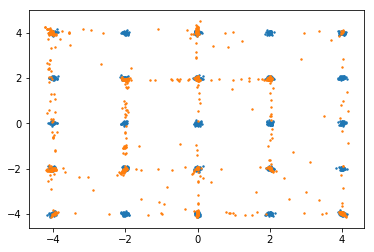

step 19000: discriminator: 1.110e+02, generator: -4.501e+01


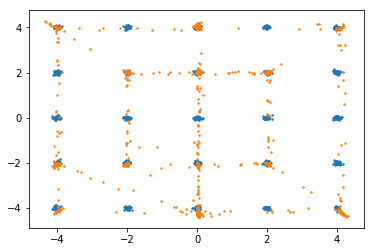

step 19100: discriminator: 1.043e+02, generator: -5.487e+01


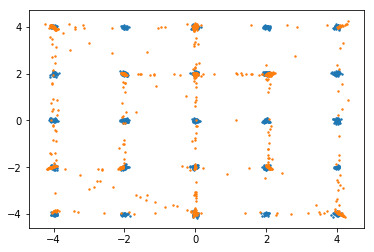

step 19200: discriminator: 1.177e+02, generator: -4.893e+01


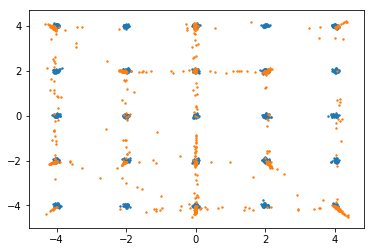

step 19300: discriminator: 1.144e+02, generator: -4.618e+01


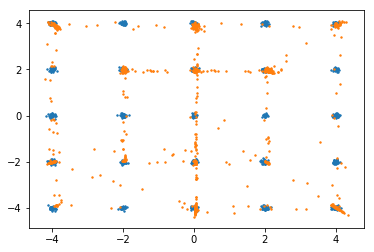

step 19400: discriminator: 1.210e+02, generator: -5.396e+01


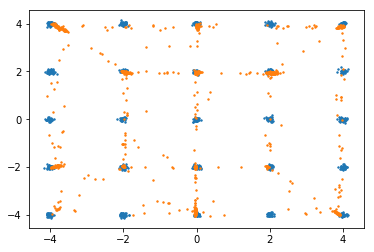

step 19500: discriminator: 1.090e+02, generator: -6.271e+01


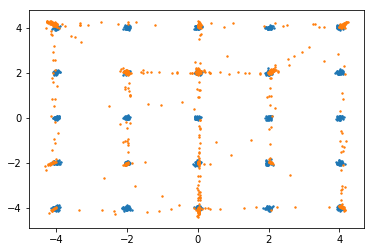

step 19600: discriminator: 1.162e+02, generator: -4.946e+01


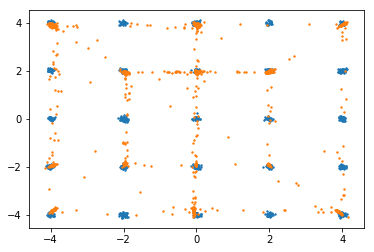

step 19700: discriminator: 1.025e+02, generator: -5.132e+01


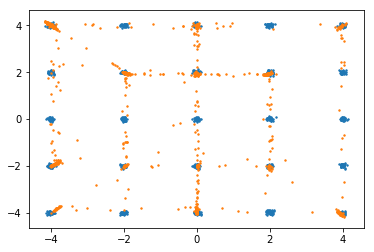

step 19800: discriminator: 1.102e+02, generator: -4.545e+01


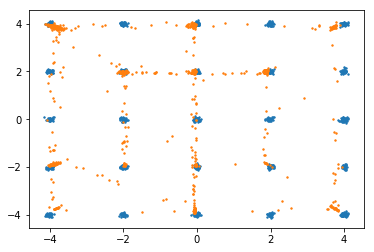

step 19900: discriminator: 1.048e+02, generator: -4.844e+01


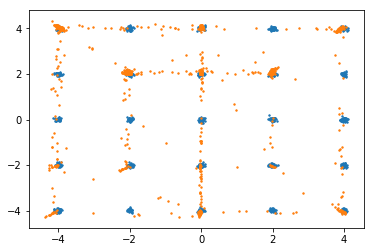

step 20000: discriminator: 8.553e+01, generator: -5.361e+01


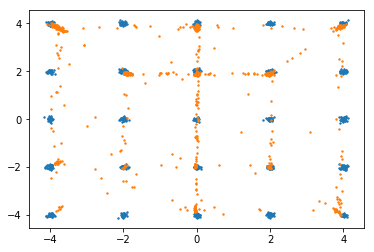

step 20100: discriminator: 9.000e+01, generator: -4.167e+01


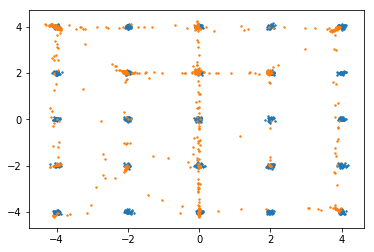

step 20200: discriminator: 9.723e+01, generator: -4.510e+01


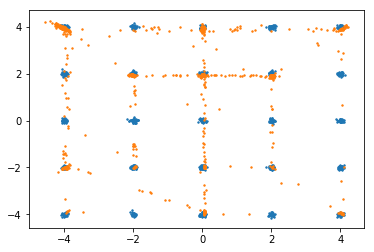

step 20300: discriminator: 1.025e+02, generator: -3.785e+01


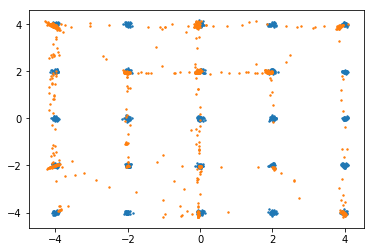

step 20400: discriminator: 9.860e+01, generator: -4.928e+01


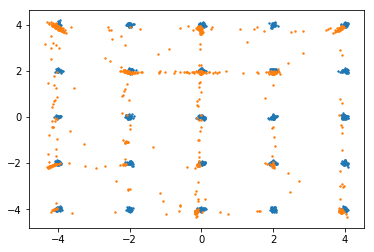

step 20500: discriminator: 9.338e+01, generator: -2.991e+01


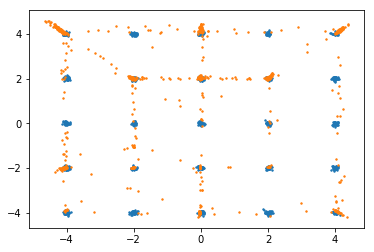

step 20600: discriminator: 1.005e+02, generator: -5.389e+01


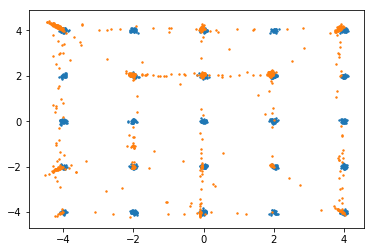

step 20700: discriminator: 1.107e+02, generator: -4.670e+01


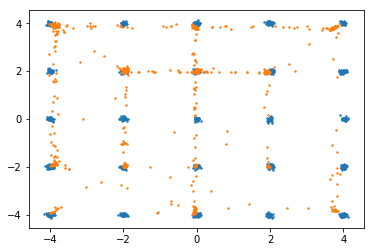

step 20800: discriminator: 8.541e+01, generator: -4.153e+01


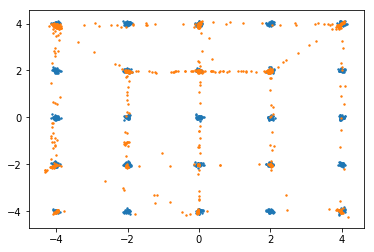

step 20900: discriminator: 1.150e+02, generator: -4.719e+01


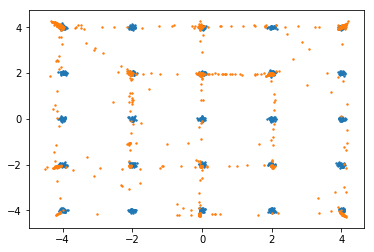

step 21000: discriminator: 1.050e+02, generator: -3.979e+01


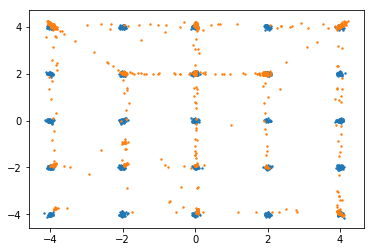

step 21100: discriminator: 1.060e+02, generator: -5.163e+01


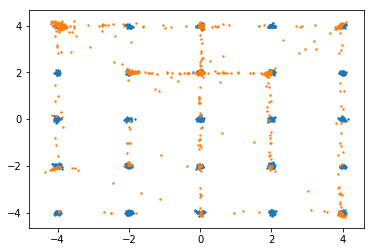

step 21200: discriminator: 9.113e+01, generator: -4.004e+01


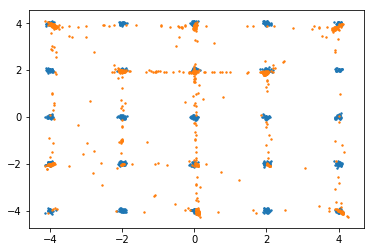

step 21300: discriminator: 1.158e+02, generator: -5.547e+01


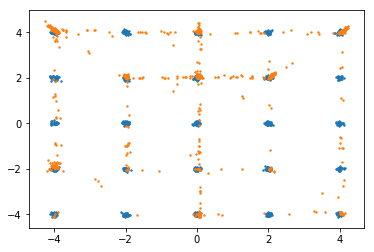

step 21400: discriminator: 1.161e+02, generator: -5.139e+01


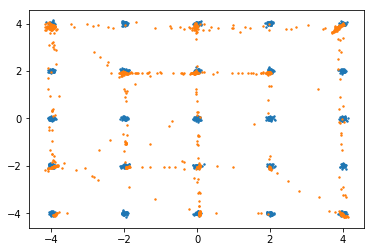

step 21500: discriminator: 1.126e+02, generator: -5.054e+01


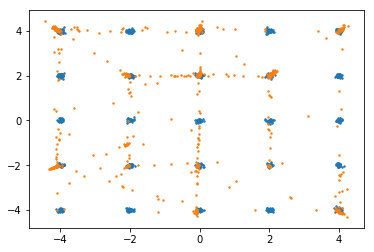

step 21600: discriminator: 1.134e+02, generator: -4.901e+01


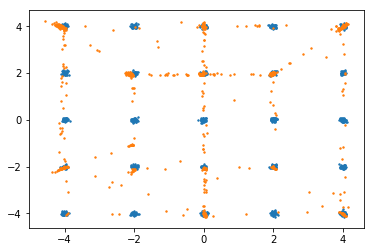

step 21700: discriminator: 1.032e+02, generator: -5.054e+01


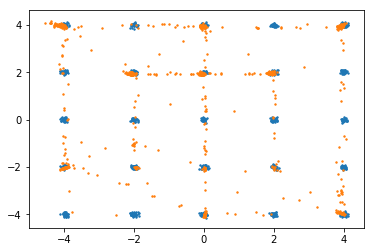

step 21800: discriminator: 1.012e+02, generator: -4.940e+01


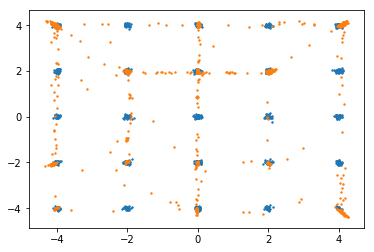

step 21900: discriminator: 1.214e+02, generator: -4.996e+01


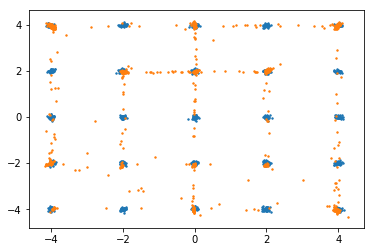

step 22000: discriminator: 1.048e+02, generator: -4.896e+01


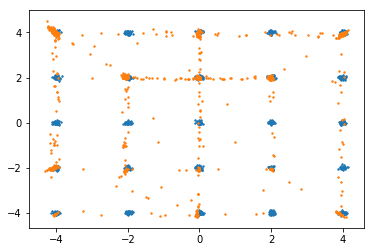

step 22100: discriminator: 1.046e+02, generator: -5.860e+01


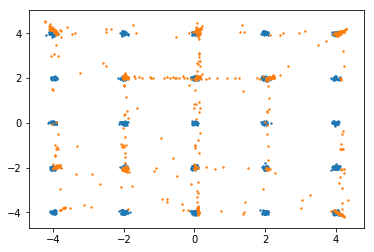

step 22200: discriminator: 1.174e+02, generator: -5.610e+01


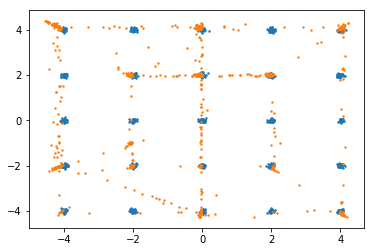

step 22300: discriminator: 1.129e+02, generator: -5.525e+01


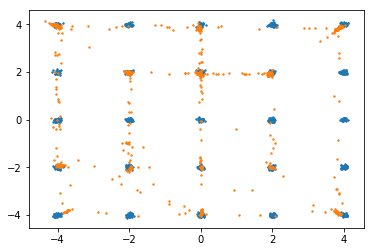

step 22400: discriminator: 1.225e+02, generator: -5.044e+01


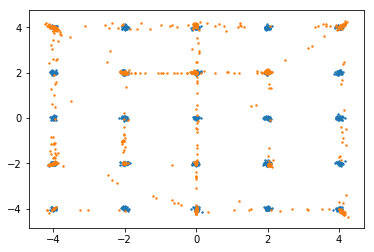

step 22500: discriminator: 1.133e+02, generator: -5.776e+01


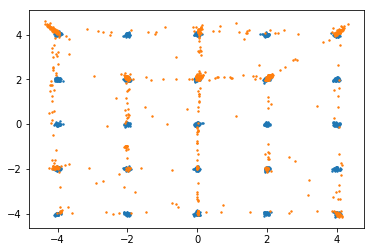

step 22600: discriminator: 1.151e+02, generator: -6.284e+01


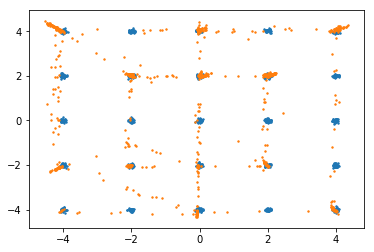

step 22700: discriminator: 9.287e+01, generator: -4.821e+01


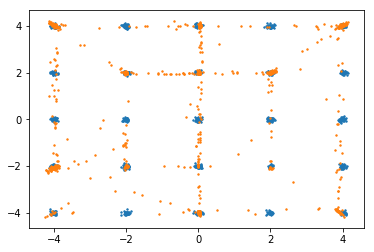

step 22800: discriminator: 1.156e+02, generator: -6.344e+01


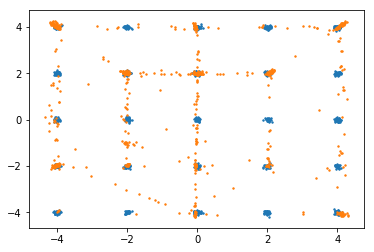

step 22900: discriminator: 1.070e+02, generator: -6.416e+01


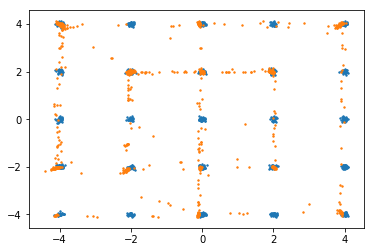

step 23000: discriminator: 1.176e+02, generator: -4.581e+01


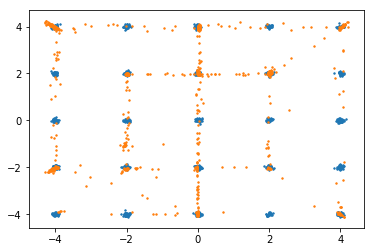

step 23100: discriminator: 1.153e+02, generator: -5.342e+01


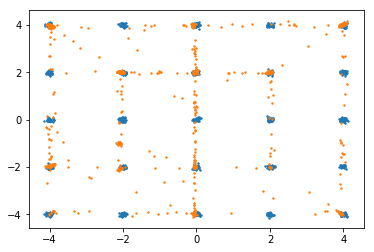

step 23200: discriminator: 1.096e+02, generator: -4.661e+01


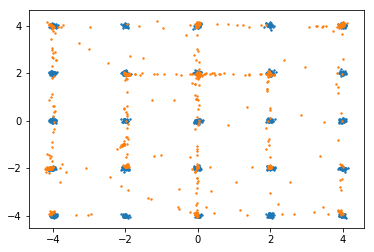

step 23300: discriminator: 1.146e+02, generator: -5.355e+01


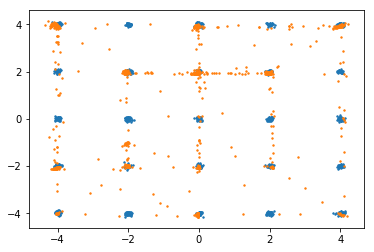

step 23400: discriminator: 1.190e+02, generator: -5.897e+01


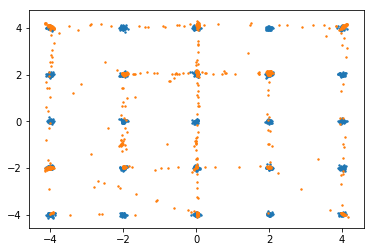

step 23500: discriminator: 9.176e+01, generator: -5.651e+01


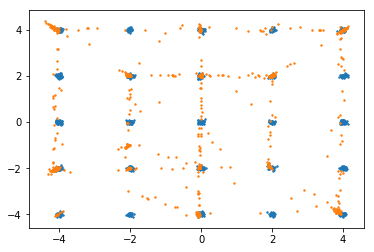

step 23600: discriminator: 1.125e+02, generator: -4.531e+01


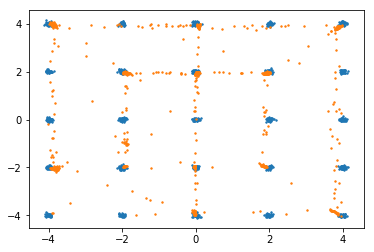

step 23700: discriminator: 1.162e+02, generator: -4.892e+01


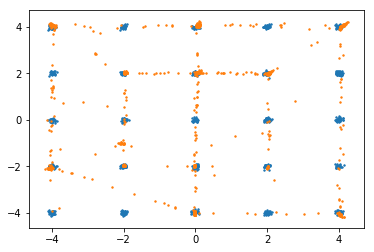

step 23800: discriminator: 1.041e+02, generator: -5.083e+01


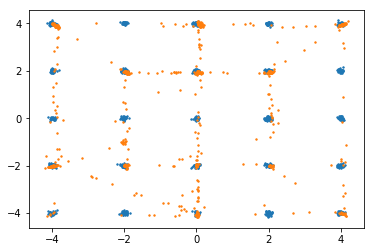

step 23900: discriminator: 1.310e+02, generator: -6.462e+01


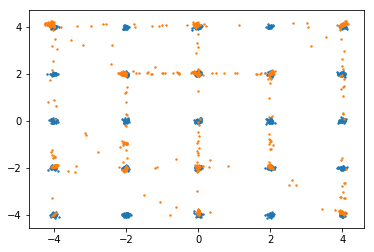

step 24000: discriminator: 1.039e+02, generator: -6.092e+01


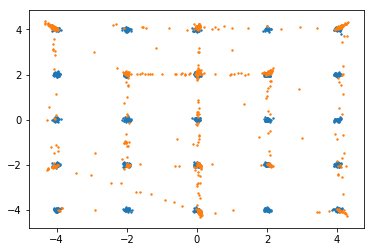

step 24100: discriminator: 1.178e+02, generator: -5.779e+01


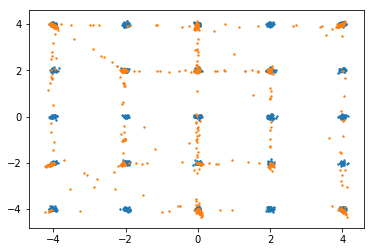

step 24200: discriminator: 1.112e+02, generator: -5.617e+01


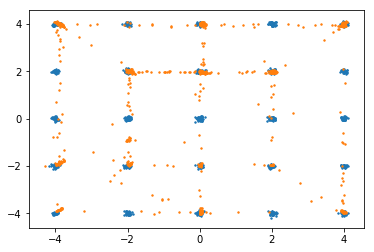

step 24300: discriminator: 9.547e+01, generator: -4.877e+01


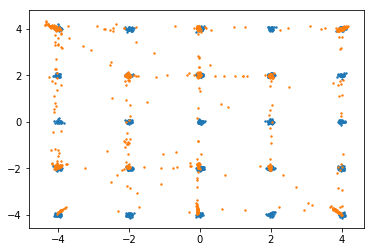

step 24400: discriminator: 1.205e+02, generator: -5.832e+01


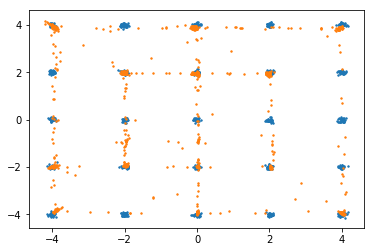

step 24500: discriminator: 1.157e+02, generator: -4.178e+01


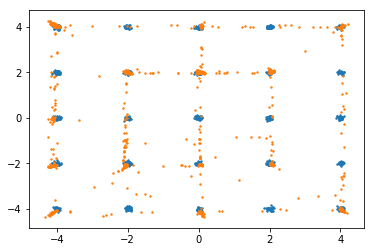

step 24600: discriminator: 1.058e+02, generator: -4.951e+01


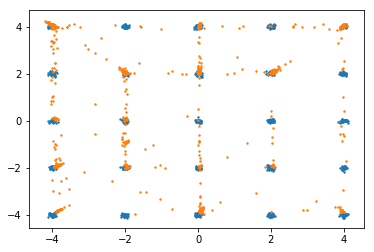

step 24700: discriminator: 1.099e+02, generator: -4.992e+01


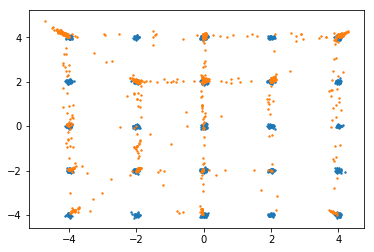

step 24800: discriminator: 1.125e+02, generator: -6.708e+01


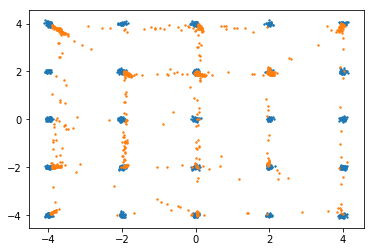

step 24900: discriminator: 1.023e+02, generator: -5.341e+01


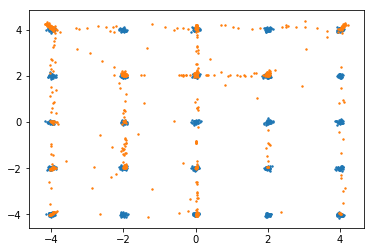

step 25000: discriminator: 1.098e+02, generator: -4.219e+01


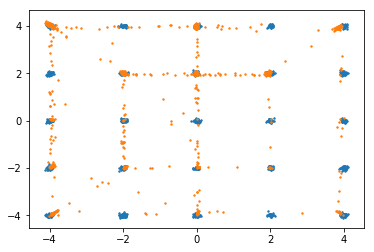

step 25100: discriminator: 9.747e+01, generator: -6.241e+01


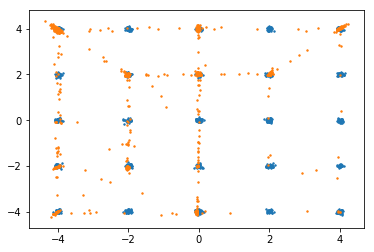

step 25200: discriminator: 1.131e+02, generator: -4.997e+01


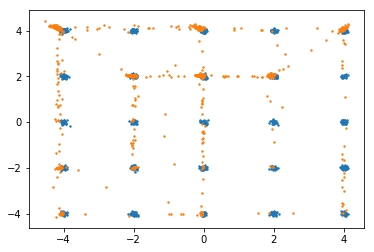

step 25300: discriminator: 1.015e+02, generator: -3.857e+01


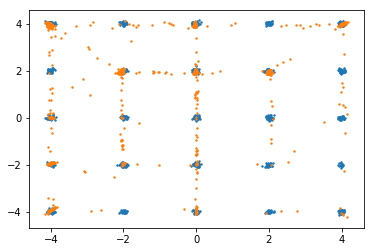

step 25400: discriminator: 1.053e+02, generator: -4.057e+01


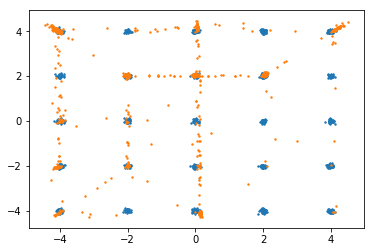

step 25500: discriminator: 1.188e+02, generator: -4.244e+01


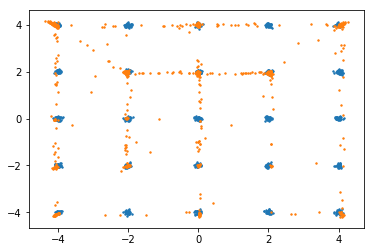

step 25600: discriminator: 1.170e+02, generator: -5.417e+01


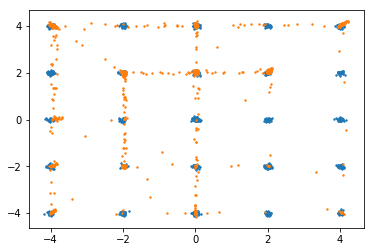

step 25700: discriminator: 1.175e+02, generator: -4.521e+01


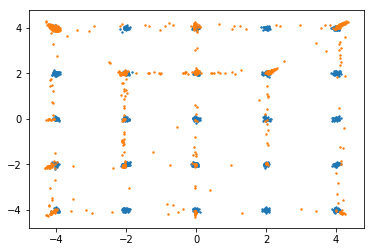

step 25800: discriminator: 1.088e+02, generator: -4.607e+01


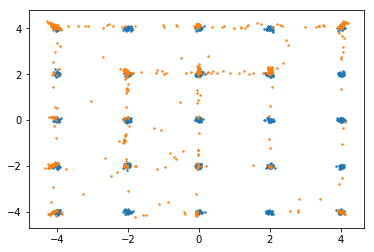

step 25900: discriminator: 1.217e+02, generator: -4.730e+01


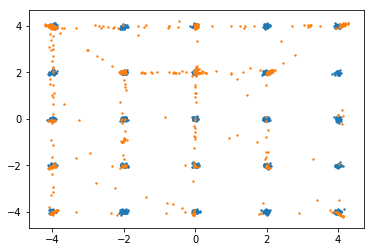

step 26000: discriminator: 1.152e+02, generator: -4.460e+01


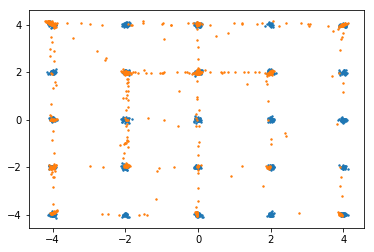

step 26100: discriminator: 9.524e+01, generator: -5.679e+01


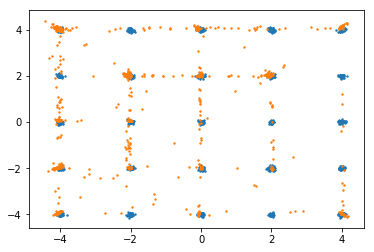

step 26200: discriminator: 1.131e+02, generator: -6.184e+01


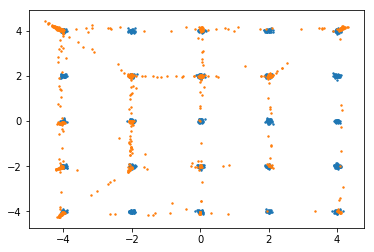

step 26300: discriminator: 1.374e+02, generator: -7.465e+01


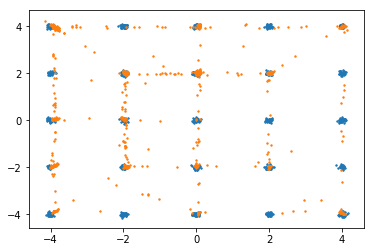

step 26400: discriminator: 1.124e+02, generator: -6.416e+01


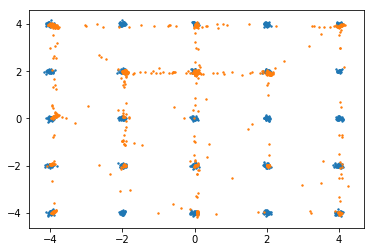

step 26500: discriminator: 1.084e+02, generator: -5.911e+01


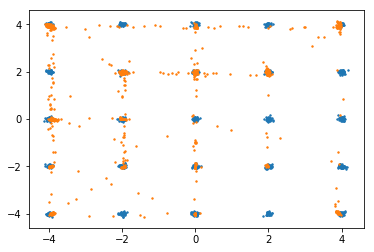

step 26600: discriminator: 1.232e+02, generator: -4.997e+01


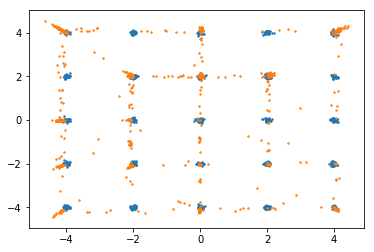

step 26700: discriminator: 1.158e+02, generator: -7.125e+01


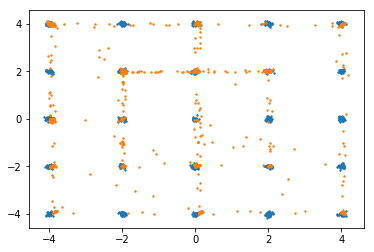

step 26800: discriminator: 1.264e+02, generator: -6.031e+01


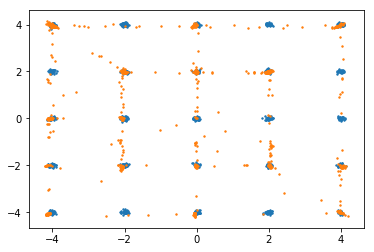

step 26900: discriminator: 1.128e+02, generator: -5.892e+01


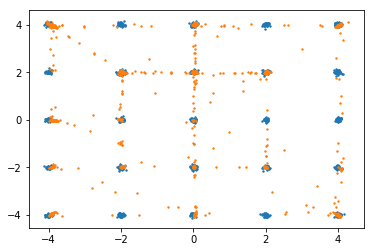

step 27000: discriminator: 1.329e+02, generator: -4.927e+01


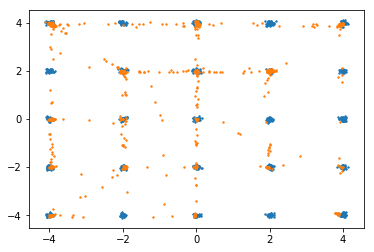

step 27100: discriminator: 1.141e+02, generator: -6.166e+01


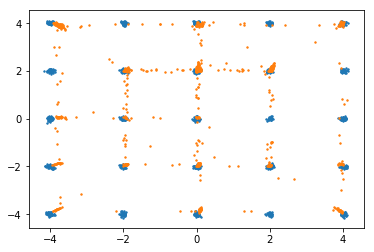

step 27200: discriminator: 1.177e+02, generator: -5.685e+01


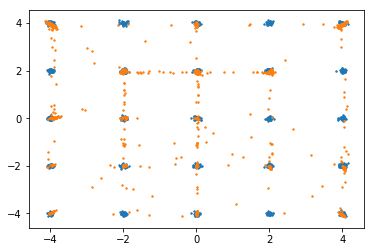

step 27300: discriminator: 1.130e+02, generator: -6.316e+01


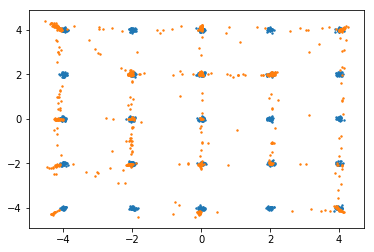

step 27400: discriminator: 1.327e+02, generator: -6.248e+01


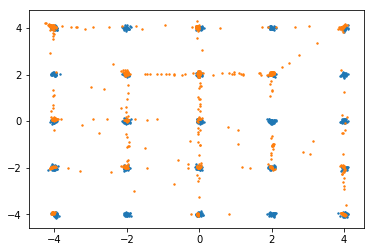

step 27500: discriminator: 1.246e+02, generator: -5.458e+01


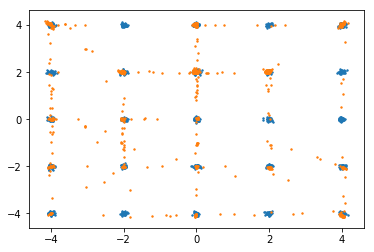

step 27600: discriminator: 1.170e+02, generator: -5.937e+01


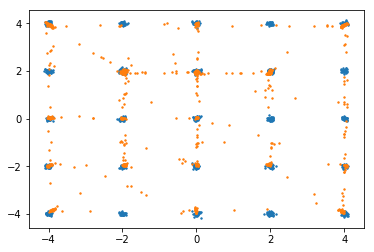

step 27700: discriminator: 1.220e+02, generator: -4.446e+01


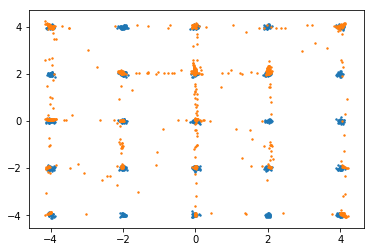

step 27800: discriminator: 1.372e+02, generator: -4.486e+01


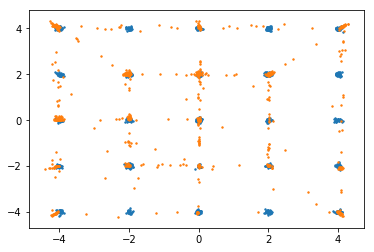

step 27900: discriminator: 1.113e+02, generator: -5.686e+01


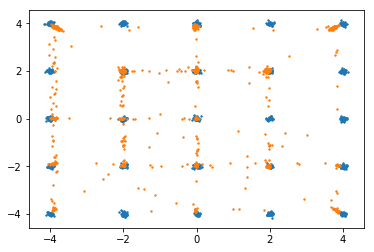

step 28000: discriminator: 1.034e+02, generator: -4.403e+01


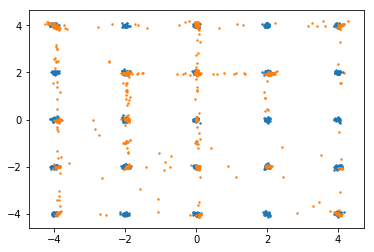

step 28100: discriminator: 1.164e+02, generator: -4.444e+01


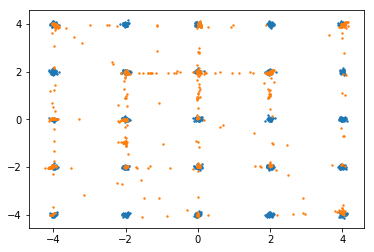

step 28200: discriminator: 1.319e+02, generator: -5.908e+01


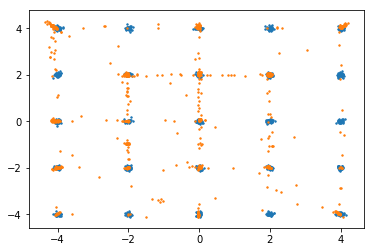

step 28300: discriminator: 1.293e+02, generator: -5.014e+01


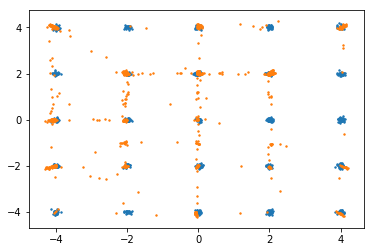

step 28400: discriminator: 1.392e+02, generator: -6.439e+01


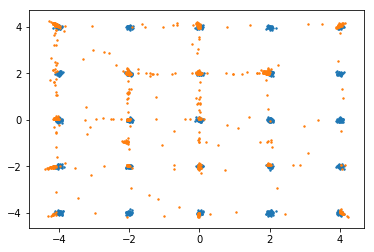

step 28500: discriminator: 1.146e+02, generator: -5.567e+01


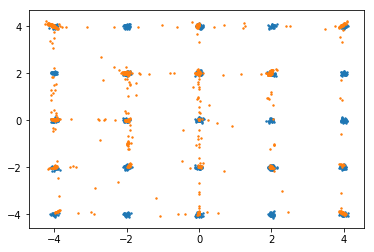

step 28600: discriminator: 1.214e+02, generator: -5.696e+01


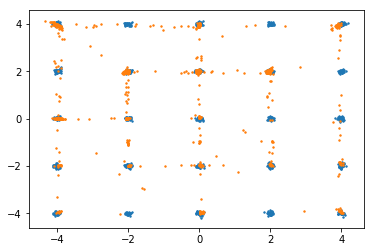

step 28700: discriminator: 1.177e+02, generator: -5.853e+01


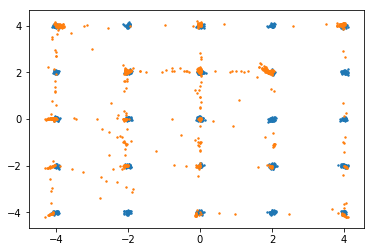

step 28800: discriminator: 1.187e+02, generator: -5.040e+01


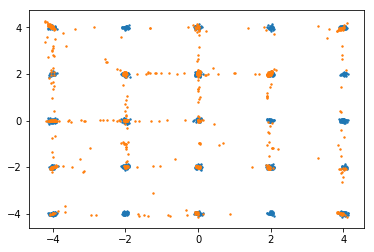

step 28900: discriminator: 1.078e+02, generator: -6.416e+01


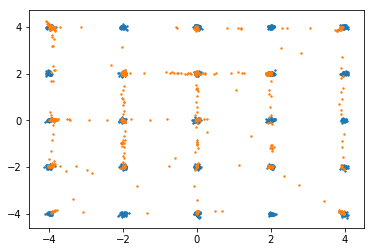

step 29000: discriminator: 1.234e+02, generator: -6.969e+01


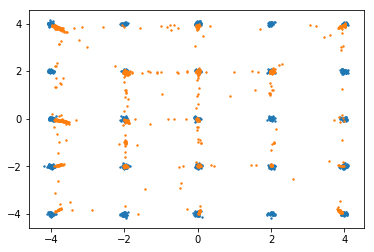

step 29100: discriminator: 1.262e+02, generator: -4.282e+01


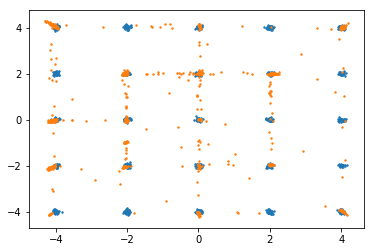

step 29200: discriminator: 1.193e+02, generator: -4.882e+01


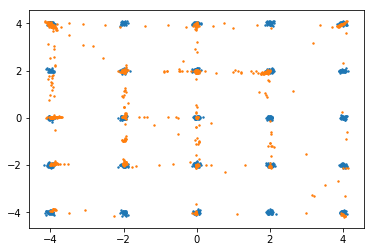

step 29300: discriminator: 1.215e+02, generator: -6.025e+01


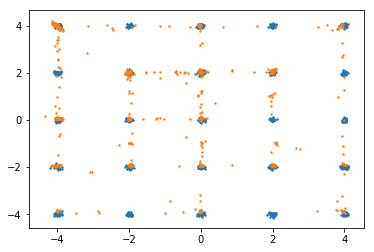

step 29400: discriminator: 1.276e+02, generator: -5.601e+01


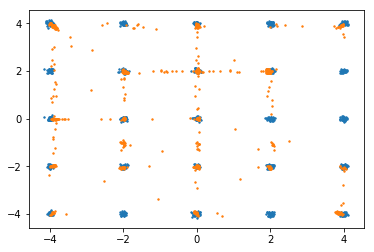

step 29500: discriminator: 1.161e+02, generator: -4.913e+01


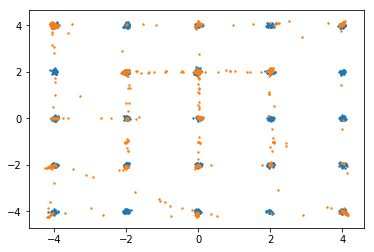

step 29600: discriminator: 1.328e+02, generator: -6.494e+01


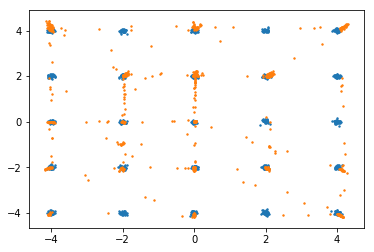

step 29700: discriminator: 1.307e+02, generator: -5.429e+01


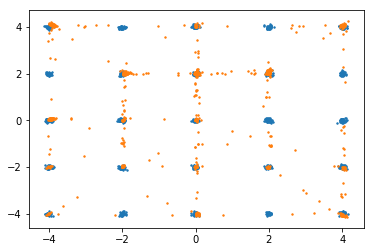

step 29800: discriminator: 1.309e+02, generator: -5.745e+01


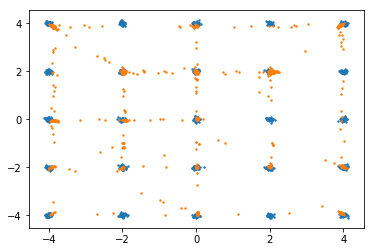

step 29900: discriminator: 1.227e+02, generator: -5.289e+01


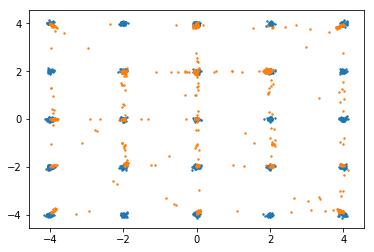

step 30000: discriminator: 1.237e+02, generator: -7.609e+01


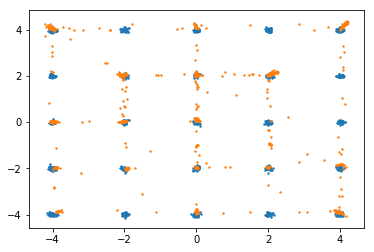

step 30100: discriminator: 1.168e+02, generator: -5.449e+01


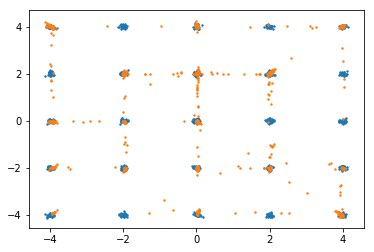

step 30200: discriminator: 1.334e+02, generator: -5.000e+01


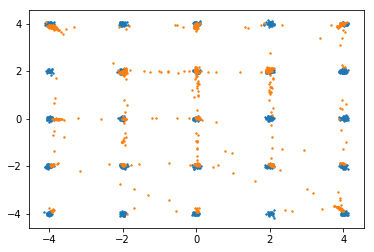

step 30300: discriminator: 1.158e+02, generator: -6.098e+01


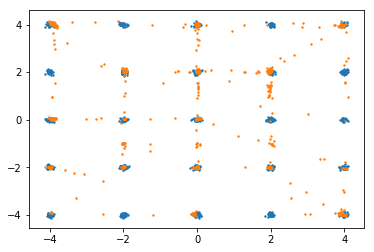

step 30400: discriminator: 1.295e+02, generator: -5.733e+01


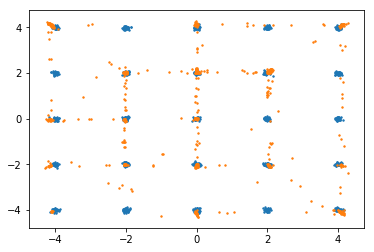

step 30500: discriminator: 1.415e+02, generator: -5.260e+01


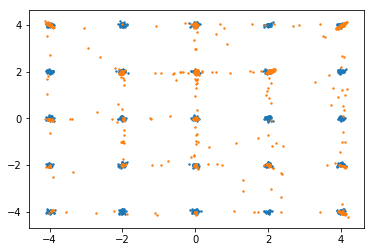

step 30600: discriminator: 1.185e+02, generator: -7.484e+01


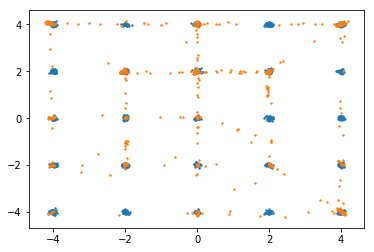

step 30700: discriminator: 1.022e+02, generator: -5.049e+01


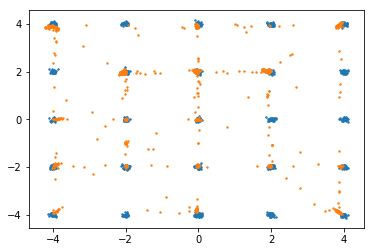

step 30800: discriminator: 1.261e+02, generator: -5.473e+01


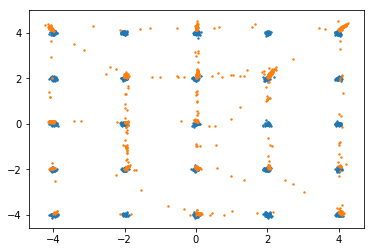

step 30900: discriminator: 1.327e+02, generator: -6.337e+01


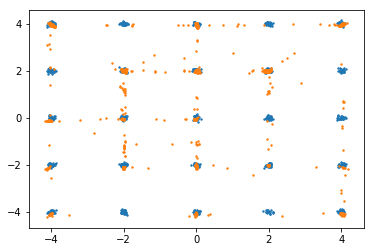

step 31000: discriminator: 1.301e+02, generator: -5.645e+01


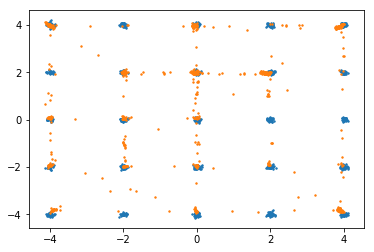

step 31100: discriminator: 1.101e+02, generator: -5.851e+01


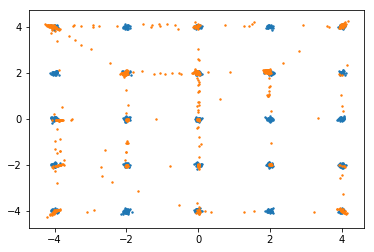

step 31200: discriminator: 1.261e+02, generator: -6.671e+01


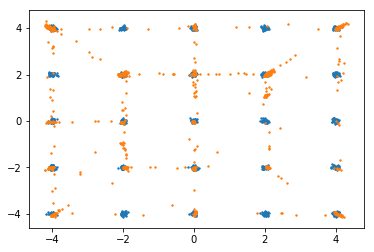

step 31300: discriminator: 1.202e+02, generator: -5.311e+01


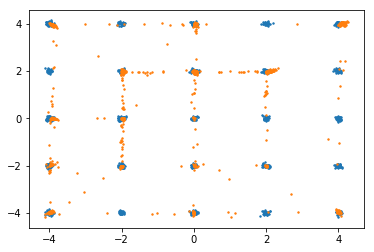

step 31400: discriminator: 1.298e+02, generator: -4.715e+01


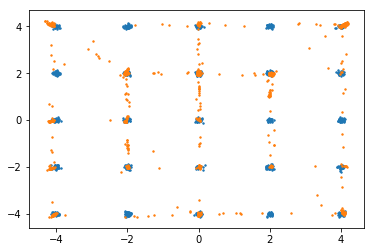

step 31500: discriminator: 1.258e+02, generator: -6.253e+01


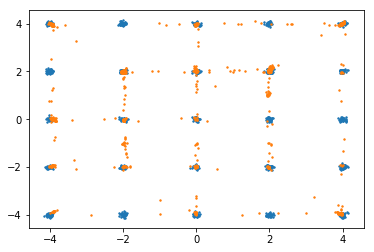

step 31600: discriminator: 1.258e+02, generator: -6.132e+01


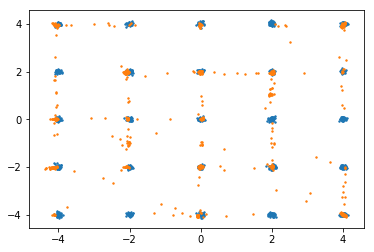

step 31700: discriminator: 1.251e+02, generator: -4.228e+01


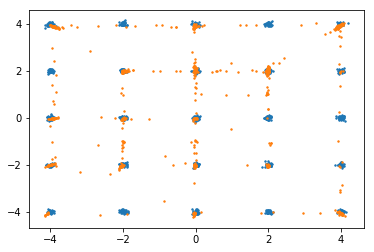

step 31800: discriminator: 1.218e+02, generator: -4.200e+01


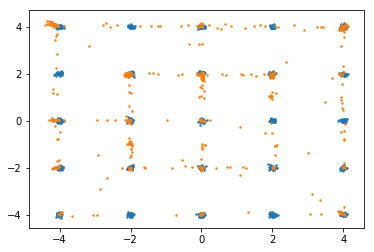

step 31900: discriminator: 1.166e+02, generator: -5.191e+01


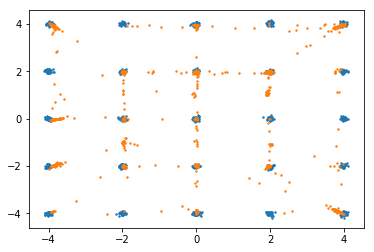

step 32000: discriminator: 1.173e+02, generator: -6.524e+01


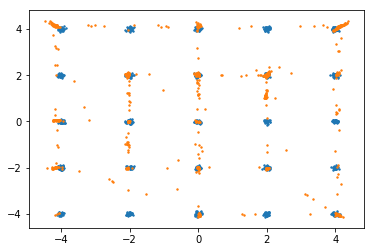

step 32100: discriminator: 1.226e+02, generator: -6.213e+01


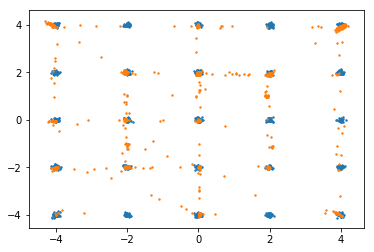

step 32200: discriminator: 1.370e+02, generator: -4.866e+01


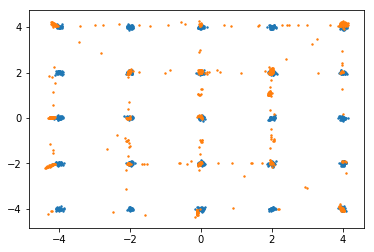

step 32300: discriminator: 1.289e+02, generator: -5.521e+01


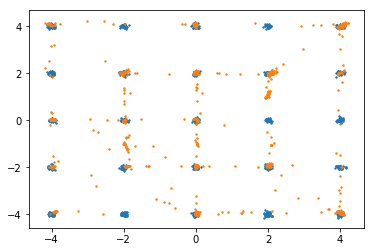

step 32400: discriminator: 1.229e+02, generator: -6.601e+01


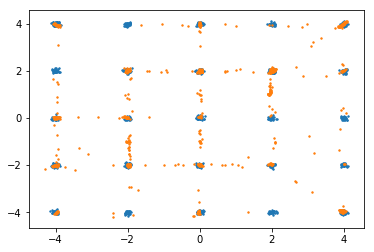

step 32500: discriminator: 1.172e+02, generator: -5.720e+01


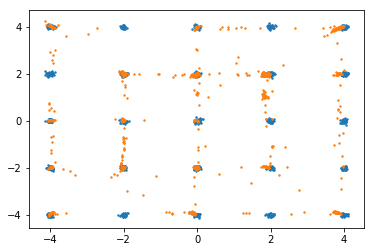

step 32600: discriminator: 1.264e+02, generator: -7.352e+01


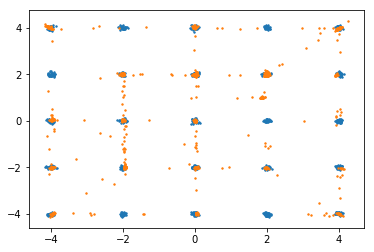

step 32700: discriminator: 1.208e+02, generator: -5.975e+01


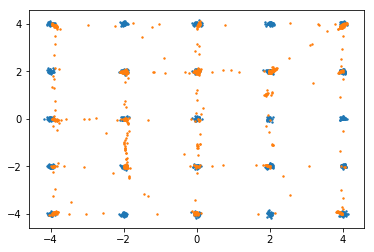

step 32800: discriminator: 1.245e+02, generator: -5.319e+01


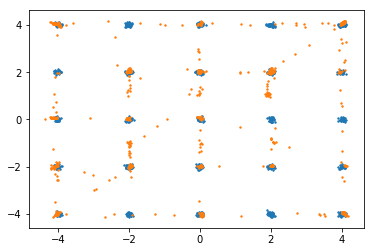

step 32900: discriminator: 1.125e+02, generator: -5.145e+01


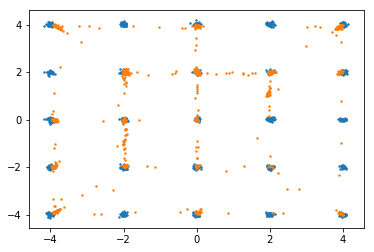

step 33000: discriminator: 1.087e+02, generator: -6.071e+01


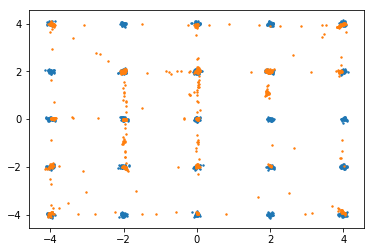

step 33100: discriminator: 1.239e+02, generator: -6.088e+01


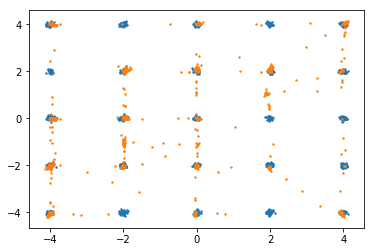

step 33200: discriminator: 1.198e+02, generator: -5.807e+01


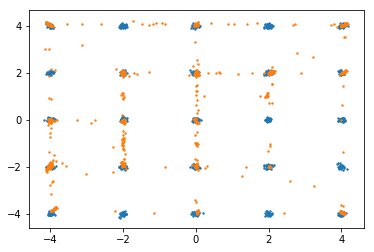

step 33300: discriminator: 1.212e+02, generator: -6.549e+01


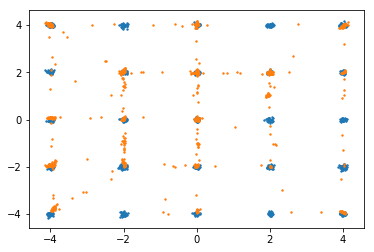

step 33400: discriminator: 1.267e+02, generator: -6.151e+01


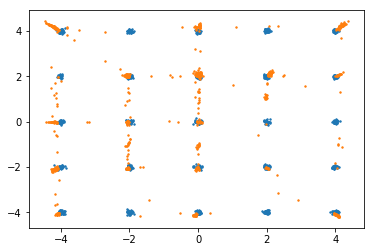

step 33500: discriminator: 1.178e+02, generator: -5.165e+01


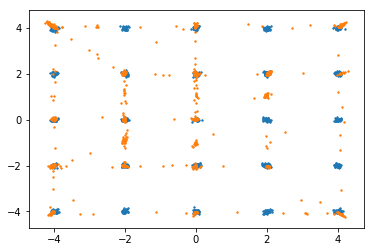

step 33600: discriminator: 1.397e+02, generator: -5.565e+01


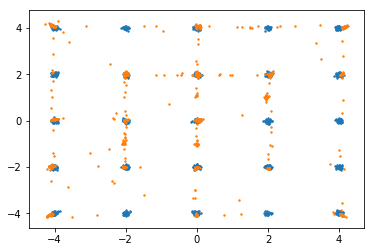

step 33700: discriminator: 1.265e+02, generator: -5.510e+01


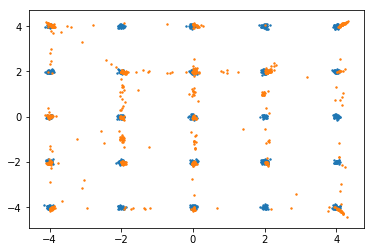

step 33800: discriminator: 1.213e+02, generator: -6.421e+01


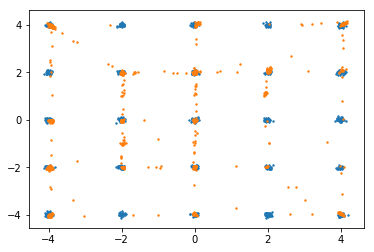

step 33900: discriminator: 1.361e+02, generator: -4.543e+01


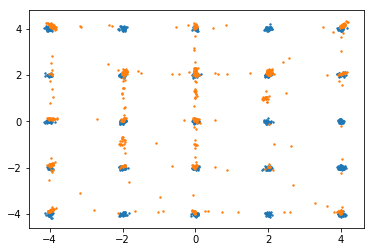

step 34000: discriminator: 1.250e+02, generator: -6.561e+01


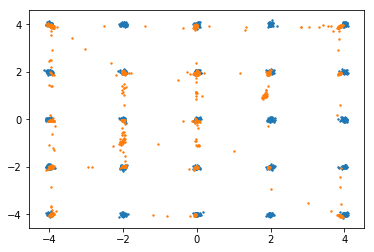

step 34100: discriminator: 1.248e+02, generator: -6.745e+01


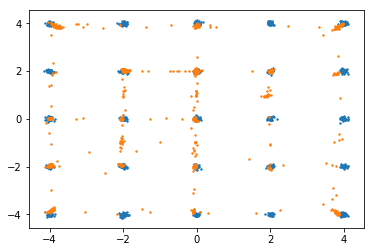

step 34200: discriminator: 1.130e+02, generator: -4.549e+01


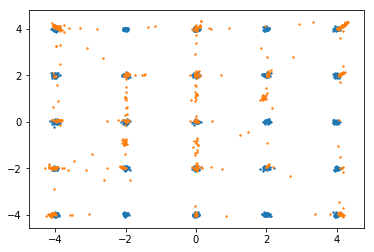

step 34300: discriminator: 1.339e+02, generator: -5.608e+01


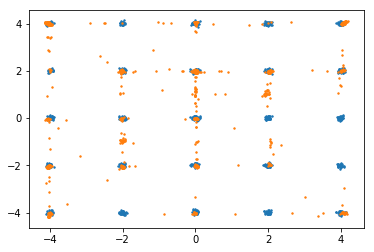

step 34400: discriminator: 1.218e+02, generator: -5.256e+01


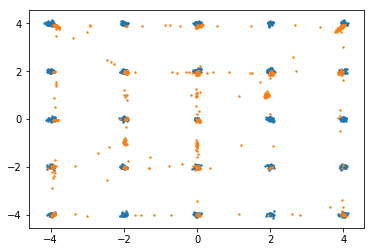

step 34500: discriminator: 1.225e+02, generator: -6.650e+01


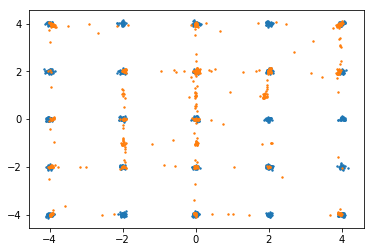

step 34600: discriminator: 1.351e+02, generator: -7.139e+01


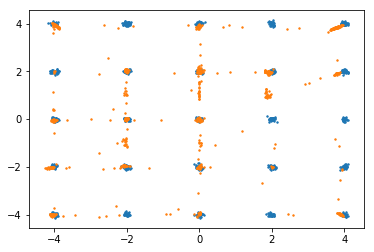

step 34700: discriminator: 1.275e+02, generator: -7.826e+01


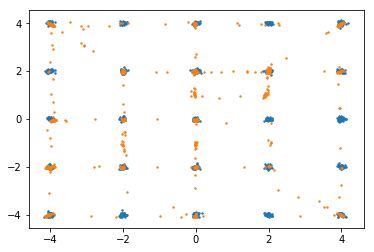

step 34800: discriminator: 1.320e+02, generator: -6.950e+01


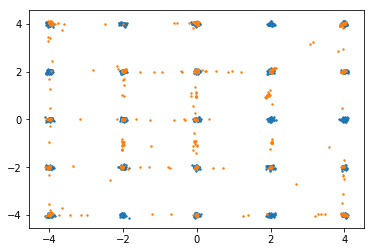

step 34900: discriminator: 1.202e+02, generator: -5.114e+01


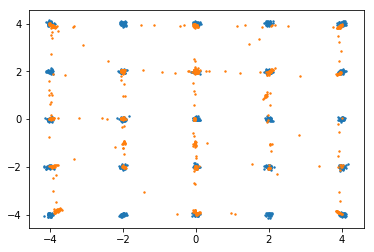

step 35000: discriminator: 1.088e+02, generator: -6.303e+01


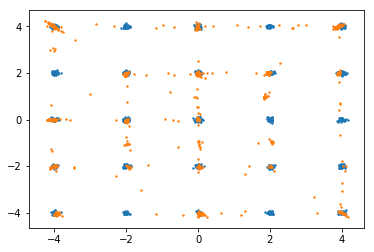

step 35100: discriminator: 1.299e+02, generator: -6.194e+01


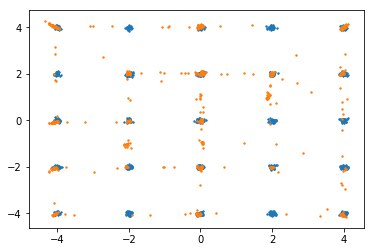

step 35200: discriminator: 1.353e+02, generator: -5.337e+01


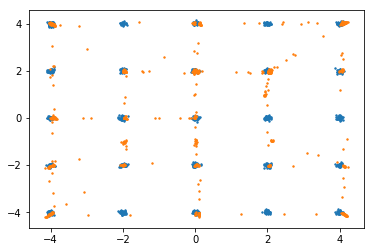

step 35300: discriminator: 1.328e+02, generator: -5.451e+01


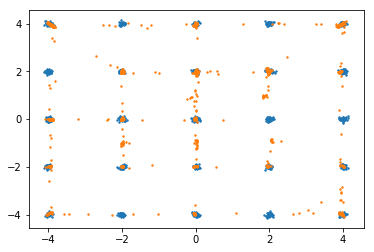

step 35400: discriminator: 1.366e+02, generator: -4.800e+01


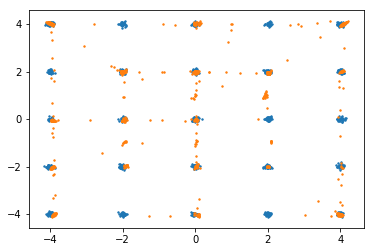

step 35500: discriminator: 1.262e+02, generator: -5.226e+01


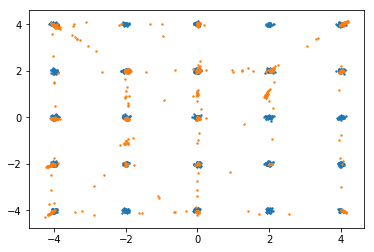

step 35600: discriminator: 1.283e+02, generator: -8.295e+01


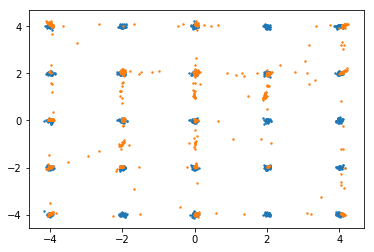

step 35700: discriminator: 1.371e+02, generator: -5.282e+01


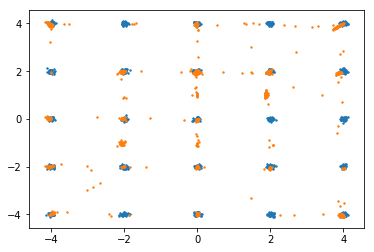

step 35800: discriminator: 1.186e+02, generator: -8.369e+01


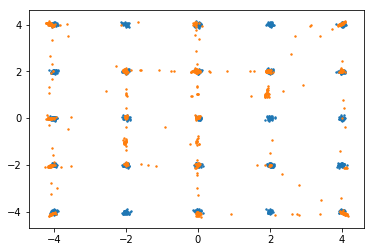

step 35900: discriminator: 1.415e+02, generator: -5.793e+01


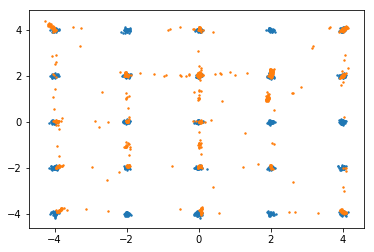

step 36000: discriminator: 1.212e+02, generator: -6.040e+01


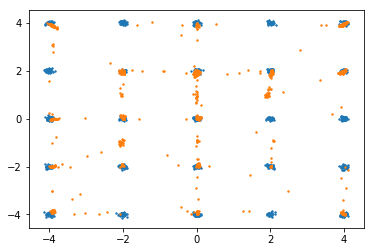

step 36100: discriminator: 1.372e+02, generator: -5.693e+01


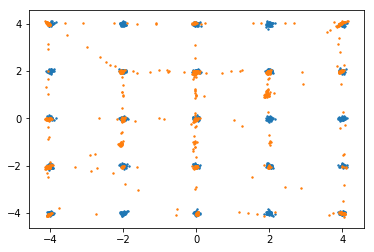

step 36200: discriminator: 1.247e+02, generator: -5.721e+01


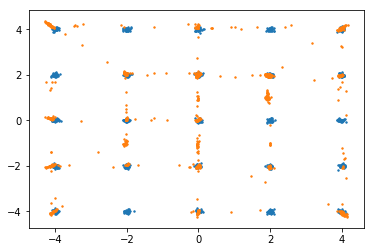

step 36300: discriminator: 1.296e+02, generator: -6.117e+01


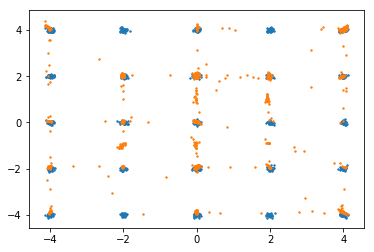

step 36400: discriminator: 1.340e+02, generator: -5.667e+01


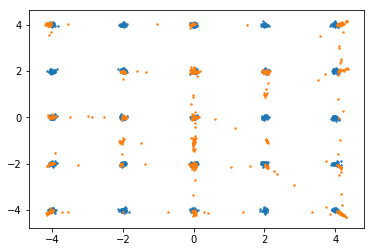

step 36500: discriminator: 1.255e+02, generator: -5.748e+01


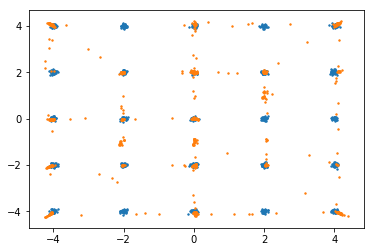

step 36600: discriminator: 1.345e+02, generator: -5.727e+01


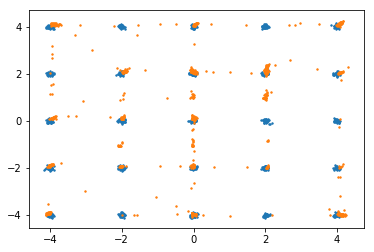

step 36700: discriminator: 1.203e+02, generator: -6.215e+01


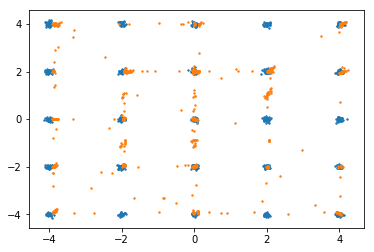

step 36800: discriminator: 1.352e+02, generator: -5.032e+01


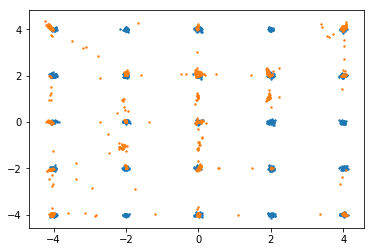

step 36900: discriminator: 1.228e+02, generator: -6.438e+01


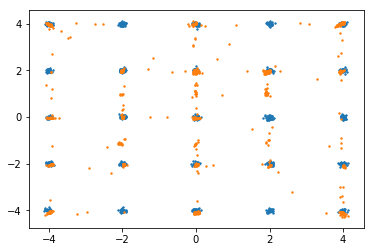

step 37000: discriminator: 1.378e+02, generator: -7.589e+01


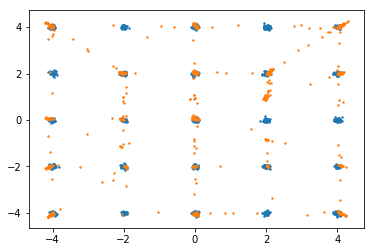

step 37100: discriminator: 1.467e+02, generator: -7.123e+01


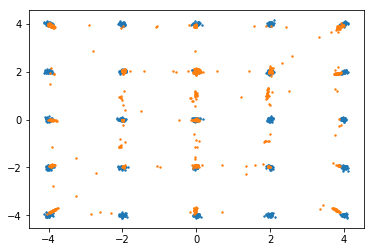

step 37200: discriminator: 1.274e+02, generator: -5.924e+01


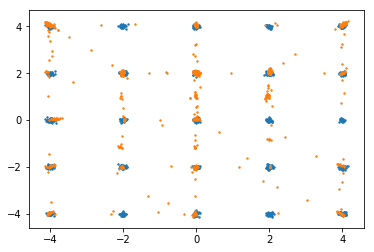

step 37300: discriminator: 1.172e+02, generator: -4.837e+01


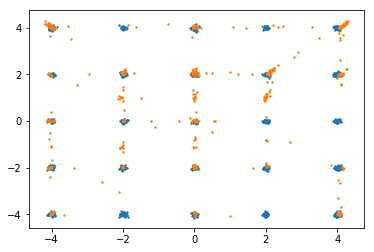

step 37400: discriminator: 1.319e+02, generator: -6.528e+01


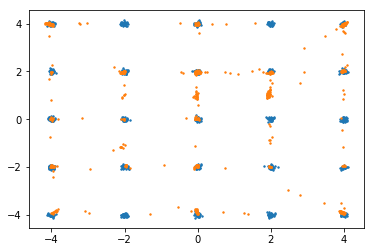

step 37500: discriminator: 1.294e+02, generator: -5.648e+01


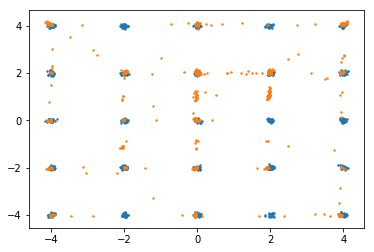

step 37600: discriminator: 1.391e+02, generator: -6.191e+01


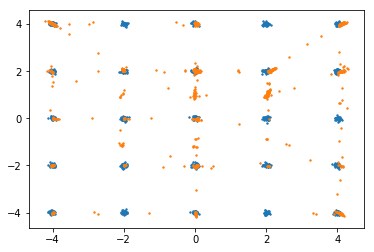

step 37700: discriminator: 1.290e+02, generator: -6.393e+01


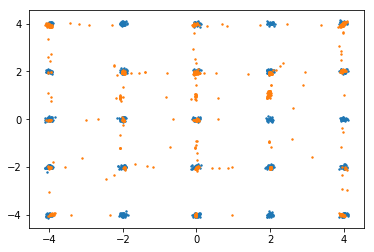

step 37800: discriminator: 1.333e+02, generator: -5.614e+01


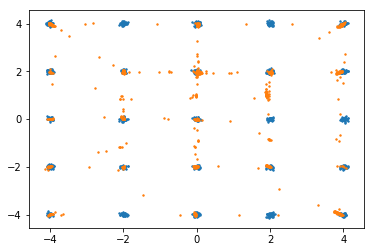

step 37900: discriminator: 1.386e+02, generator: -5.225e+01


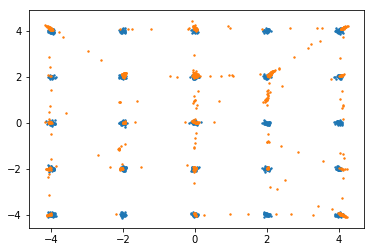

step 38000: discriminator: 1.249e+02, generator: -6.698e+01


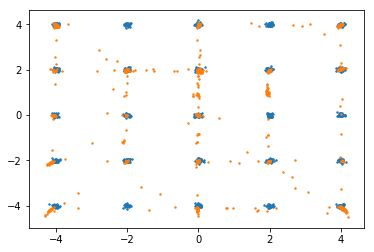

step 38100: discriminator: 1.396e+02, generator: -6.780e+01


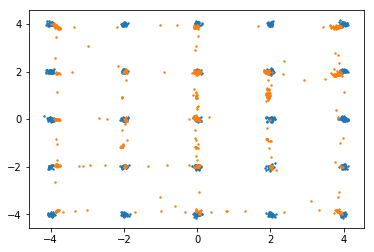

step 38200: discriminator: 1.283e+02, generator: -6.859e+01


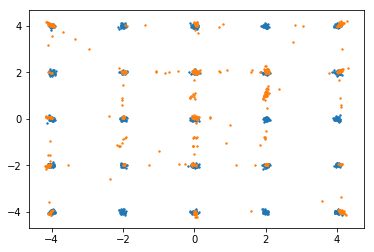

step 38300: discriminator: 1.320e+02, generator: -5.585e+01


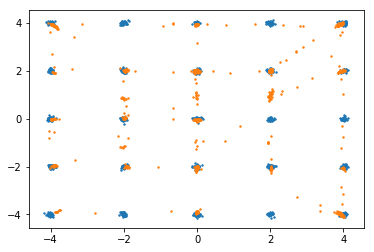

step 38400: discriminator: 1.226e+02, generator: -6.152e+01


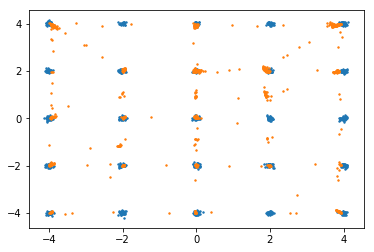

step 38500: discriminator: 1.291e+02, generator: -8.044e+01


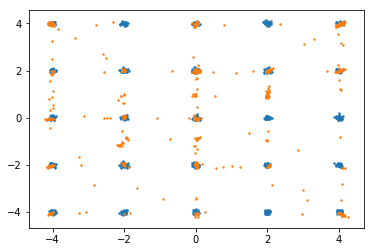

step 38600: discriminator: 1.324e+02, generator: -5.540e+01


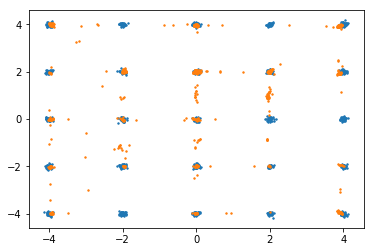

step 38700: discriminator: 1.327e+02, generator: -7.433e+01


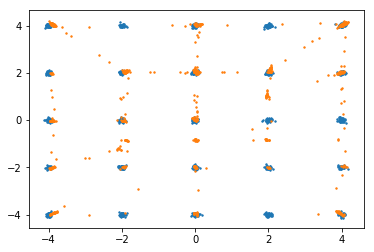

step 38800: discriminator: 1.269e+02, generator: -6.523e+01


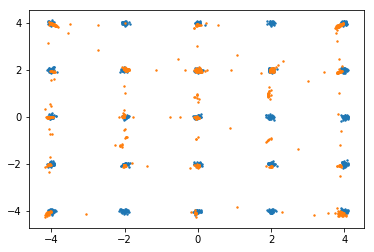

step 38900: discriminator: 1.310e+02, generator: -6.167e+01


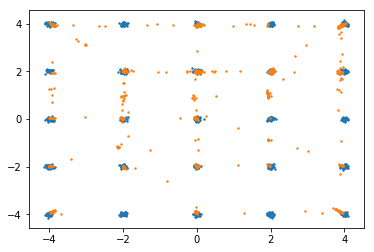

step 39000: discriminator: 1.264e+02, generator: -5.019e+01


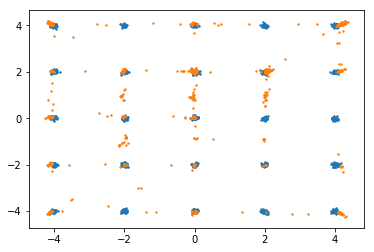

step 39100: discriminator: 1.283e+02, generator: -5.411e+01


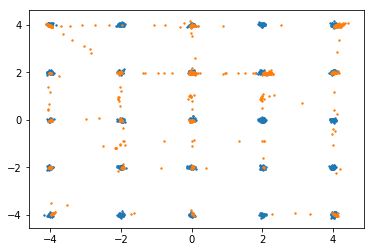

step 39200: discriminator: 1.137e+02, generator: -5.116e+01


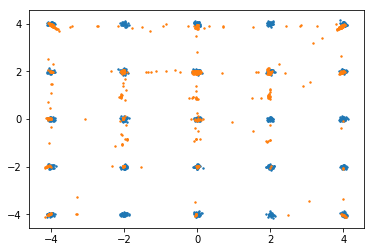

step 39300: discriminator: 1.181e+02, generator: -5.823e+01


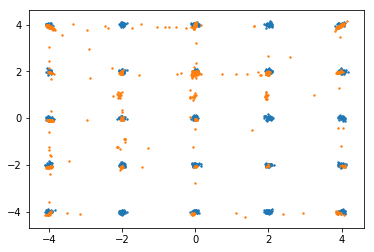

step 39400: discriminator: 1.332e+02, generator: -7.343e+01


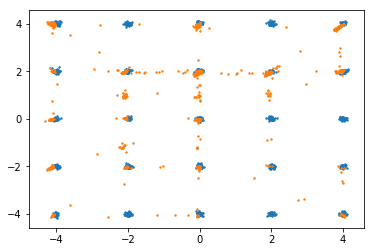

step 39500: discriminator: 1.349e+02, generator: -5.671e+01


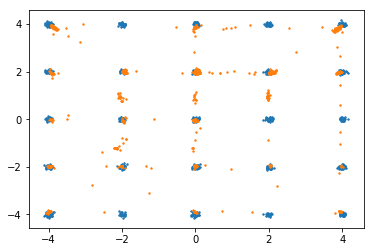

step 39600: discriminator: 1.276e+02, generator: -5.686e+01


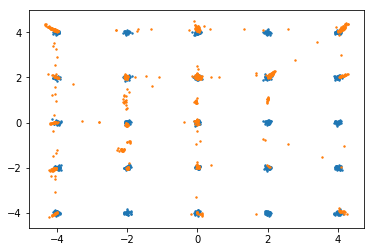

step 39700: discriminator: 1.364e+02, generator: -7.037e+01


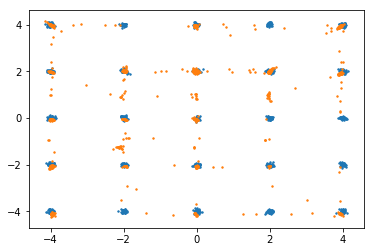

step 39800: discriminator: 1.268e+02, generator: -6.213e+01


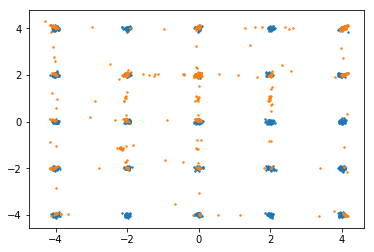

step 39900: discriminator: 1.172e+02, generator: -5.079e+01


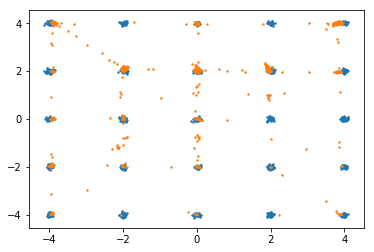

step 40000: discriminator: 1.169e+02, generator: -6.107e+01


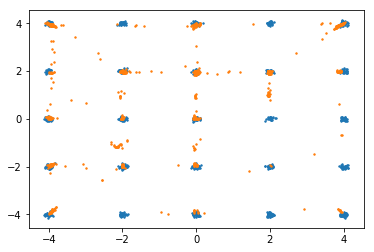

In [49]:
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=100)

**Q6: Why could we anticipate that this loss could cause this?**

> As said earlier, when G is poor (or D is very good), D can reject samples with high confidence because they are clearly different from the training data (thus, $D(x) \approx 0$ which is the probability that D makes a mistake). This is particularly observed at the beginning of the learning. In this case, log$(1 − D(x))$ (where $x\sim p_\theta$) saturates to zero and G produces non-meaningful samples because no information is transmitted to the generator through backpropagation. As suggested just below, it is more computationnaly efficient to train G in such a way to maximize $\mathbb{E}_{p_\theta}[$log$D(x)]$ (or minimize $\mathbb{E}_{p_\theta}[-$log$D(x)]$.

This issue is solved by replacing the generator loss by an alternative loss: $\mathcal{L}_G = \mathbb{E}_{p_\theta} [ -\log D(x) ]$.

**Q7: Inspect the impact of these different factors:**

- depth / width of the generator network
- depth / width of the discriminator network
- impact of `TRAIN_RATIO`

> Let's first investigate the impact of the depth of the generator network. 

step 0: discriminator: 1.740e+02, generator: -9.540e+01


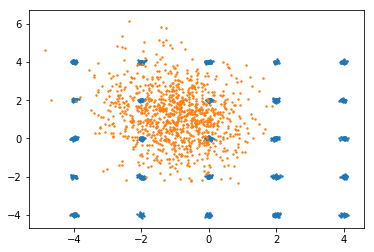

step 10000: discriminator: 2.371e+01, generator: -6.907e+00


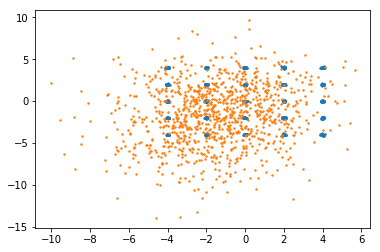

step 20000: discriminator: 1.607e+01, generator: -6.581e+00


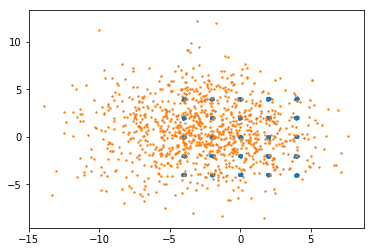

step 30000: discriminator: 6.513e+00, generator: -1.612e+01


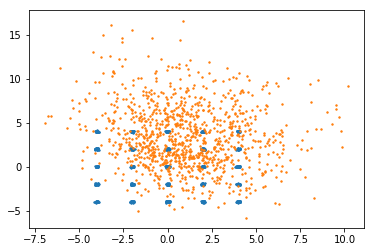

step 40000: discriminator: 1.466e+01, generator: -1.691e+01


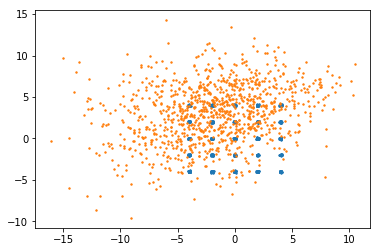

In [53]:
# Depth of generator : 0
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=0, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.771e+02, generator: -9.588e+01


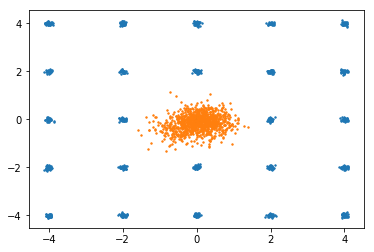

step 10000: discriminator: 1.239e+02, generator: -7.170e+01


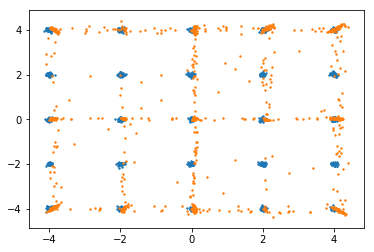

step 20000: discriminator: 1.393e+02, generator: -8.930e+01


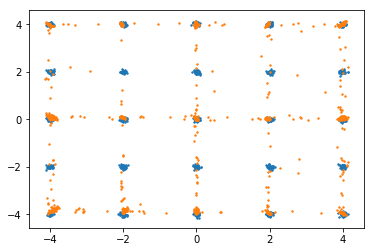

step 30000: discriminator: 1.732e+02, generator: -7.522e+01


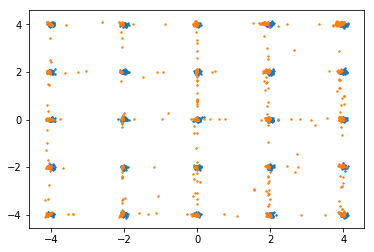

step 40000: discriminator: 1.607e+02, generator: -8.135e+01


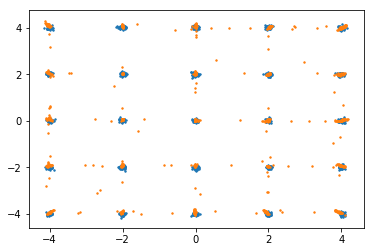

In [54]:
# Depth of generator : 1
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=1, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.756e+02, generator: -8.695e+01


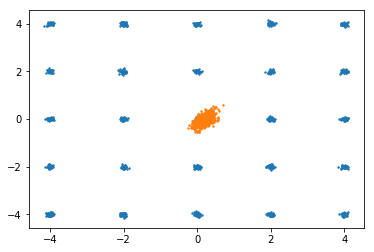

step 10000: discriminator: 1.010e+02, generator: -5.442e+01


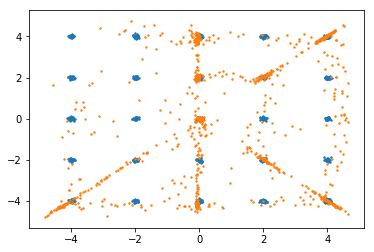

step 20000: discriminator: 1.212e+02, generator: -7.357e+01


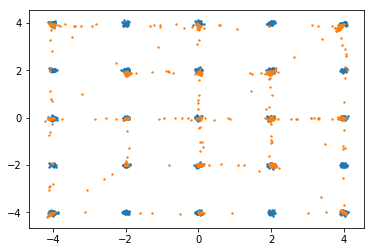

step 30000: discriminator: 1.480e+02, generator: -8.182e+01


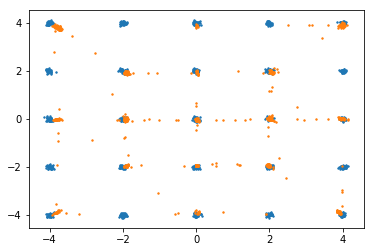

step 40000: discriminator: 1.339e+02, generator: -6.646e+01


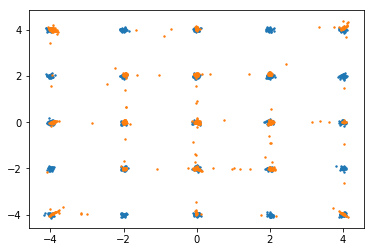

In [55]:
# Depth of generator : 2
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.740e+02, generator: -9.814e+01


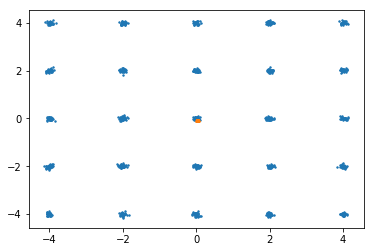

step 10000: discriminator: 3.348e-07, generator: -0.000e+00


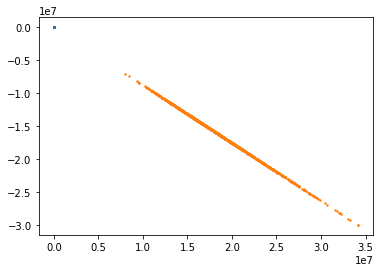

step 20000: discriminator: 2.775e-07, generator: -0.000e+00


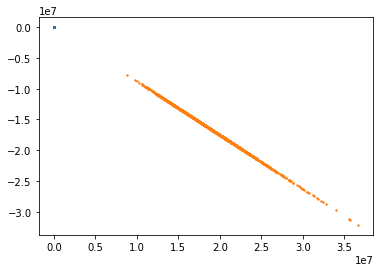

step 30000: discriminator: 2.778e-07, generator: -0.000e+00


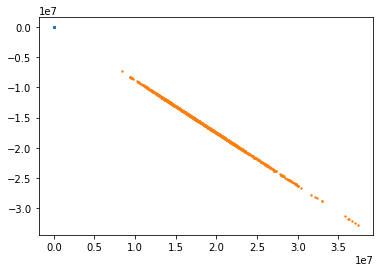

step 40000: discriminator: 1.900e-07, generator: -0.000e+00


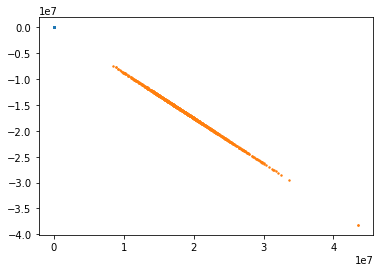

In [56]:
# Depth of generator : 5
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=5, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.758e+02, generator: -9.139e+01


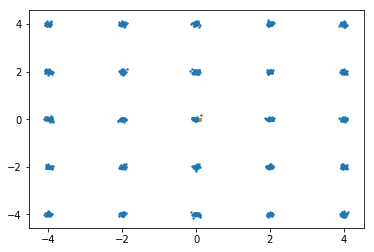

step 10000: discriminator: 1.504e-07, generator: -0.000e+00


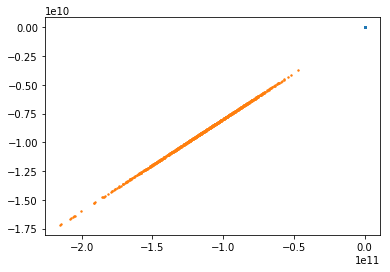

step 20000: discriminator: 2.512e-07, generator: -0.000e+00


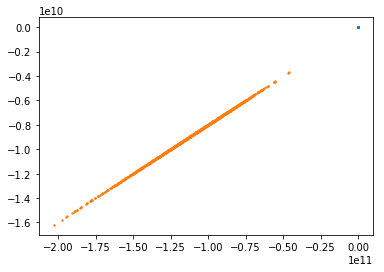

step 30000: discriminator: 1.162e-07, generator: -0.000e+00


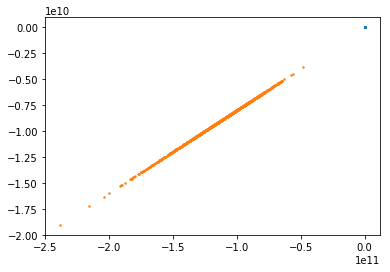

step 40000: discriminator: 9.874e-08, generator: -0.000e+00


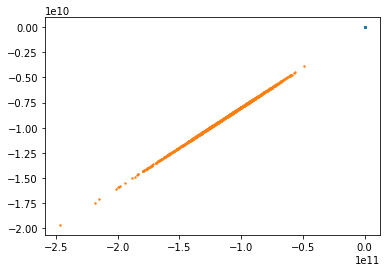

In [58]:
# Depth of generator : 10
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=10, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

> | Generator Depth 	| Discriminator Loss    	| Generator Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $0$         	|   **$14.66$**       	|  $-16.91$	|$10:03$|
| $1$         	|  $100.7$     	| **$-81.35$**	|$11:35$|
| $2$        	    | $133.9$ 	| $-66.46$	|$12:41$|
| $5$         	| $\approx 0$ 	| $0$	|$16:40$|
| $10$         	| $\approx 0$	| $0$ |$22:57$|

> Now let's take a look at the influence of the width of the generator.

step 0: discriminator: 1.703e+02, generator: -9.446e+01


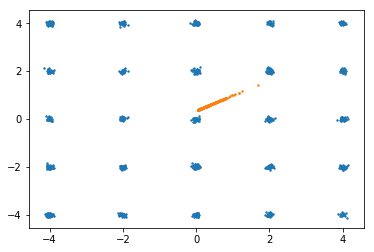

step 10000: discriminator: 3.709e+01, generator: -1.189e+01


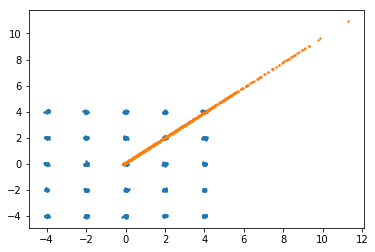

step 20000: discriminator: 4.414e+01, generator: -5.198e+00


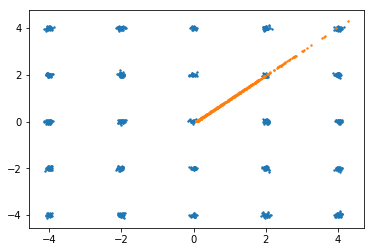

step 30000: discriminator: 1.435e+01, generator: -3.029e-03


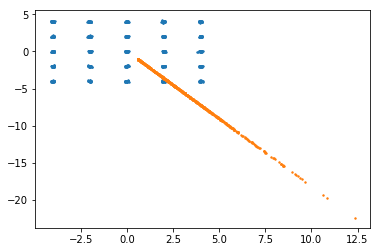

step 40000: discriminator: 3.450e+01, generator: -3.301e+01


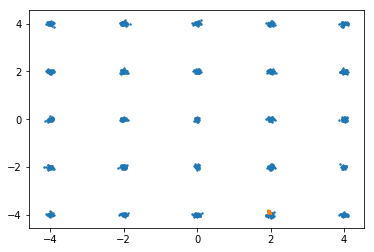

In [59]:
# Width of generator : 2
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=2, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.834e+02, generator: -8.280e+01


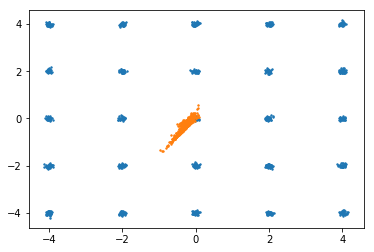

step 10000: discriminator: 4.291e+01, generator: -2.607e+01


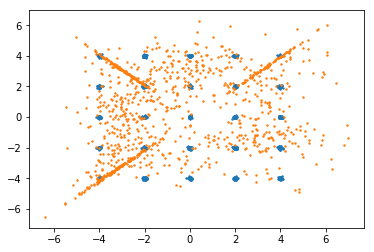

step 20000: discriminator: 2.023e+01, generator: -1.455e+01


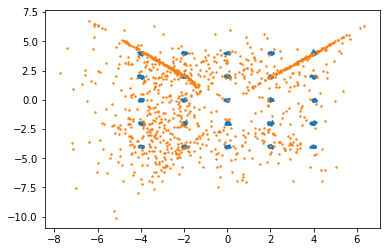

step 30000: discriminator: 2.704e+01, generator: -2.813e+01


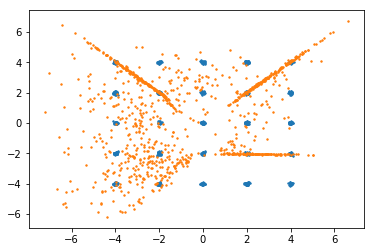

step 40000: discriminator: 3.469e+01, generator: -2.896e+01


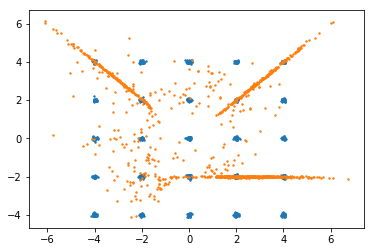

In [60]:
# Width of generator : 10
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=10, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.801e+02, generator: -8.681e+01


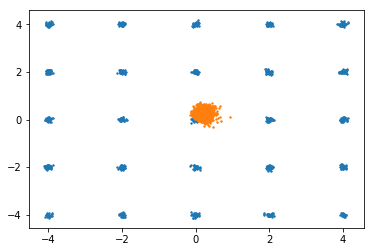

step 10000: discriminator: 9.416e+01, generator: -3.881e+01


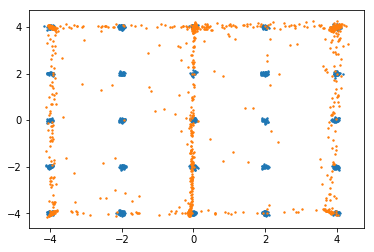

step 20000: discriminator: 6.387e+01, generator: -3.500e+01


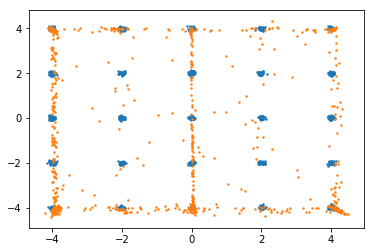

step 30000: discriminator: 9.776e+01, generator: -3.188e+01


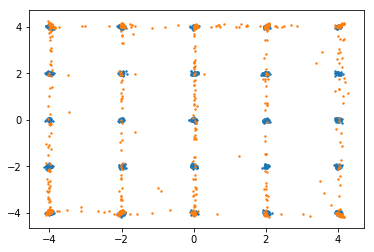

step 40000: discriminator: 1.353e+02, generator: -4.805e+01


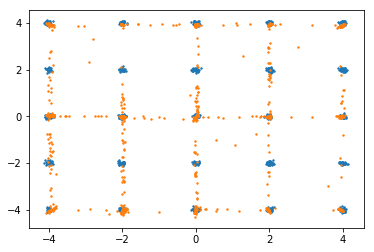

In [61]:
# Width of generator : 50
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=50, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.746e+02, generator: -9.848e+01


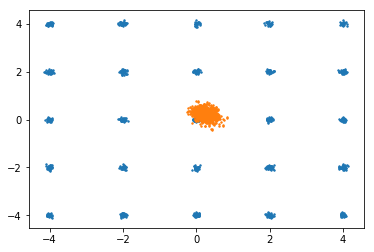

step 10000: discriminator: 1.047e+02, generator: -4.869e+01


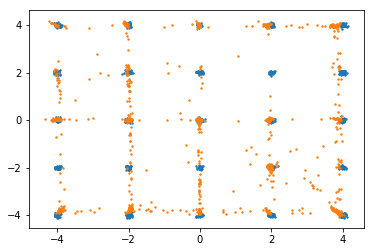

step 20000: discriminator: 1.659e+02, generator: -7.892e+01


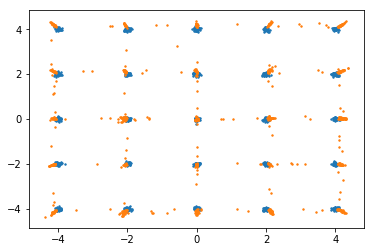

step 30000: discriminator: 1.573e+02, generator: -7.970e+01


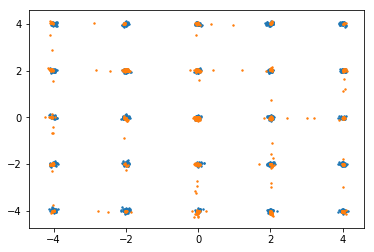

step 40000: discriminator: 1.726e+02, generator: -8.757e+01


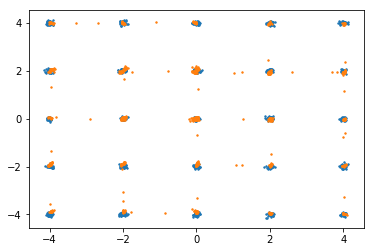

In [62]:
# Width of generator : 100
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.850e+02, generator: -9.403e+01


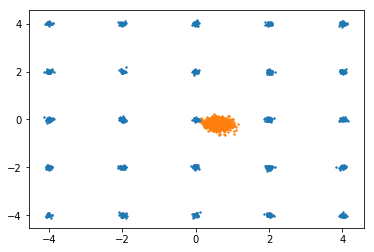

step 10000: discriminator: 1.335e+02, generator: -5.693e+01


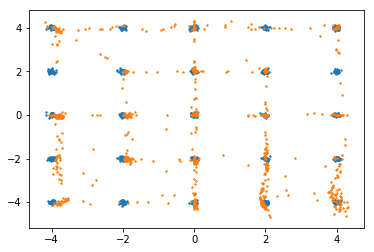

step 20000: discriminator: 1.397e+02, generator: -5.934e+01


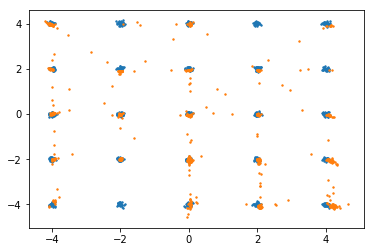

step 30000: discriminator: 1.501e+02, generator: -7.630e+01


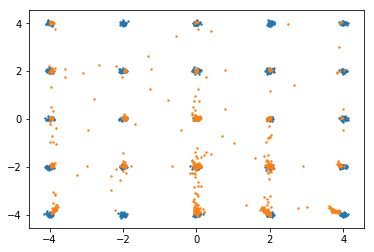

step 40000: discriminator: 1.460e+02, generator: -6.468e+01


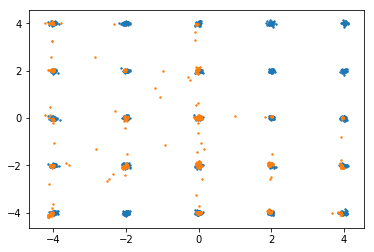

In [63]:
# Width of generator : 200
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=200, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

> | Generator Width 	| Discriminator Loss    	| Generator Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $2$         	|   $34.50$       	|  $-33.01$	|$9:27$|
| $10$         	|  $34.69$     	| $-28.96$	|$9:23$|
| $50$        	    | $135.3$ 	| $-48.05$	|$9:58$|
| $100$         	| $172.6$ 	| $-87.57$	|$11:26$|
| $200$         	| $146.0$	| $-64.68$ |$15:11$|

> Same thing for the discriminator.

step 0: discriminator: 1.978e+02, generator: -7.974e+01


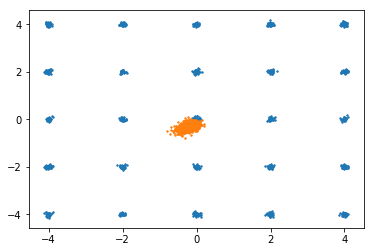

step 10000: discriminator: 5.134e-07, generator: -0.000e+00


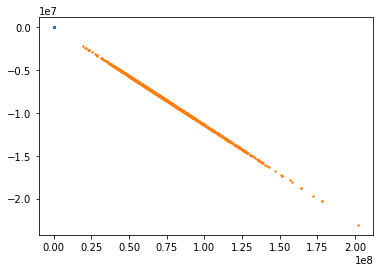

step 20000: discriminator: 6.014e-07, generator: -0.000e+00


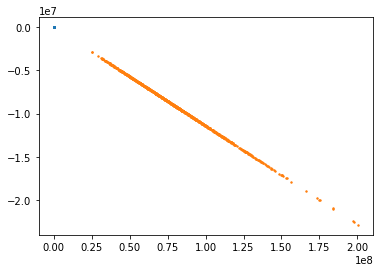

step 30000: discriminator: 3.837e-07, generator: -0.000e+00


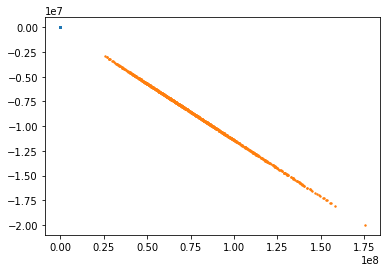

step 40000: discriminator: 3.230e-07, generator: -0.000e+00


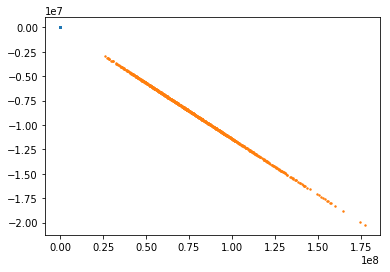

In [64]:
# Depth of discriminator : 0
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=0,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.881e+02, generator: -8.462e+01


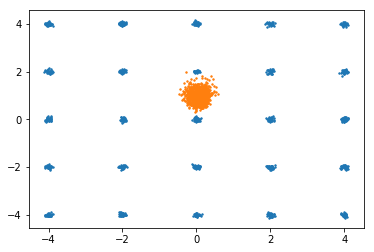

step 10000: discriminator: 3.594e-07, generator: -0.000e+00


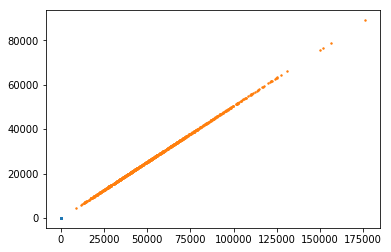

step 20000: discriminator: 4.175e-07, generator: -0.000e+00


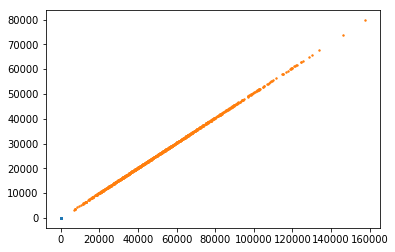

step 30000: discriminator: 4.000e-07, generator: -0.000e+00


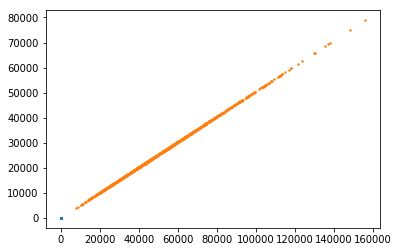

step 40000: discriminator: 2.017e-07, generator: -0.000e+00


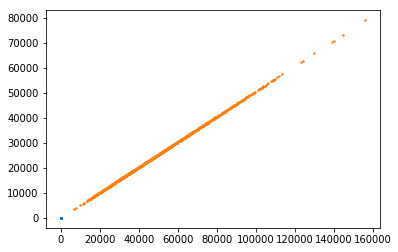

In [155]:
# Depth of discriminator : 1
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=1,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.787e+02, generator: -8.935e+01


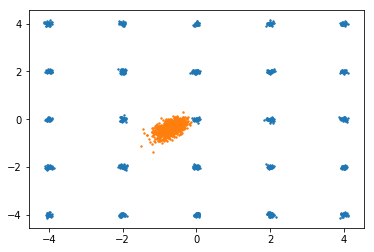

step 10000: discriminator: 9.297e+01, generator: -5.100e+01


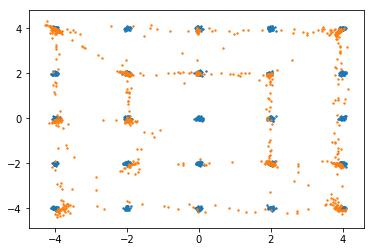

step 20000: discriminator: 1.229e+02, generator: -6.625e+01


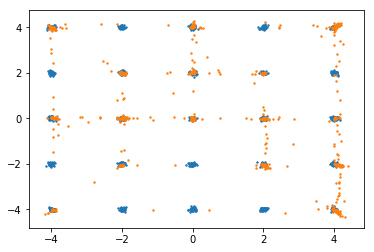

step 30000: discriminator: 1.410e+02, generator: -6.218e+01


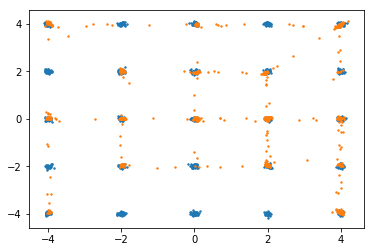

step 40000: discriminator: 1.435e+02, generator: -6.570e+01


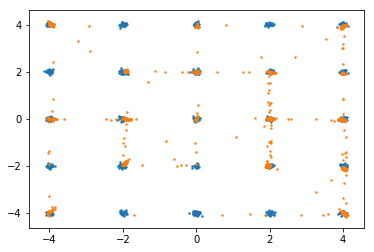

In [65]:
# Depth of discriminator : 2
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.777e+02, generator: -9.173e+01


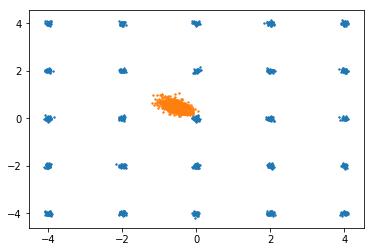

step 10000: discriminator: 4.390e+01, generator: -2.956e+01


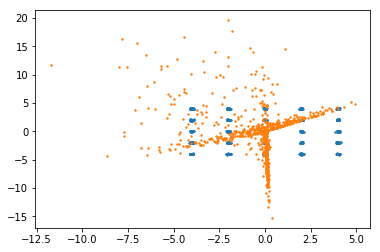

step 20000: discriminator: 4.522e+01, generator: -3.102e+01


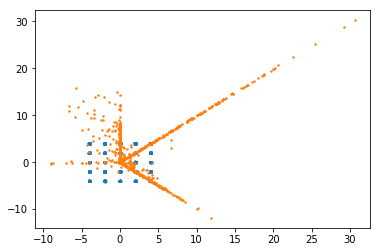

step 30000: discriminator: 3.374e+01, generator: -6.861e+00


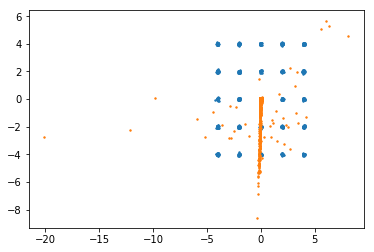

step 40000: discriminator: 3.642e+01, generator: -1.107e+01


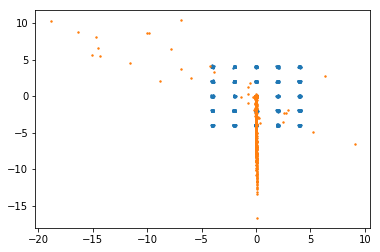

In [66]:
# Depth of discriminator : 5
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=5,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.775e+02, generator: -9.010e+01


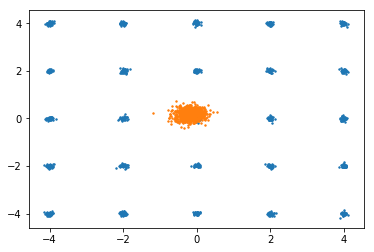

step 10000: discriminator: 2.684e+01, generator: -9.588e+00


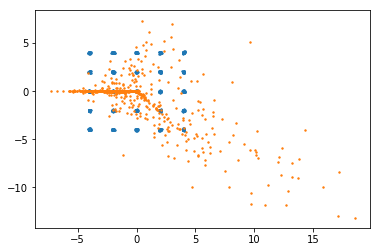

step 20000: discriminator: 3.014e+01, generator: -1.861e+01


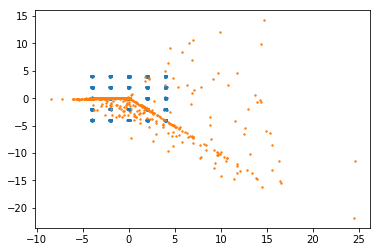

step 30000: discriminator: 2.120e+01, generator: -1.411e+01


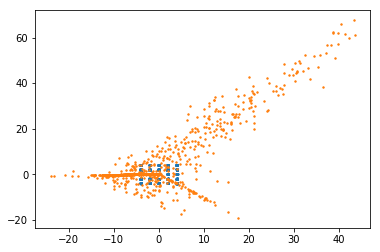

step 40000: discriminator: 3.784e+01, generator: -7.666e+00


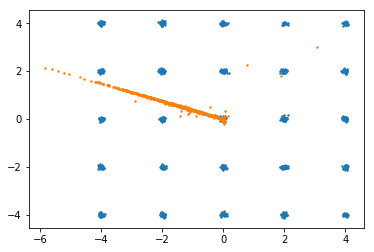

In [67]:
# Depth of discriminator : 10
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128, 
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=10,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

> | Discriminator Depth 	| Discriminator Loss    	| Generator Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $0$         	|   $\approx 0$       	|  $0$	|$7:10$|
| $1$         	| $\approx 0$	| $0$ |$10:30$|
| $2$         	|  $143.5$     	| $-65.70$	|$11:17$|
| $5$        	    | $36.42$ 	| $-11.07$	|$16:34$|
| $10$         	| $37.84$ 	| $-7.666$	|$26:10$|

step 0: discriminator: 1.775e+02, generator: -9.199e+01


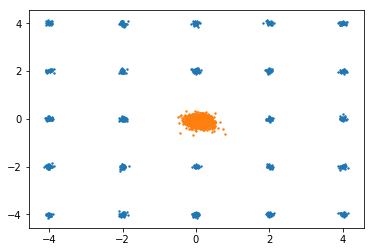

step 10000: discriminator: 1.774e+02, generator: -8.872e+01


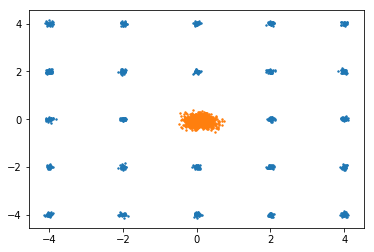

step 20000: discriminator: 1.774e+02, generator: -8.872e+01


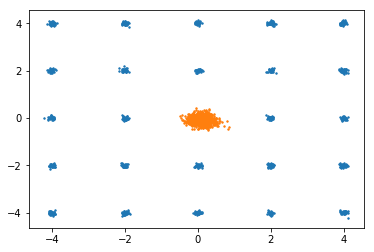

step 30000: discriminator: 1.774e+02, generator: -8.872e+01


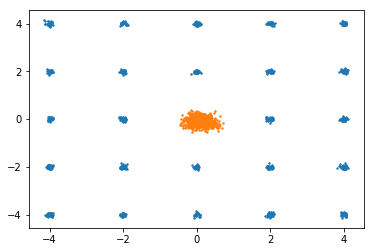

step 40000: discriminator: 1.774e+02, generator: -8.872e+01


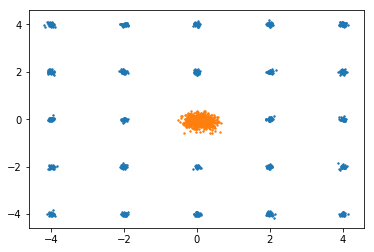

In [68]:
# Width of discriminator : 2
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=2, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.783e+02, generator: -9.228e+01


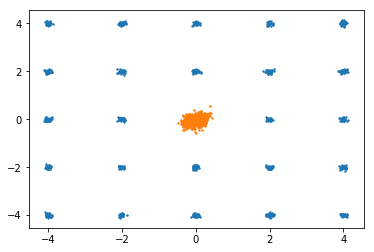

step 10000: discriminator: 2.680e+01, generator: -1.871e+00


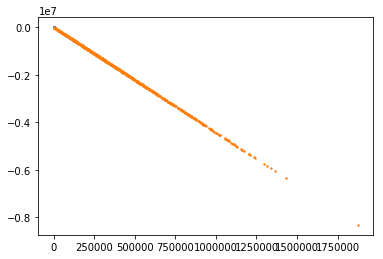

step 20000: discriminator: 1.247e+01, generator: -0.000e+00


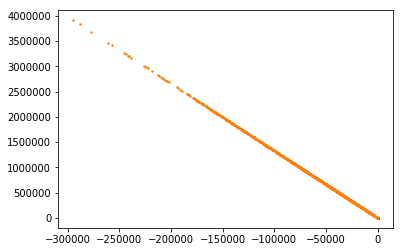

step 30000: discriminator: 1.978e-01, generator: -0.000e+00


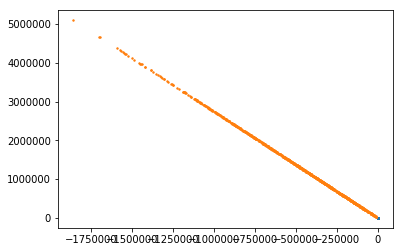

step 40000: discriminator: 9.655e-01, generator: -0.000e+00


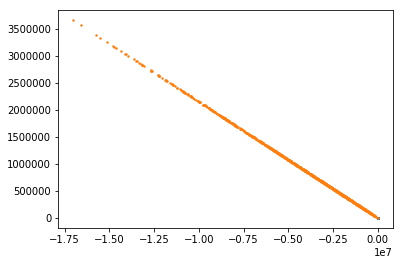

In [69]:
# Width of discriminator : 10
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=10, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.787e+02, generator: -8.908e+01


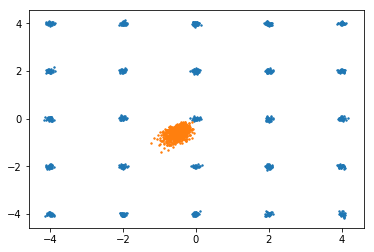

step 10000: discriminator: 8.492e+00, generator: -2.267e-01


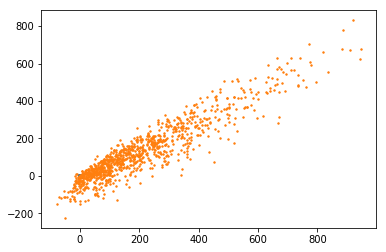

step 20000: discriminator: 2.533e+01, generator: -9.626e+00


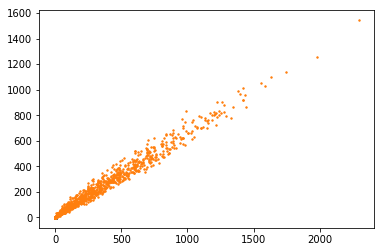

step 30000: discriminator: 5.264e+01, generator: -3.373e+01


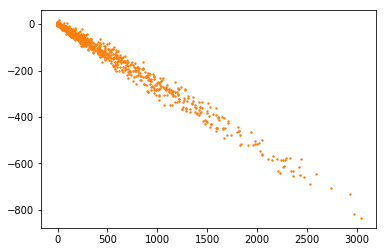

step 40000: discriminator: 2.726e+01, generator: -1.996e+01


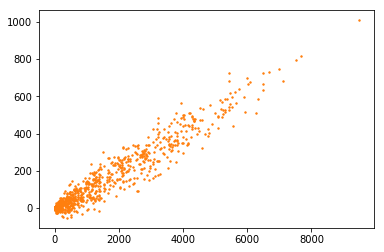

In [70]:
# Width of discriminator : 50
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=50, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.769e+02, generator: -9.145e+01


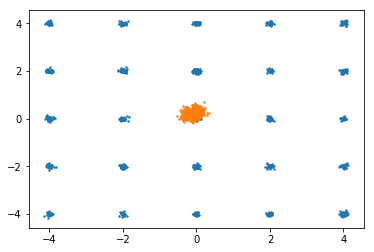

step 10000: discriminator: 1.183e+02, generator: -6.031e+01


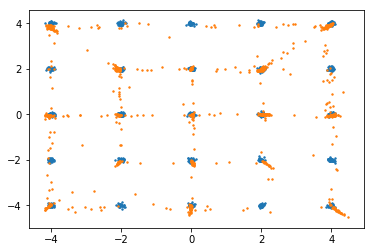

step 20000: discriminator: 1.327e+02, generator: -4.630e+01


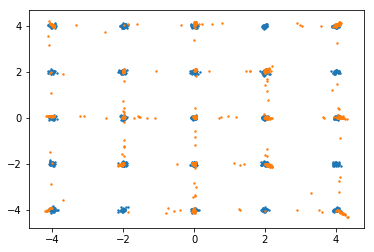

step 30000: discriminator: 1.250e+02, generator: -4.781e+01


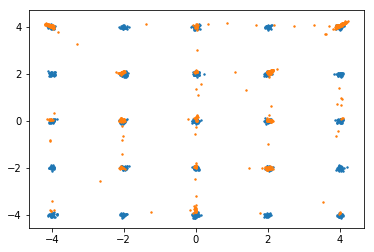

step 40000: discriminator: 1.262e+02, generator: -4.894e+01


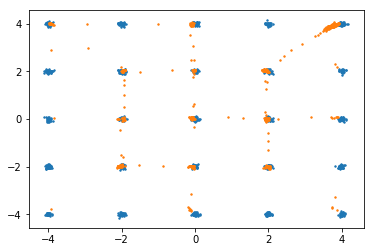

In [71]:
# Width of discriminator : 100
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.859e+02, generator: -8.532e+01


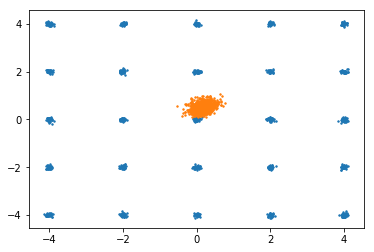

step 10000: discriminator: 5.397e+01, generator: -2.238e+01


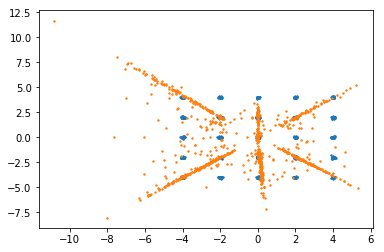

step 20000: discriminator: 5.882e+01, generator: -3.020e+01


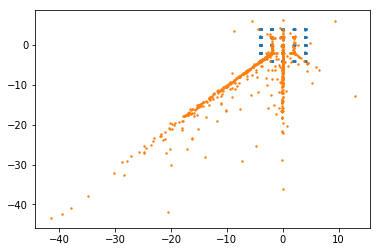

step 30000: discriminator: 6.016e+01, generator: -2.164e+01


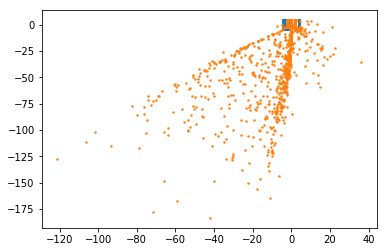

step 40000: discriminator: 5.741e+01, generator: -4.014e+01


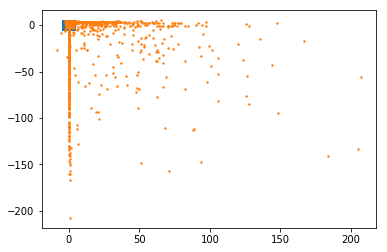

In [72]:
# Width of discriminator : 200
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=200, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

> | Discriminator Width 	| Discriminator Loss    	| Generator Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $2$         	|   $177.4$       	|  $-88.72$	|$6:54$|
| $10$         	|  $0.9655$     	| $0$	|$7:20$|
| $50$        	    | $27.26$ 	| $-19.96$	|$8:21$|
| $100$         	| $126.2$ 	| $-48.94$	|$10:24$|
| $200$         	| $57.41$	| $-40.14$ |$16:25$|

> Finally, let's focus on ``TRAIN_RATIO``.

step 0: discriminator: 1.764e+02, generator: -9.588e+01


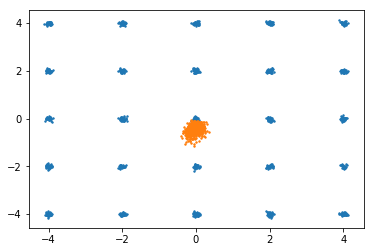

step 10000: discriminator: 1.146e+02, generator: -5.612e+01


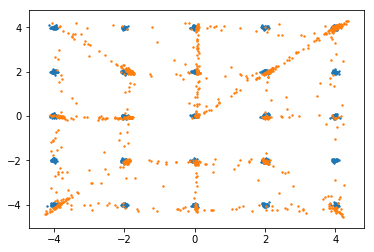

step 20000: discriminator: 1.201e+02, generator: -7.982e+01


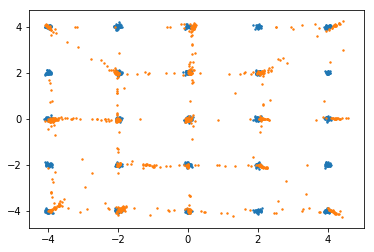

step 30000: discriminator: 1.203e+02, generator: -6.379e+01


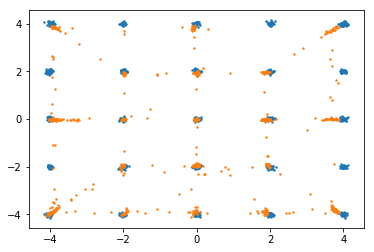

step 40000: discriminator: 1.374e+02, generator: -5.396e+01


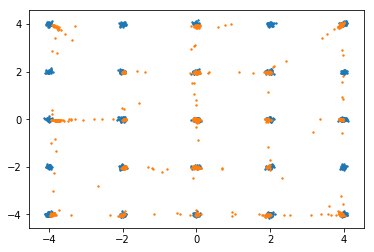

In [156]:
# Train ratio : 2
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.737e+02, generator: -9.152e+01


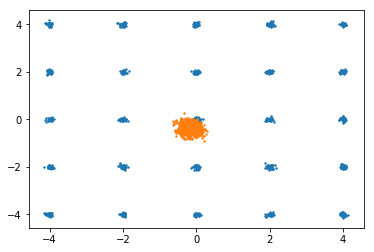

step 10000: discriminator: 1.349e-07, generator: -2.098e-33


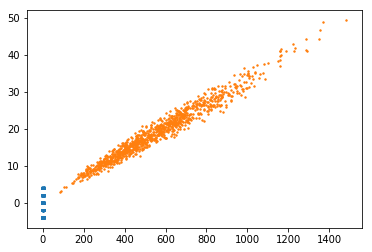

step 20000: discriminator: 1.088e-07, generator: -0.000e+00


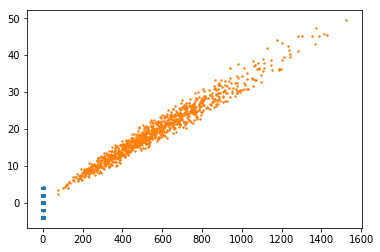

step 30000: discriminator: 1.535e-07, generator: -0.000e+00


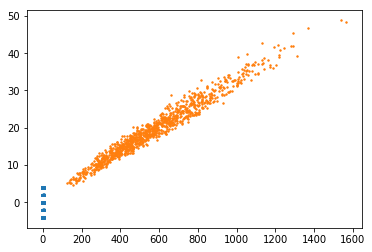

step 40000: discriminator: 1.406e-07, generator: -0.000e+00


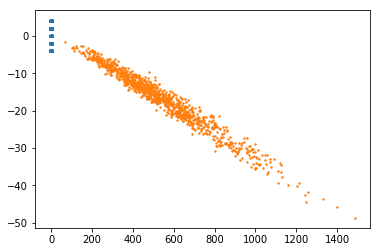

In [157]:
# Train ratio : 5
GAN(TRAIN_RATIO=5, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.727e+02, generator: -8.566e+01


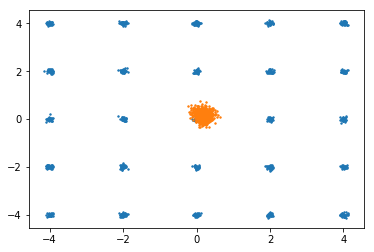

step 10000: discriminator: 3.052e+01, generator: -2.875e+00


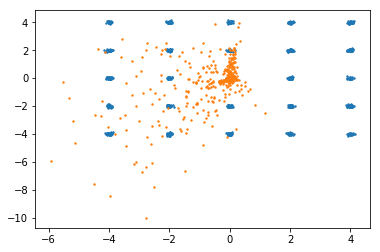

step 20000: discriminator: 2.640e+01, generator: -9.103e+00


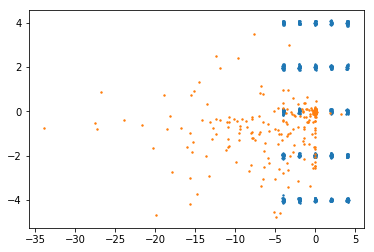

step 30000: discriminator: 2.704e-01, generator: -1.313e-01


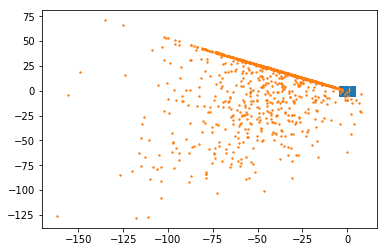

step 40000: discriminator: 4.634e-01, generator: -2.693e+00


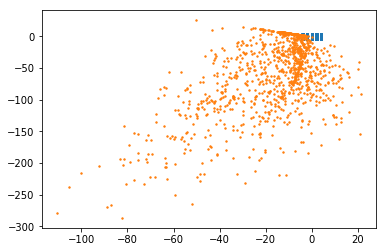

In [158]:
# Train ratio : 10
GAN(TRAIN_RATIO=10, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

> | Train ratio 	| Discriminator Loss    	| Generator Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $2$         	|   $137.4$       	|  $-53.96$	|$12:00$|
| $5$         	|  $\approx 0$     	| $0$	|$25:42$|
| $10$        	    | $0.4634$	| $-2.693$	| $45:54$|

> And ``PRIOR_N``.

step 0: discriminator: 1.788e+02, generator: -9.171e+01


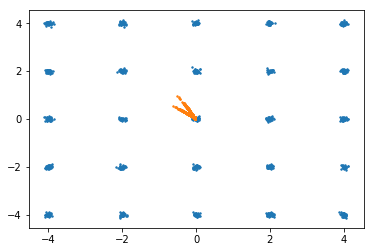

step 10000: discriminator: 8.277e+01, generator: -3.532e+01


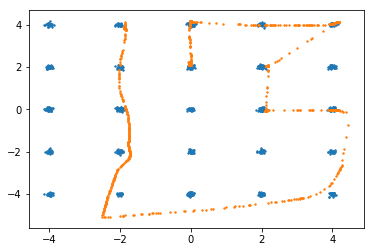

step 20000: discriminator: 8.816e+01, generator: -5.260e+01


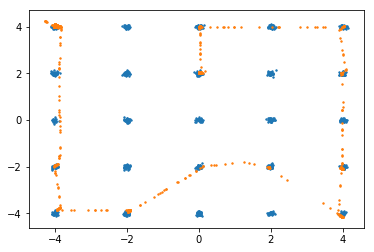

step 30000: discriminator: 9.531e+01, generator: -3.248e+01


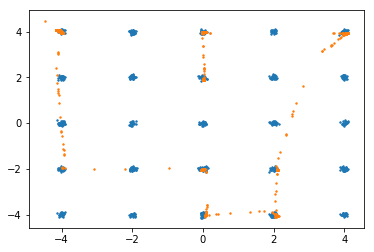

step 40000: discriminator: 8.988e+01, generator: -3.689e+01


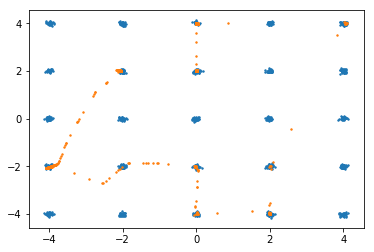

In [159]:
# Prior_n : 1
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=1, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.753e+02, generator: -8.834e+01


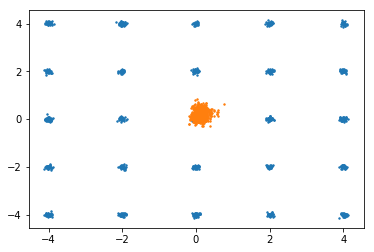

step 10000: discriminator: 1.558e+02, generator: -6.460e+01


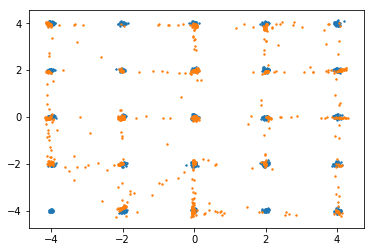

step 20000: discriminator: 1.472e+02, generator: -6.521e+01


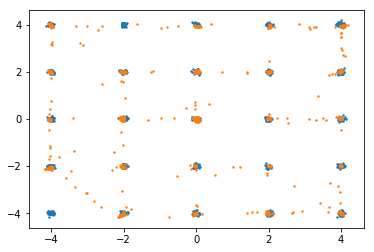

step 30000: discriminator: 1.615e+02, generator: -8.728e+01


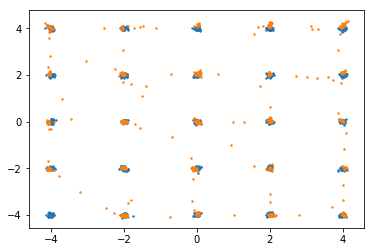

step 40000: discriminator: 1.681e+02, generator: -8.770e+01


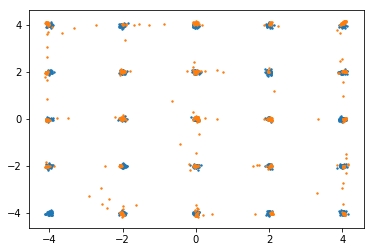

In [160]:
# Prior_n : 5
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=5, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.771e+02, generator: -8.811e+01


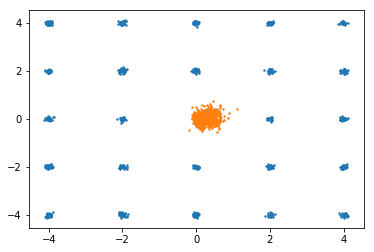

step 10000: discriminator: 1.405e+02, generator: -7.502e+01


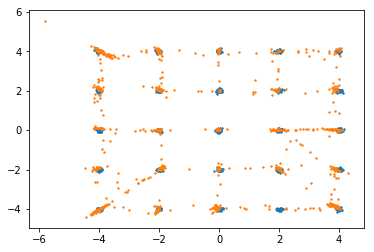

step 20000: discriminator: 1.609e+02, generator: -8.112e+01


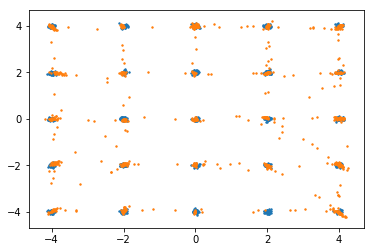

step 30000: discriminator: 1.537e+02, generator: -8.254e+01


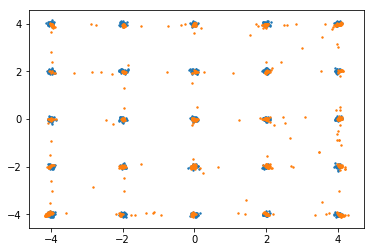

step 40000: discriminator: 1.708e+02, generator: -7.864e+01


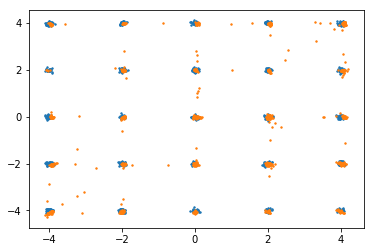

In [161]:
# Prior_n : 10
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=10, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.766e+02, generator: -9.124e+01


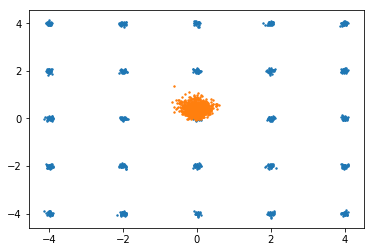

step 10000: discriminator: 1.333e+02, generator: -6.527e+01


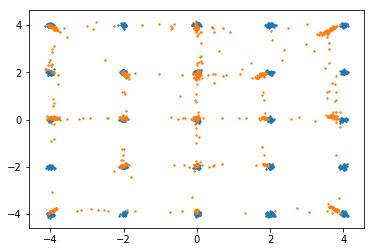

step 20000: discriminator: 1.494e+02, generator: -7.021e+01


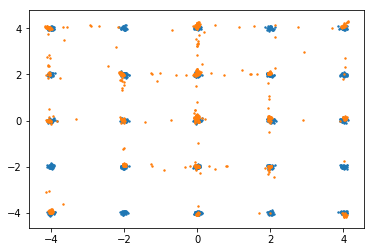

step 30000: discriminator: 1.543e+02, generator: -8.173e+01


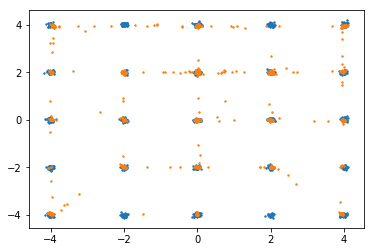

step 40000: discriminator: 1.476e+02, generator: -7.055e+01


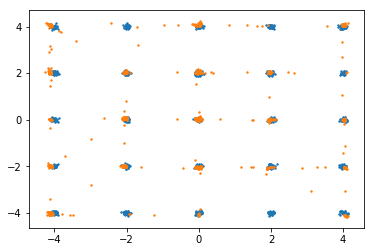

In [162]:
# Prior_n : 20
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=20, PRIOR_STD=6, frame=10000)

step 0: discriminator: 1.740e+02, generator: -8.894e+01


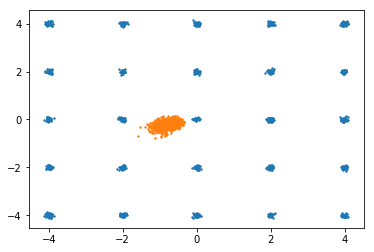

step 10000: discriminator: 2.950e+01, generator: -2.561e+01


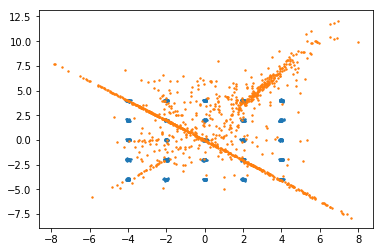

step 20000: discriminator: 3.248e+01, generator: -1.542e+01


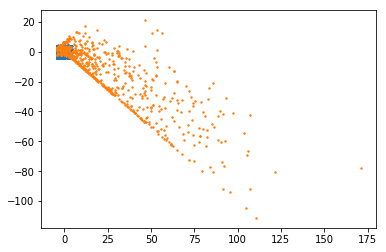

step 30000: discriminator: 5.827e+01, generator: -1.755e+01


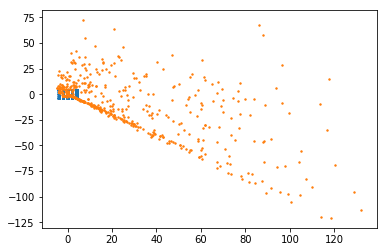

step 40000: discriminator: 5.883e+01, generator: -2.379e+01


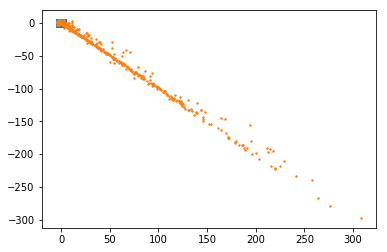

In [163]:
# Prior_n : 50
GAN(TRAIN_RATIO=2, N_ITER=40001, BATCHLEN=128,
    WDTH_G=100, DPTH_G=2, WDTH_D=100, DPTH_D=2,
    PRIOR_N=50, PRIOR_STD=6, frame=10000)

> | Prior_n 	| Discriminator Loss    	| Generator Loss    	| 
|-------------	|--------	|--------|
| $1$         	|   $89.88$      	|  $-36.89$	|
| $5$         	|  $168.1$     	| $-87.70$	|
| $10$        	    | $170.8$	| $-78.64$	|
| $20$        	    | $147.6$	| $-70.55$	|
| $50$        	    | $58.83$	| $-23.79$	|

> Impact of the following parameters:
>
> - **generator depth**: if the generator network does not contain any hidden layer, then the fake points are far from being similar to the real input (this is why the discriminator loss is small).  They form a kind of unstructured cloud. On the contrary, when the generator is too complex, i.e with a depth of 5 or 10, then the fake points’ distribution completely blows up : the latter are very far away from the input points, leading the discriminator loss to be zero. The intermediate values of the generator depth allow to find very satisfying results (depth of 1 or 2). 
>
> - **generator width**:  up to 40 neurons in each hidden layer, the fake points form groups of lines (horizontal or vertical) which are far from being similar to the input points but nevertheless fit in the ground truth grid. With 50 neurons, lines are still here but in a lower extent. From 70 neurons, the results are very satisfying. Moreover, it is not necessary to force the generator to have a very high width as the results are the same for both width = 100 and 200, with losses that are slightly inferior for width 200.
>
> - **discriminator depth**: the same compromise as for the generator depth has to been found with the discriminator depth. Indeed, for small depths (0 or 1), fake points are very far away from the input points. For large depths (5+), the generator produces points that do not completely blow up but form either random clouds or lines, both near the original grid.
>
 > - **discriminator width**: small number of neurons are not relevant as for too many. This can lead to a very slow convergence (points are very concentrated at the origin of the grid), lines or clouds. This is different from the generator width impact on the results : here, we also have to find a good compromise. 
 >
> - **train ratio** : this value is very influential on the performance of the networks. Indeed, setting it to 1 or up to 5 leads to very poor results and fake points that are very far away from the original grid; with the same characteristic shapes as before. Setting it to 2 is a good value but it shows how to train of GAN is very sensitive to some parameters.
>
> - **prior_n** : values between 5 and 20 leads to good results and convergence. The results between those intermediate values are quite similar and are poorly sensitive to prior_n.
>
> As a conclusion for selecting the best parameters, I would suggest to choose : 
> - **generator depth**: 2
> - **generator width**: 100
> - **discriminator depth**: 2
 > - **discriminator width**: 100
> - **train ratio** : 2
> - **prior_n**: 20 (more robust over all experiments)

For further readings on GANs, you can see the following papers:

- Generative Adversarial Networks *(Goodfellow et al.)*: [arXiv:1406.2661](https://arxiv.org/abs/1406.2661)
- Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks *(Radford et al.)*: [arXiv:1511.06434](https://arxiv.org/abs/1511.06434)

### Variational AutoEncoders

An other well-known approach to generative modelling is embodied by Variational AutoEncoders (VAEs). While the generative model itself and the procedure to sample it is similar to GANs, the way it is trained is not.

The main goal of VAEs is to optimize the likelihood of the real data according to the generative model. In other words, maximize $\mathbb{E}_{p_D} \log p_\theta(x)$, which is equivalent to minimizing $D_{KL}(p_D \| p_\theta)$.

**Q8: Prove this equivalence.**

> $\min\limits_{p_\theta} D_{KL}(p_D \| p_\theta) = \min\limits_{p_\theta} \mathbb{E}_{X\sim p_D} \Big[ \text{log} \frac{p_D(X)}{p_\theta(X)}  \Big] = \min\limits_{p_\theta} -H(p_D) - \mathbb{E}_{p_D}\text{log}p_{\theta}(X)$ 
> 
> As the 2 quantities to minimize are positive, one can rewrite our minimization problem as the following maximization problem: $$ \max\limits_{p_\theta} H(p_D) + \mathbb{E}_{p_D}\text{log}p_{\theta}(X)$$ Moreover, $H(p_D)$ does not depend on $p_\theta$ so we have an equivalence between the 2: 
> 
 > $$\min\limits_{p_\theta} D_{KL}(p_D \| p_\theta) = \max\limits_{p_\theta} \mathbb{E}_{p_D}\text{log}p_{\theta}(X)$$

However, the class of distributions for which $\log p_\theta(x)$ can be analytically computed and optimized is very restricted, and not suitable for real world problems. The main idea of the VAE is thus to introduce a latent variable $z$ and decompose the distribution like so: $p_\theta(x, z) = p_\theta(x | z) p(z)$. Where here $p(z)$ is some fixed prior and $p_\theta(x | z)$ is a simple distribution whose parameters are the output of a neural network.

For example, you could have $p(z)$ be a standard $\mathcal{N}(0;1)$ and $p_\theta(x | z)$ be defined as a gaussian $\mathcal{N}(\mu_\theta(z); \sigma_\theta(z))$ where $\mu_\theta(z)$ and $\sigma_\theta(z)$ are created by the neural network you will train. In this case, the resulting distribution $p_\theta(x) = \int_z p_\theta(x|z)p(z)ds$ is an infinite mixture of gaussians, which is a much more expressive class of distributions.

Now, this cannot stop here, as we are not able to analitically compute the density $p_\theta(x)$. The second main idea of the VAE is to introduce an other, auxilliary distribution: $q_\phi(z | x)$, which will be modelled by a neural network similarly to $p_\theta(x | z)$. Introducing it allows us to create a lower bound for $\log p_\theta(x)$:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log p_\theta(x) \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Following Bayes theorem, $p_\theta(x) p_\theta(z|x) = p_\theta(x, z) = p_\theta(x|z) p(z)$, so we get:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log \frac{p_\theta(x|z) p(z)}{p_\theta(z|x)} \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Re-organizing the terms:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log \frac{q_\phi(z|x)}{p_\theta(z|x)} - \mathbb{E}_{z \sim q_\phi} \log \frac{p(z)}{q_\phi(z|x)} + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x | z)$$

This can be re-expressed like so:

$$\log p_\theta(x) = D_{KL}(q_\phi(z | x) \| p_\theta(z | x)) - D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x|z)$$

The 3 terms of this equality can be interpreted like so:

- the first term measures how much $q_\phi(z | x)$ is similar to $p_\theta(z | x)$, or in other words is a good inverse of $p_\theta(x | z)$
- the second term measures how similar $q_\phi(z|x)$ is from the latent prior $p(z)$
- the third term is linked to how likely $p_\theta$ is to yield the given $x$ when $z$ is sampled from $q_\phi(z | x)$ rather than $p(z)$

It is interesting to note that the first term, being a KL-divergence is always positive. As such the combination of the last two terms form a lower bound of $\log p_\theta(x)$ which *can* be computed and used as a training objective. This bound is called the *Evidence Lower-Bound (ELBO)*. Simply flipping its sign can make it into a loss that can be minimized by gradient descent:

$$ \mathcal{L}_{ELBO} = D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} [ - \log p_\theta(x|z) ]$$

From this formulation comes the parallel with auto-encoders that give the VAE its name: $q_\phi(z | x)$ can be seen as a *probabilistic encoder* from the data $x$ to the latent space $z$, and $p_\theta(x | z)$ can be seen as a *probabilistic decoder* from the latent space $z$ to the data $x$. In this case the second term of $\mathcal{L}_{ELBO}$ is the loss measuring the reconstruction quality of the auto-encoder, and the first term can be seens as a regularization of the latent space.

**Q9: We can see that $p(z)$ is never sampled during the training process, how can that be a problem?**

> Recall that $$ \mathcal{L}_{ELBO} =  \mathbb{E}_{z \sim q_\phi} \log \frac{q_\phi(z|x)}{p(z)} - \mathbb{E}_{z \sim q_\phi} \log p_\theta(x | z)$$ This can be rewritten as: $$ \mathcal{L}_{ELBO} =  - \mathbb{E}_{z \sim q_\phi} \log \frac{ p(z)}{q_\phi(z|x)} + \mathbb{E}_{z \sim q_\phi} \log \frac{p(z)}{p_\theta(x, z)}$$
>
> Sampling $z$ can be a problem if, for a given  $z_0$ , $p(z_0) <<1$ (say $p(z_0) \approx 10^{-5}$). Therefore, if  $z_0$ is sampled from its distribution, then $\mathcal{L}_{ELBO}$ can blow up early in the learning.

A typical choice to represent $q_\phi(z | x)$ is to use a diagonal Gaussian distribution $\mathcal{N}(\mu_\phi(x); Diag(\sigma_\phi(x)))$, which makes the KL-divergence term of $\mathcal{L}_{ELBO}$ analytically computable.

**Q10: Assuming $p(z)$ is a $\mathcal{N}(0; Id)$ gaussian, what is the value of $D_{KL}(q_\phi(z | x) \| p(z))$?**

> To reduce the notation, from now on I will denote $\mu \equiv \mu_\phi(x) $ and $\Sigma  \equiv \Sigma_\phi(x)$.
>
> \begin{eqnarray*}
D_{KL}(q_\phi(z | x) \| p(z)) & = & \mathbb{E}_{z \sim q_\phi(\cdot|x)}\Big[\text{log} \frac{q_\phi(z|x)}{p(x)} \Big] \\
& = &  \mathbb{E}_{z \sim q_\phi(\cdot|x)}\Bigg[\text{log} \frac{(2\pi)^{-d/2}|\Sigma|^{-1/2}\text{exp}\Big\{-\frac{1}{2}(z-\mu)^{\top} \Sigma^{-1} (z-\mu)\Big\} }{(2\pi)^{-d/2} \text{exp}\Big\{-\frac{1}{2}z^{\top}z\Big\} } \Bigg] \\
&=& \ \mathbb{E}_{z \sim q_\phi(\cdot|x)}\Bigg[-\frac{1}{2} \text{logdet}\Sigma -\frac{1}{2}\text{Tr}\Big( (z-\mu)^{\top} \Sigma^{-1} (z-\mu) \Big) + \frac{1}{2} \text{Tr}(z^{\top}z)   \Bigg] \\
\end{eqnarray*}
Now we should use the trace trick, the fact that Trace operator is linear and the fact that  $\text{Tr}(z^{\top}z) = \text{Tr}((z-\mu)^{\top}(z-\mu)) + \text{Tr}(2z^\top \mu + \mu^\top \mu) = \text{Tr}((z-\mu)(z-\mu)^{\top}) + 2z^\top \mu - \mu^\top \mu $ where $\text{Tr}((z-\mu)(z-\mu)^{\top})=\text{Tr}\Sigma$. Finally, taking the expectation of $\text{Tr}(z^{\top}z)$ yields: 
\begin{eqnarray*}
     \mathbb{E}_{z \sim q_\phi(\cdot|x)}\Big[ \text{Tr}(z^{\top}z) \Big] &=& \text{Tr}\Sigma + \mu^\top \mu
\end{eqnarray*}
Therefore, we have that:
\begin{eqnarray*}
D_{KL}(q_\phi(z | x) \| p(z)) & = & \mathbb{E}_{z \sim q_\phi(\cdot|x)}\Bigg[- \frac{1}{2}\text{logdet}\Sigma -\frac{1}{2}\text{Tr}\Big( (z-\mu)(z-\mu)^{\top} \Sigma^{-1}\Big)  +\frac{1}{2} \text{Tr}(z^{\top}z)   \Bigg] \\
        &=& - \frac{1}{2} \text{logdet}\Sigma -\frac{1}{2}\text{Tr}\Big(  \mathbb{E}_{z \sim q_\phi(\cdot|x)} \Big[(z-\mu)(z-\mu)^{\top}\Big] \Sigma^{-1}\Big) + \frac{1}{2} \text{Tr}\Sigma + \frac{1}{2} \mu^\top \mu \\
        &=& -\frac{1}{2} \text{logdet}\Sigma -\frac{1}{2}\text{Tr}\Big( \Sigma \Sigma^{-1}\Big) +\frac{1}{2} \text{Tr}\Sigma + \frac{1}{2} \mu^\top \mu \\
        &=& -\frac{1}{2} \text{logdet}\Sigma -\frac{d}{2}+\frac{1}{2} \text{Tr}\Sigma + \frac{1}{2} \mu^\top \mu \\
        &=& \frac{1}{2}\Big( \text{Tr}\Sigma_\phi(x) + \mu_\phi(x)^\top \mu_\phi(x) -d - \text{logdet}\Sigma_\phi(x)  \Big)\\
        &=& \frac{1}{2}\Big( \displaystyle \sum_{k=1}^d \sigma^{(k)}_\phi(x)^2 + \mu_\phi(x)^\top \mu_\phi(x) -d - \displaystyle \sum_{k=1}^d \log\sigma^{(k)}_\phi(x)^2 \Big)\\
        & = & \frac{1}{2} \displaystyle \sum_{k=1}^d \Big[ -1 + \sigma^{(k)}_\phi(x)^2 - \log\sigma^{(k)}_\phi(x)^2 + \mu^{(k)}_\phi(x)^2 \Big]
\end{eqnarray*}

**Here $d$ is the dimension of the latent space.**

We will also model $p_\theta(x | z)$ as a diagonal Gaussian $\mathcal{N}(\mu_\theta(z); Diag(\sigma_\theta(z)))$.

**Q11: What is the expression of $-\log p_\theta(x | z)$ for given $x$ and $z$?**

> \begin{eqnarray*}
-\log p_\theta(x | z) &=& -\log \Bigg[ (2\pi)^{-d/2}|\Sigma|^{-1/2}\text{exp}\Big\{-\frac{1}{2}(x-\mu)^{\top} \Sigma^{-1} (x-\mu)\Big\} \Bigg] \\
&=& \frac{d}{2}\log(2\pi) + \frac{1}{2} \text{logdet} \Sigma +\frac{1}{2} (x-\mu)^{\top} \Sigma^{-1} (x-\mu) \\
&=& \frac{d}{2}\log(2\pi) + \frac{1}{2} \sum_{k=1}^d \log\sigma^{(k)}_\theta(z)^2   +\frac{1}{2}\sum_{k=1}^d \frac{1}{\sigma^{(k)}_\theta(z)^2} (x^{(k)}-\mu^{(k)}_\theta(z))^2 \\
&=& \sum_{k=1}^d \frac{\log(2\pi)}{2} + \frac{1}{2}\log\sigma^{(k)}_\theta(z)^2  + \frac{1}{2\sigma^{(k)}_\theta(z)^2} (x^{(k)}-\mu^{(k)}_\theta(z))^2\\
\end{eqnarray*}

**Here $d$ is the dimension of the input space, i.e. 2.**

We will build and train a VAE using the same dataset as previously, in order to compare its behavior to GANs. For numerical stability, we will interpret the output of the encoder and decoder networks as $(\mu, \log\sigma^2)$, rather than $(\mu, \sigma)$.

> As before, I directly changed the previous original classes in order to play with the parameters of interest.

In [112]:
# Define the generator
class Encoder(nn.Module):
    def __init__(self, WDTH=0, DPTH=0, LATENT_N=10):
        super().__init__()
        # First layer
        self.fc1 = nn.Linear(2, WDTH)
        # Like for GANs, we create list of layers
        self.mu_hidden_layers, self.logvar_hidden_layers = [], []
        # Hidden layers
        for layer in range(DPTH):
            self.mu_hidden_layers.append(nn.Linear(WDTH, WDTH))
            self.logvar_hidden_layers.append(nn.Linear(WDTH, WDTH))
        self.mu_hidden_layers = nn.ModuleList(self.mu_hidden_layers)
        self.logvar_hidden_layers = nn.ModuleList(self.logvar_hidden_layers)
        # Final layers
        self.fclast_mu = nn.Linear(WDTH, LATENT_N)
        self.fclast_logvar = nn.Linear(WDTH, LATENT_N)
        
    # encode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the gaussian q_\phi(z | x)
    def __call__(self, x):
        h_mu = h_logvar = F.relu(self.fc1(x))
        for l_mu, l_logvar in zip(self.mu_hidden_layers, self.logvar_hidden_layers):
            h_mu = l_mu(h_mu)
            h_logvar = l_logvar(h_logvar)
        mu, log_var = self.fclast_mu(h_mu), self.fclast_logvar(h_logvar)
        return (mu, log_var)
    

# Define the discriminator
class Decoder(nn.Module):
    def __init__(self, WDTH=0, DPTH=0, LATENT_N=10):
        super().__init__()
        self.LATENT_N = LATENT_N # for generate function
        # First layer
        self.fc1 = nn.Linear(LATENT_N, WDTH)
        # Like for GANs, we create list of layers
        self.mu_hidden_layers, self.logvar_hidden_layers = [], []
        # Hidden layers
        for layer in range(DPTH):
            self.mu_hidden_layers.append(nn.Linear(WDTH, WDTH))
            self.logvar_hidden_layers.append(nn.Linear(WDTH, WDTH))
        self.mu_hidden_layers = nn.ModuleList(self.mu_hidden_layers)
        self.logvar_hidden_layers = nn.ModuleList(self.logvar_hidden_layers)
        # Last layers
        self.fclast_mu = nn.Linear(WDTH, 2)
        self.fclast_logvar = nn.Linear(WDTH, 2)
    
    # decode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the gaussian p_\theta(z | x)
    def __call__(self, z):
        h_mu = h_logvar = F.elu(self.fc1(z))
        for l_mu, l_logvar in zip(self.mu_hidden_layers, self.logvar_hidden_layers):
            h_mu = l_mu(h_mu)
            h_logvar = l_logvar(h_logvar)
        mu, log_var = self.fclast_mu(h_mu), self.fclast_logvar(h_logvar)
        return (mu, log_var)

    def generate(self, BATCHLEN):
        z = torch.normal(torch.zeros(BATCHLEN, self.LATENT_N), 1.0)
        (mu, logvar) = self.__call__(z)
        return torch.normal(mu, torch.exp(0.5*logvar))

From this, the parameters of both networks are trained conjointly using the same loss $\mathcal{L}_{ELBO}$. Pytorch allows us to sample the Gaussian distribution in a differentiable way using `torch.normal(mu, sigma)`, but it is not differentiable wrt to its inputs.

**Q12: How can you sample a distribution $\mathcal{N}(\mu, \sigma)$ is a way that is differentiable w.r.t. both $\mu$ and $\sigma$?**

> It is sufficient to sample $z \sim \mathcal{N}(\mu, \sigma)$ by first sampling $\epsilon \sim \mathcal{N}(0,1)$ and then say that $z = \mu + \sqrt{\sigma} \cdot \epsilon$. This formulation is differentiable wrt both $\mu$ and $\sigma$ (except, for the latter, at $0$ but $\sigma > 0$). We call this the "reparametrization trick". 

In [167]:
def VAE(N_ITER=40001, BATCHLEN=128,
        WDTH_E=2, DPTH_E=0, WDTH_D=2, DPTH_D=0,
        LATENT_N=10, sigma=False, frame=100):
    """
    N_ITER : int, total number of training iterations for the generator
    BATCHLEN : int, Batch size to use
    WDTH_E : int, width of the encoder (number of neurons in hidden layers)
    DPTH_E : int, number of hidden FC layers of the encoder
    WDTH_D : int, width of the decoder (number of neurons in hidden layers)
    DPTH_D : int, number of hidden FC layers of the decoder
    LATENT_N : int, dimension of the encoding space
    sigma : Bool or float, False if you don't wan't to force a value (hardcoding)
    otherwise a real positive value
    frame : int, display data each 'frame' iteration
    """
        
    E = Encoder(LATENT_N=LATENT_N, WDTH=WDTH_E, DPTH=DPTH_E)
    solver_E = torch.optim.Adam(E.parameters(), lr=1e-4, betas=(0.5,0.9))
    D = Decoder(LATENT_N=LATENT_N, WDTH=WDTH_D, DPTH=DPTH_D)
    solver_D = torch.optim.Adam(D.parameters(), lr=1e-4, betas=(0.5,0.9))

    for i in tqdm(range(N_ITER)):
        E.zero_grad()
        D.zero_grad()
        x = generate_batch(BATCHLEN)
        enc_mu, enc_logvar = E(x)
        loss_kl = 0.5 * torch.mean(torch.sum(-1 + torch.exp(enc_logvar)
                                             - enc_logvar + enc_mu**2, dim=1))
        z = enc_mu + torch.exp(0.5*enc_logvar) * torch.normal(torch.zeros(BATCHLEN, LATENT_N), 1.0)
        dec_mu, dec_logvar = D(z)
        if not isinstance(sigma, np.bool):
            dec_logvar = np.log(sigma)*torch.ones((BATCHLEN, 2))
        # Compute here the second part of the VAE loss
        loss_rec = torch.mean(torch.sum(dec_logvar + torch.exp(-dec_logvar) * (x-dec_mu)**2))
        loss_rec = (loss_rec + np.log(2*np.pi))
        (loss_kl + loss_rec).backward()
        solver_E.step()
        solver_D.step()
        if i%frame == 0:
            print('step {}: KL: {:.3e}, rec: {:.3e}'.format(i, float(loss_kl), float(loss_rec)))
            # plot the result
            real_batch = generate_batch(1024)
            rec_batch = torch.normal(dec_mu, torch.exp(0.5*dec_logvar)).detach()
            fake_batch = D.generate(1024).detach()
            plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
            plt.scatter(rec_batch[:,0], rec_batch[:,1], s=2.0, label='rec data')
            plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
            plt.legend()
            plt.show()

step 0: KL: 7.088e-01, rec: 1.823e+03


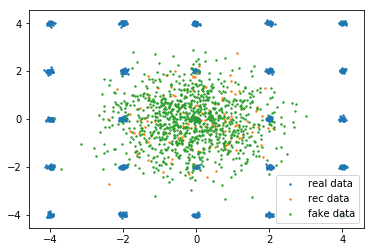

step 1000: KL: 1.626e+02, rec: -1.290e+03


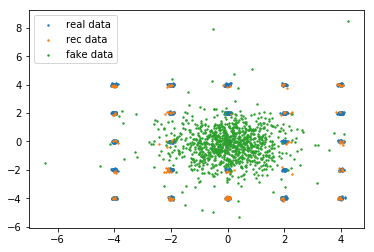

step 2000: KL: 1.733e+02, rec: -6.532e+02


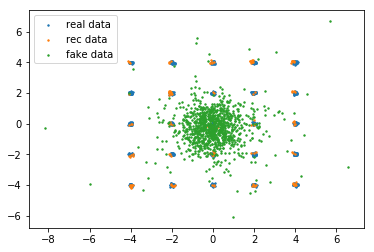

step 3000: KL: 1.685e+02, rec: -1.498e+03


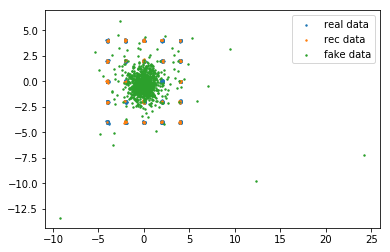

step 4000: KL: 1.725e+02, rec: -1.229e+03


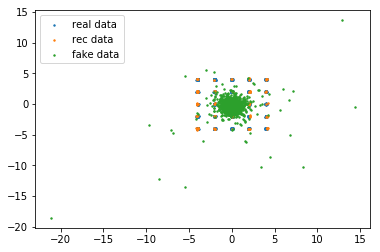

step 5000: KL: 1.757e+02, rec: -1.381e+03


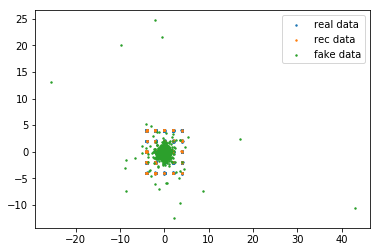

step 6000: KL: 1.789e+02, rec: -1.897e+03


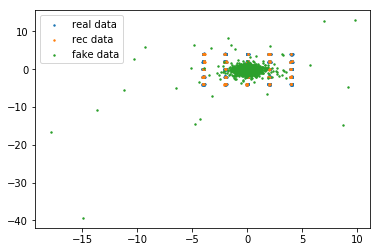

step 7000: KL: 1.783e+02, rec: -1.819e+03


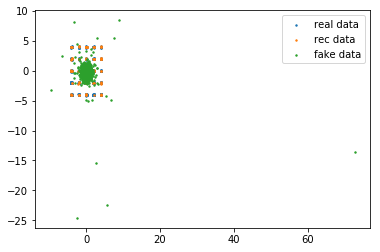

step 8000: KL: 1.791e+02, rec: -1.845e+03


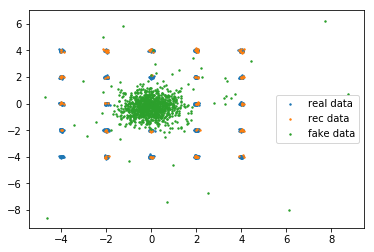

step 9000: KL: 1.777e+02, rec: -1.854e+03


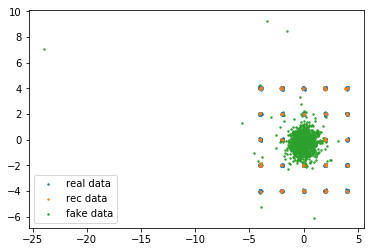

step 10000: KL: 1.748e+02, rec: -1.843e+03


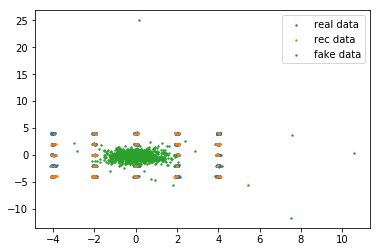

step 11000: KL: 1.770e+02, rec: -1.917e+03


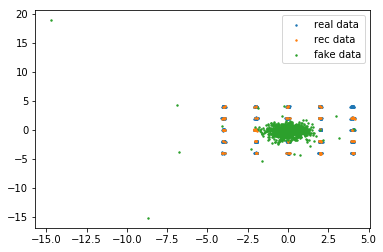

step 12000: KL: 1.765e+02, rec: -1.898e+03


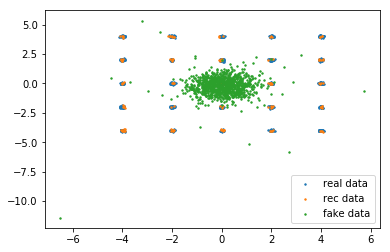

step 13000: KL: 1.751e+02, rec: -1.382e+03


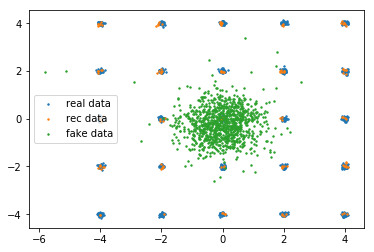

step 14000: KL: 1.722e+02, rec: -1.395e+03


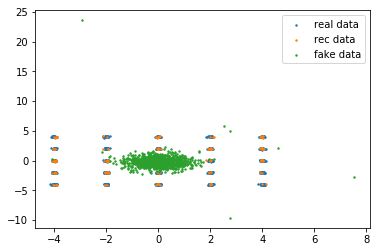

step 15000: KL: 1.759e+02, rec: -1.905e+03


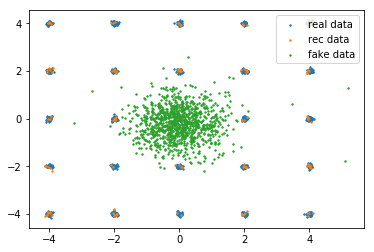

step 16000: KL: 1.758e+02, rec: -1.837e+03


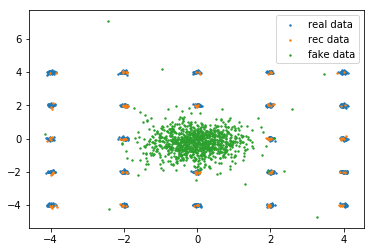

step 17000: KL: 1.741e+02, rec: -1.880e+03


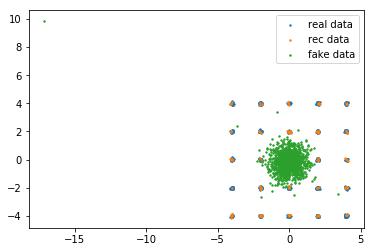

step 18000: KL: 1.757e+02, rec: -1.907e+03


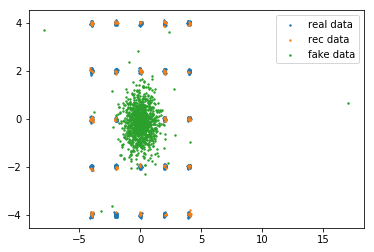

step 19000: KL: 1.776e+02, rec: -1.905e+03


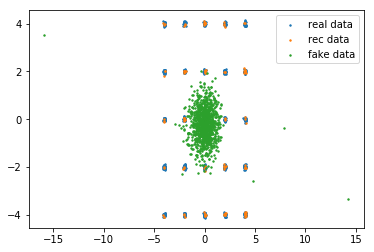

step 20000: KL: 1.728e+02, rec: -1.973e+03


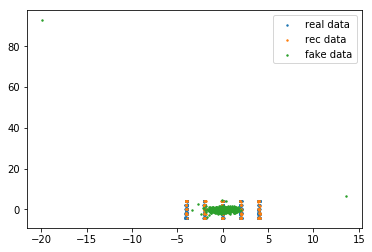

step 21000: KL: 1.760e+02, rec: -1.827e+03


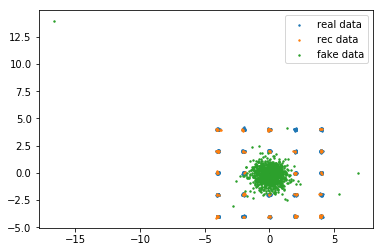

step 22000: KL: 1.765e+02, rec: -1.712e+03


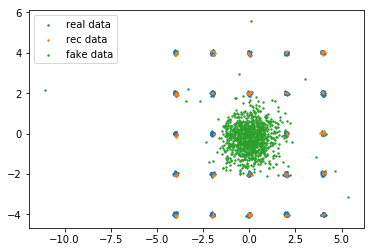

step 23000: KL: 1.767e+02, rec: -1.411e+03


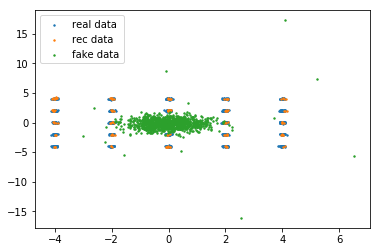

step 24000: KL: 1.721e+02, rec: -1.916e+03


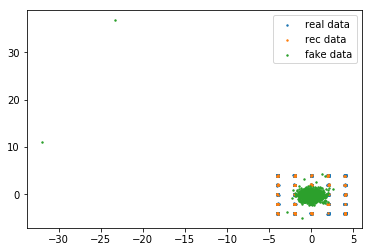

step 25000: KL: 1.728e+02, rec: -1.066e+03


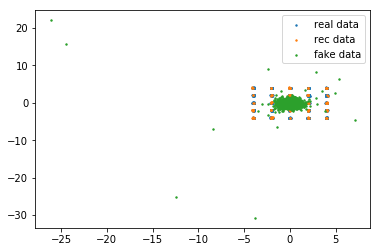

step 26000: KL: 1.746e+02, rec: -1.783e+03


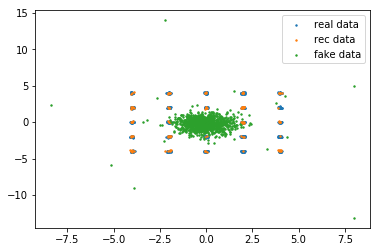

step 27000: KL: 1.726e+02, rec: -1.954e+03


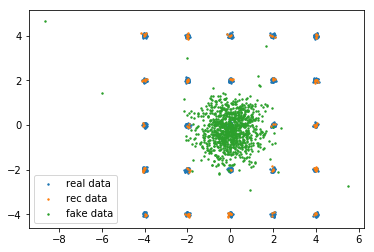

step 28000: KL: 1.718e+02, rec: -1.952e+03


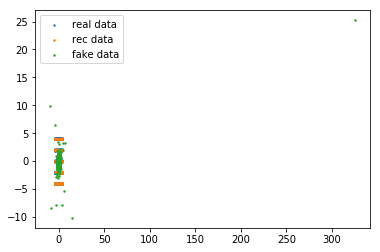

step 29000: KL: 1.717e+02, rec: -1.260e+03


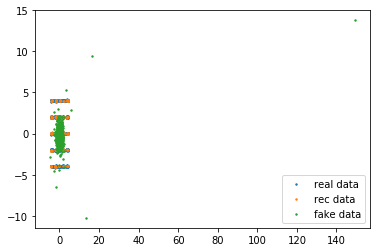

step 30000: KL: 1.697e+02, rec: -1.851e+03


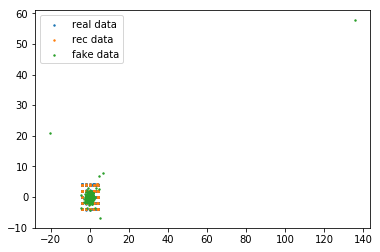

step 31000: KL: 1.716e+02, rec: -9.186e+01


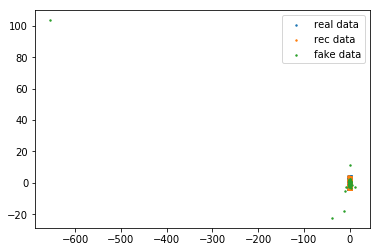

step 32000: KL: 1.740e+02, rec: -1.967e+03


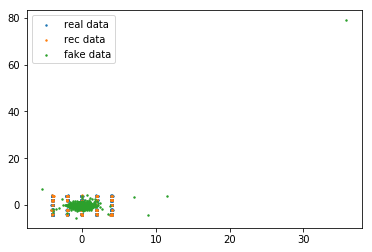

step 33000: KL: 1.685e+02, rec: -1.963e+03


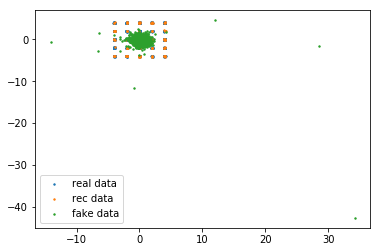

step 34000: KL: 1.743e+02, rec: -1.869e+03


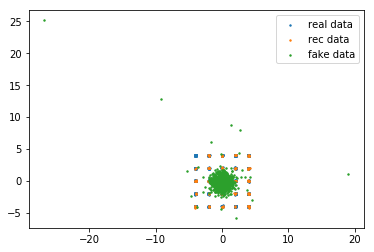

step 35000: KL: 1.700e+02, rec: -1.844e+03


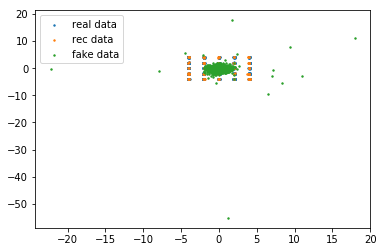

step 36000: KL: 1.703e+02, rec: -1.234e+03


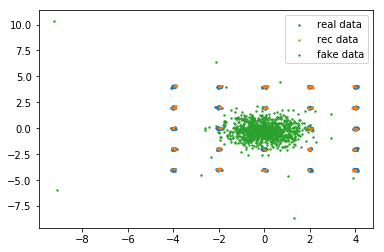

step 37000: KL: 1.705e+02, rec: -1.935e+03


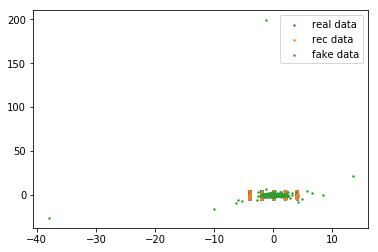

step 38000: KL: 1.688e+02, rec: -2.043e+03


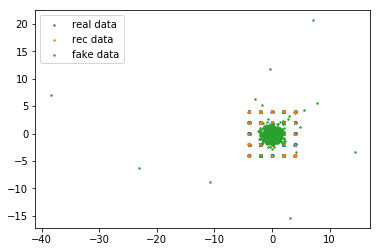

step 39000: KL: 1.678e+02, rec: -1.790e+03


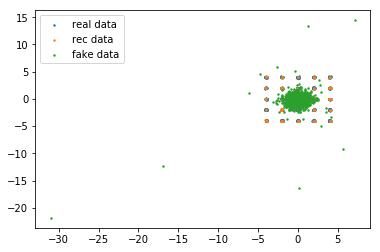

step 40000: KL: 1.691e+02, rec: -2.072e+03


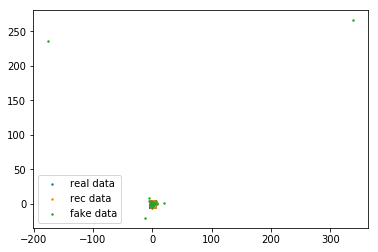

step 41000: KL: 1.712e+02, rec: -1.935e+03


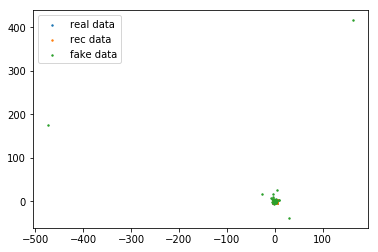

step 42000: KL: 1.692e+02, rec: -1.815e+03


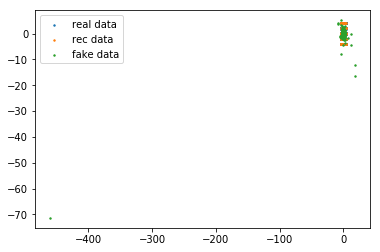

step 43000: KL: 1.665e+02, rec: -1.917e+03


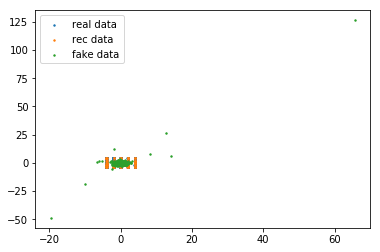

step 44000: KL: 1.650e+02, rec: -1.971e+03


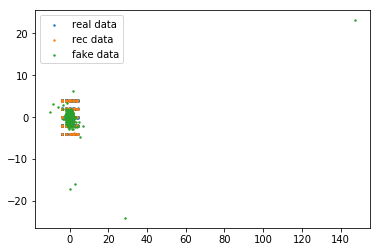

step 45000: KL: 1.648e+02, rec: 3.987e+02


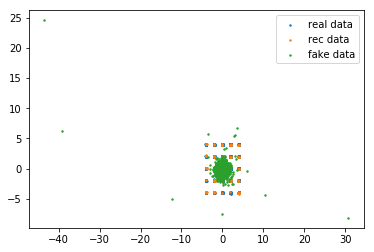

step 46000: KL: 1.609e+02, rec: -1.955e+03


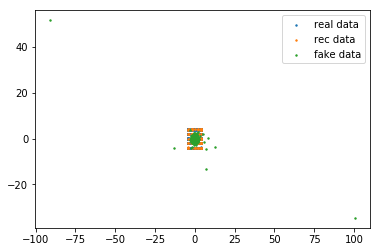

step 47000: KL: 1.647e+02, rec: -5.984e+02


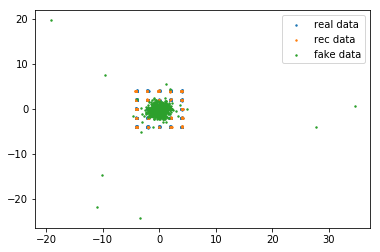

step 48000: KL: 1.656e+02, rec: -1.903e+03


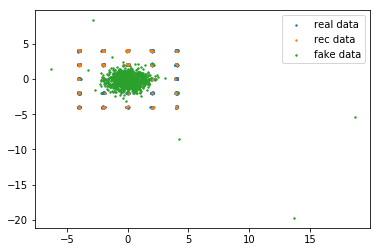

step 49000: KL: 1.608e+02, rec: -2.025e+03


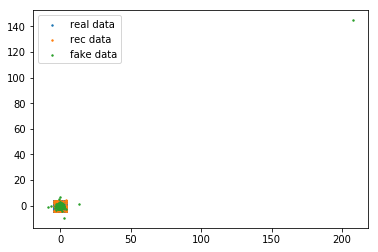

step 50000: KL: 1.607e+02, rec: -1.822e+03


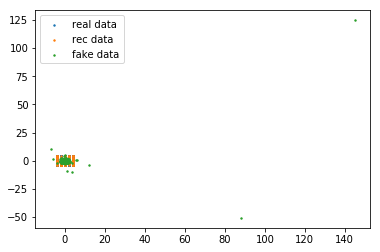

In [116]:
# step 13 000 is visually interesting (no scale problem)
VAE(N_ITER=50001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, sigma=False, frame=1000)

**Q13: Try hardcoding $\sigma_\theta(z)$ to some small value (like 0.01) rather than allowing the decoder to learn it. What does it change?**

step 0: KL: 7.955e-01, rec: 2.077e+05


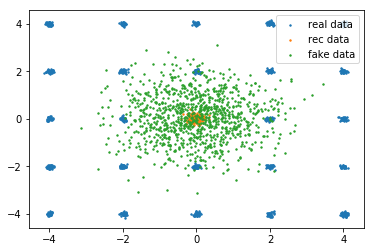

step 1000: KL: 1.184e+02, rec: -1.143e+03


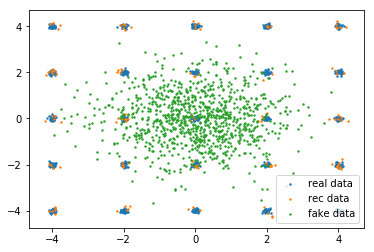

step 2000: KL: 1.105e+02, rec: -1.150e+03


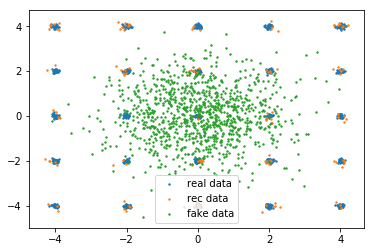

step 3000: KL: 1.064e+02, rec: -1.151e+03


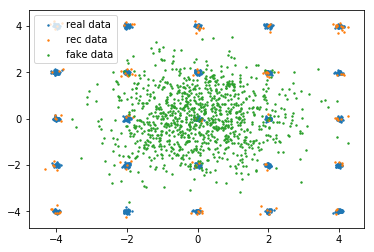

step 4000: KL: 1.007e+02, rec: -1.149e+03


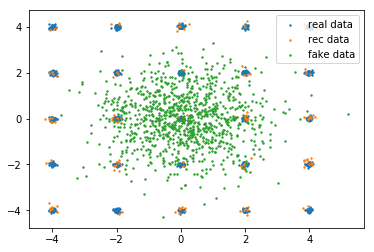

step 5000: KL: 9.597e+01, rec: -1.153e+03


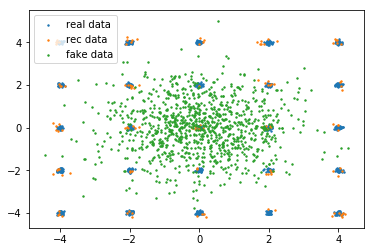

step 6000: KL: 9.006e+01, rec: -1.156e+03


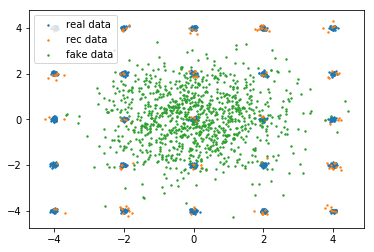

step 7000: KL: 8.398e+01, rec: -1.150e+03


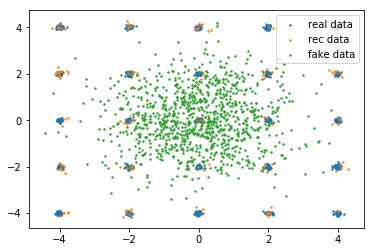

step 8000: KL: 7.816e+01, rec: -1.159e+03


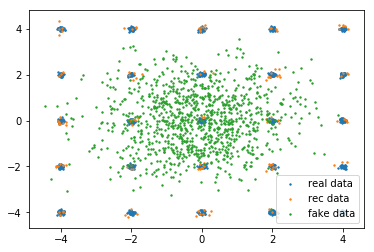

step 9000: KL: 7.532e+01, rec: -1.161e+03


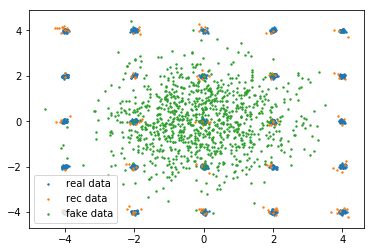

step 10000: KL: 7.269e+01, rec: -1.158e+03


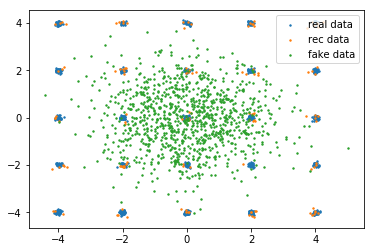

step 11000: KL: 7.227e+01, rec: -1.150e+03


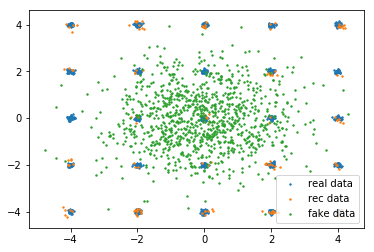

step 12000: KL: 6.701e+01, rec: -1.158e+03


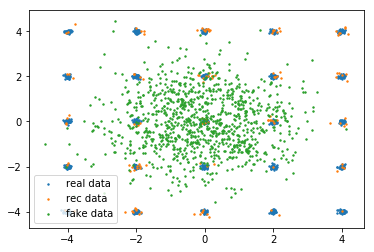

step 13000: KL: 6.777e+01, rec: -1.154e+03


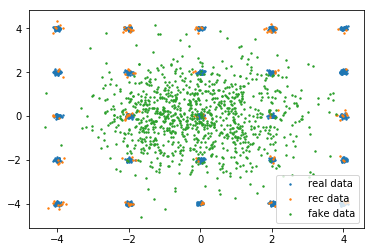

step 14000: KL: 6.371e+01, rec: -1.154e+03


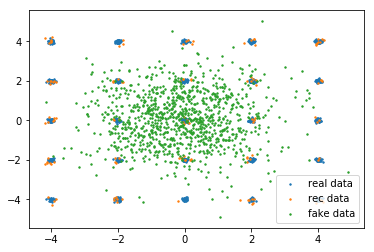

step 15000: KL: 6.030e+01, rec: -1.157e+03


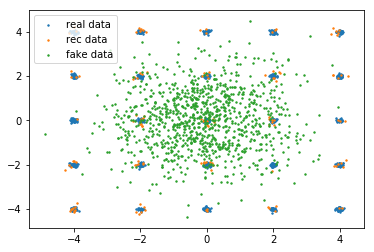

step 16000: KL: 5.965e+01, rec: -1.159e+03


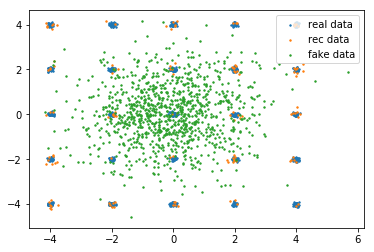

step 17000: KL: 5.870e+01, rec: -1.155e+03


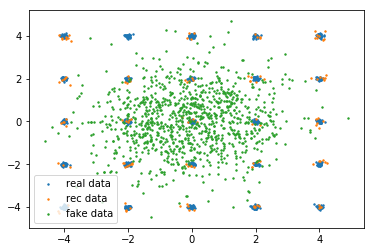

step 18000: KL: 5.672e+01, rec: -1.158e+03


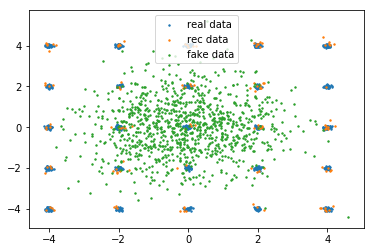

step 19000: KL: 5.658e+01, rec: -1.159e+03


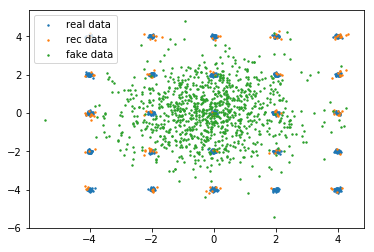

step 20000: KL: 5.468e+01, rec: -1.162e+03


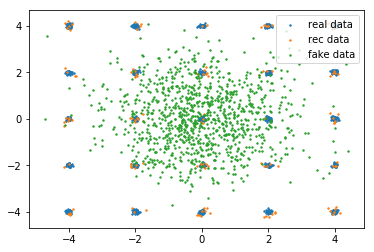

step 21000: KL: 5.504e+01, rec: -1.161e+03


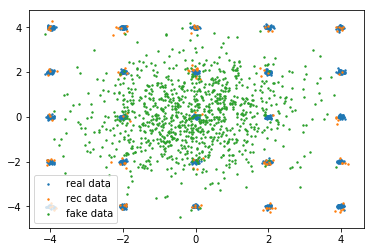

step 22000: KL: 5.397e+01, rec: -1.157e+03


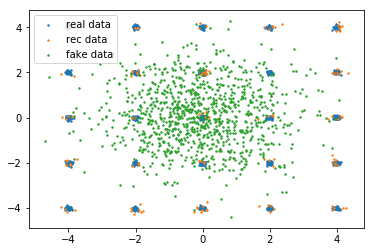

step 23000: KL: 5.396e+01, rec: -1.144e+03


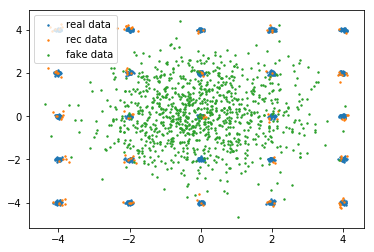

step 24000: KL: 5.208e+01, rec: -1.155e+03


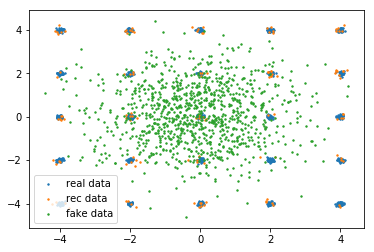

step 25000: KL: 5.155e+01, rec: -1.156e+03


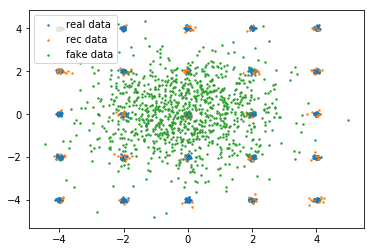

step 26000: KL: 5.052e+01, rec: -1.163e+03


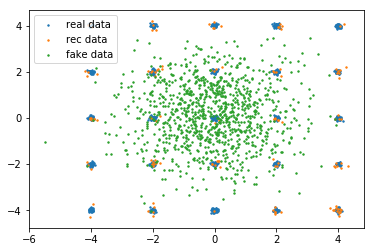

step 27000: KL: 5.000e+01, rec: -1.162e+03


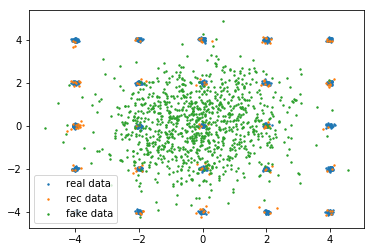

step 28000: KL: 4.974e+01, rec: -1.165e+03


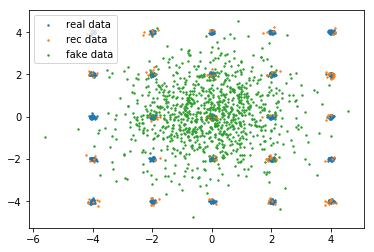

step 29000: KL: 5.059e+01, rec: -1.150e+03


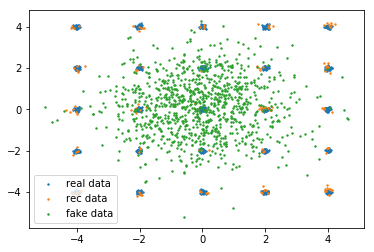

step 30000: KL: 4.925e+01, rec: -1.163e+03


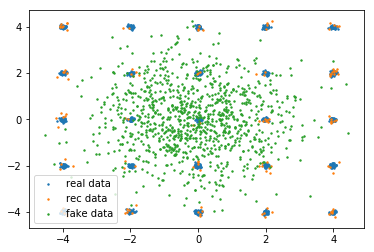

step 31000: KL: 4.616e+01, rec: -1.166e+03


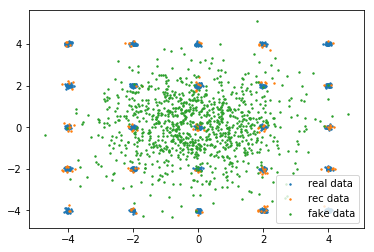

step 32000: KL: 4.560e+01, rec: -1.164e+03


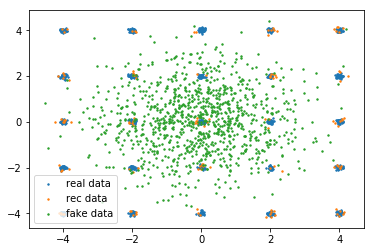

step 33000: KL: 4.399e+01, rec: -1.166e+03


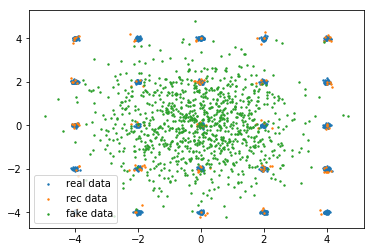

step 34000: KL: 4.398e+01, rec: -1.161e+03


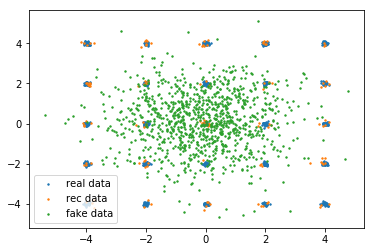

step 35000: KL: 4.262e+01, rec: -1.164e+03


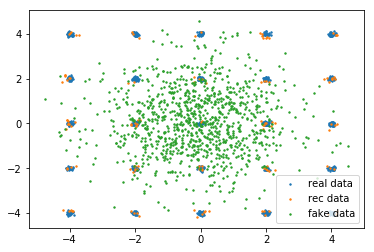

step 36000: KL: 4.360e+01, rec: -1.168e+03


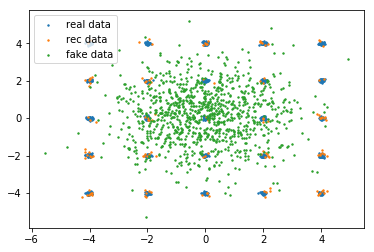

step 37000: KL: 4.219e+01, rec: -1.165e+03


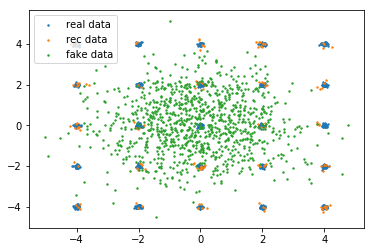

step 38000: KL: 4.263e+01, rec: -1.168e+03


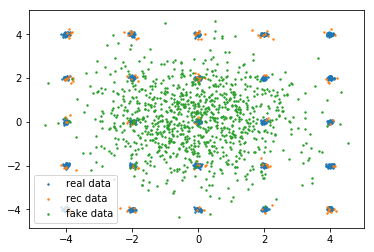

step 39000: KL: 4.221e+01, rec: -1.161e+03


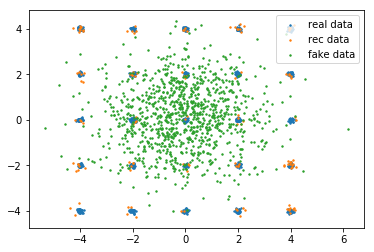

step 40000: KL: 4.134e+01, rec: -1.161e+03


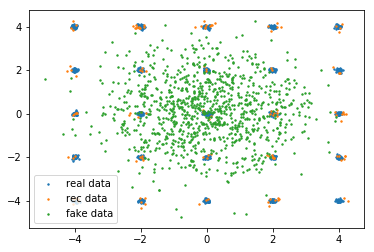

step 41000: KL: 4.095e+01, rec: -1.164e+03


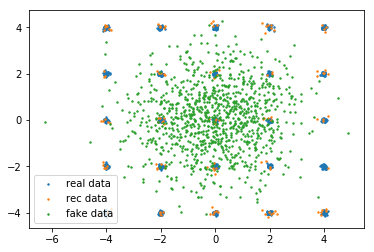

step 42000: KL: 3.990e+01, rec: -1.166e+03


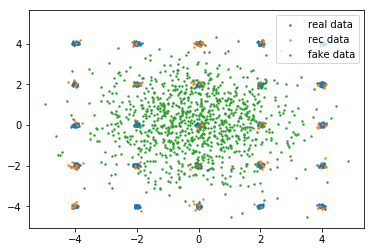

step 43000: KL: 3.922e+01, rec: -1.149e+03


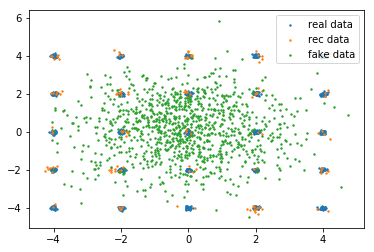

step 44000: KL: 4.120e+01, rec: -1.158e+03


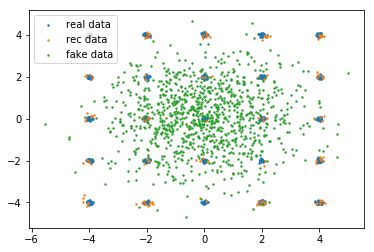

step 45000: KL: 3.943e+01, rec: -1.164e+03


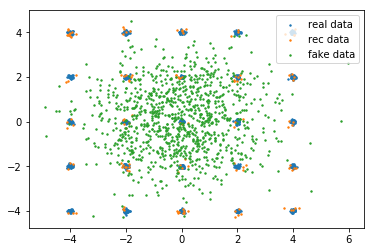

step 46000: KL: 3.842e+01, rec: -1.164e+03


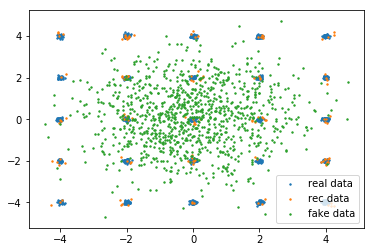

step 47000: KL: 3.927e+01, rec: -1.161e+03


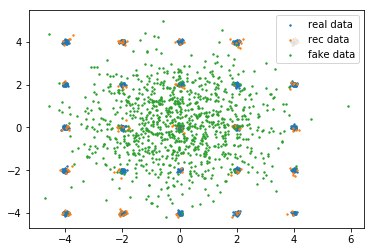

step 48000: KL: 3.785e+01, rec: -1.166e+03


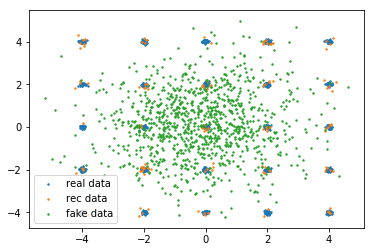

step 49000: KL: 3.677e+01, rec: -1.159e+03


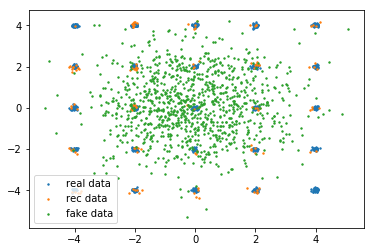

step 50000: KL: 3.671e+01, rec: -1.153e+03


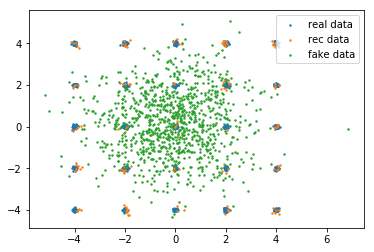

In [124]:
VAE(N_ITER=50001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, sigma=0.01, frame=1000)

> If we hardcode the variance to some fixed value, with all the other parameters being fixed, we notice that fake data are more concentrated around the origin. Indeed, no hardcoding introduces outliers in the variance estimation which make the KL divergence blowing up : from $36.71$ with hardcoding to $160.7$ whereas the reconstruction losses are quit similar, even better for no hardcoded VAE : $-1 822$ v. $-1 153$.  

**Q14: How do the power of encoder and decoder affect the overall training of the VAE?**

> Let's focus on the power of the encoder first.

step 0: KL: 3.673e+00, rec: 2.141e+03


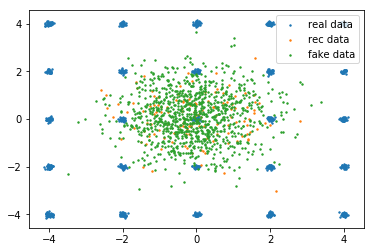

step 10000: KL: 6.860e+01, rec: 1.834e+02


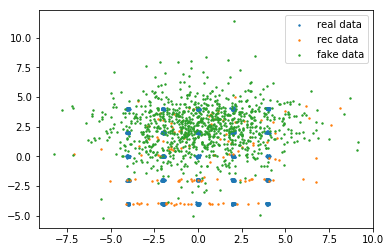

step 20000: KL: 9.024e+01, rec: 3.043e+01


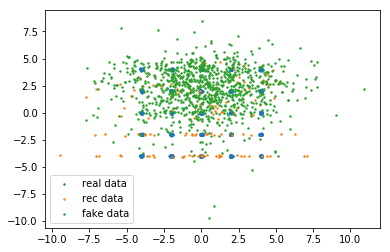

step 30000: KL: 8.043e+01, rec: 9.708e+01


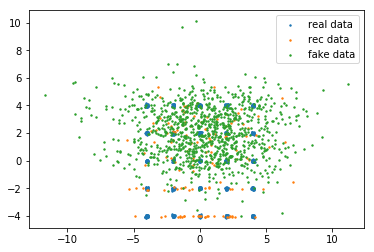

step 40000: KL: 8.193e+01, rec: 1.608e+01


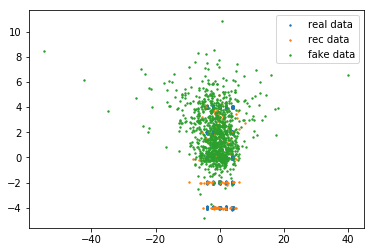

In [126]:
# Width of encoder : 2
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=2, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 7.940e-01, rec: 2.293e+03


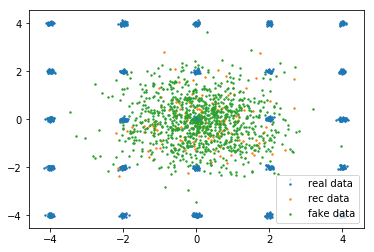

step 10000: KL: 1.299e+02, rec: -1.017e+03


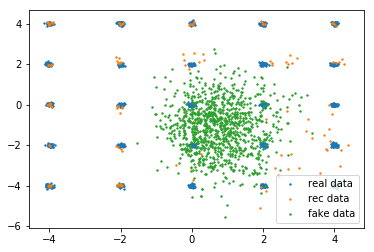

step 20000: KL: 1.392e+02, rec: -1.248e+03


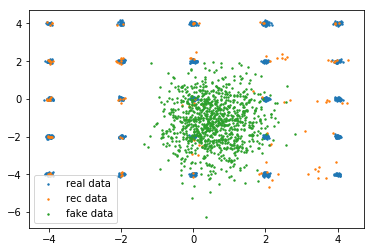

step 30000: KL: 1.441e+02, rec: -1.281e+03


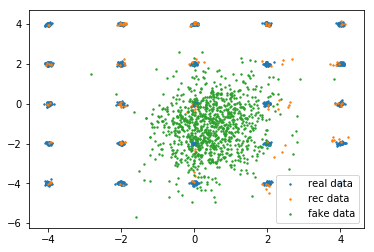

step 40000: KL: 1.576e+02, rec: -9.627e+02


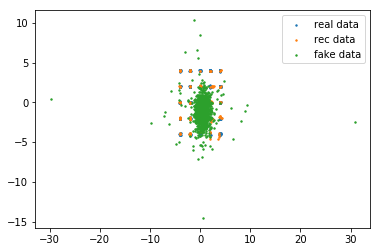

In [127]:
# Width of encoder : 10
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=10, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 1.073e+00, rec: 2.207e+03


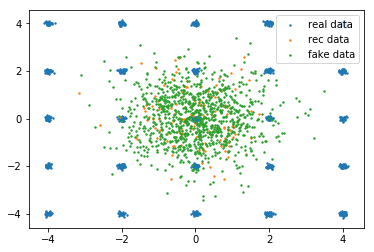

step 10000: KL: 1.968e+02, rec: -2.066e+03


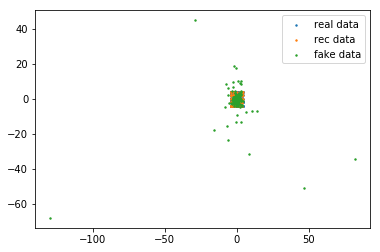

step 20000: KL: 2.035e+02, rec: -1.908e+03


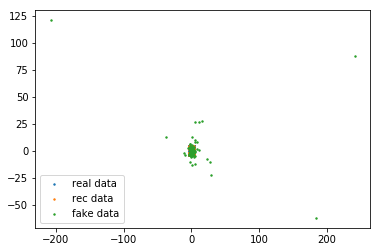

step 30000: KL: 1.975e+02, rec: -2.054e+03


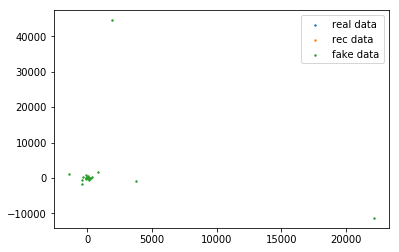

step 40000: KL: 2.010e+02, rec: -2.035e+03


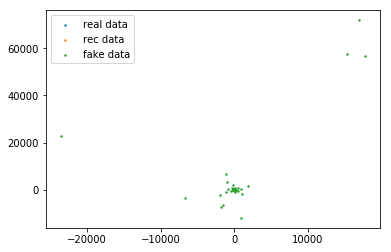

In [128]:
# Width of encoder : 50
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=50, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 8.714e-01, rec: 2.047e+03


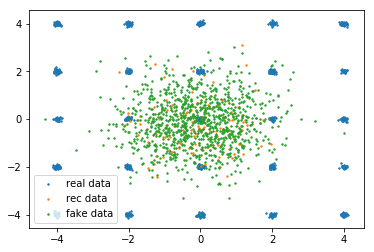

step 10000: KL: 1.872e+02, rec: -1.624e+03


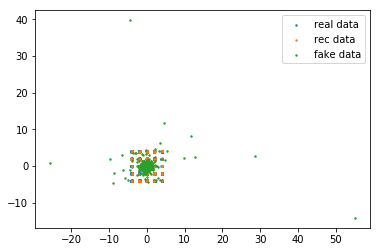

step 20000: KL: 1.810e+02, rec: -2.018e+03


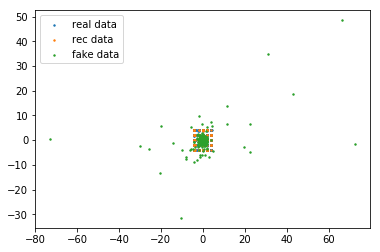

step 30000: KL: 1.862e+02, rec: -1.901e+03


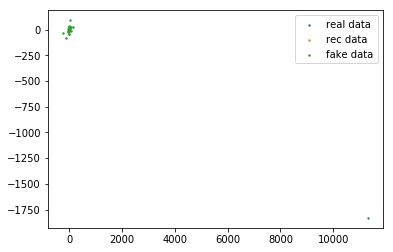

step 40000: KL: 1.852e+02, rec: -1.936e+03


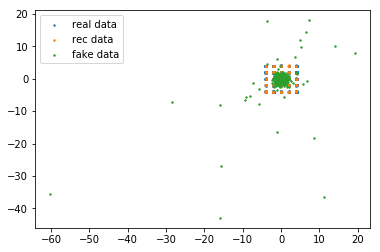

In [129]:
# Width of encoder : 100
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 7.879e-01, rec: 2.278e+03


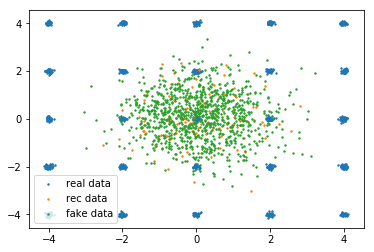

step 10000: KL: 1.778e+02, rec: -1.117e+03


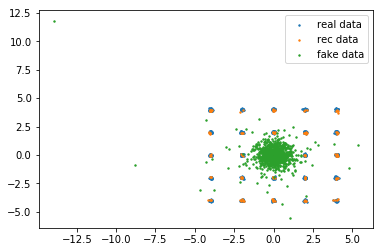

step 20000: KL: 1.754e+02, rec: -1.335e+03


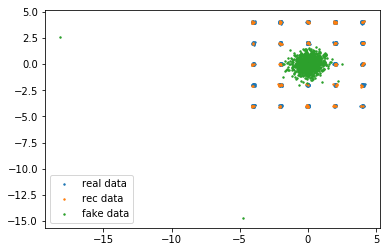

step 30000: KL: 1.707e+02, rec: -1.813e+03


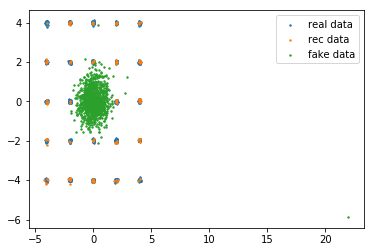

step 40000: KL: 1.668e+02, rec: -1.388e+03


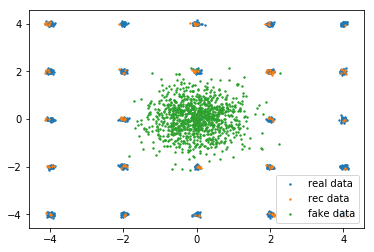

In [130]:
# Width of encoder : 200
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=200, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

> | Encoder Width 	| KL Loss    	| Rec Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $2$         	|   $81.93$       	|  $16.08$	|$5:44$|
| $10$         	|  $157.6$     	| $-962.7$	|$5:37$|
| $50$        	    | $201.0$ 	| $-2035$	|$6:01$|
| $100$         	| $185.2$ 	| $-1936$	|$6:49$|
| $200$         	| $166.8$	| $-1388$ |$9:39$|

step 0: KL: 7.145e+00, rec: 2.032e+03


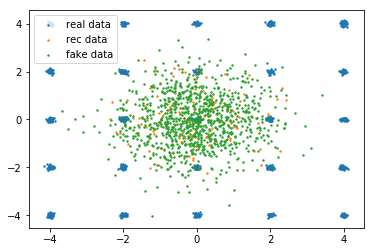

step 10000: KL: 2.392e+02, rec: -1.386e+03


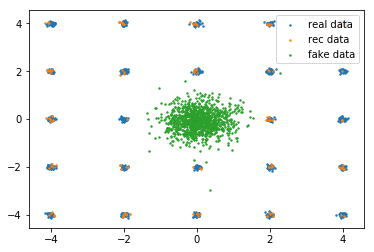

step 20000: KL: 2.266e+02, rec: -1.575e+03


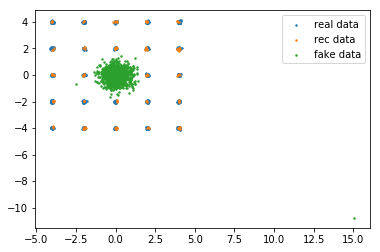

step 30000: KL: 2.113e+02, rec: -2.051e+03


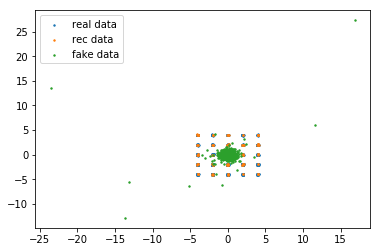

step 40000: KL: 2.142e+02, rec: -2.074e+03


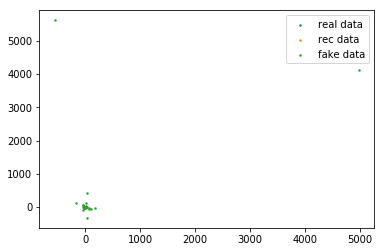

In [150]:
# Depth of encoder : 0
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=0, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 2.785e+00, rec: 2.066e+03


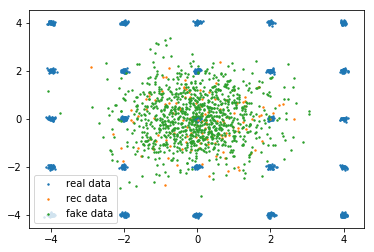

step 10000: KL: 1.901e+02, rec: -1.944e+03


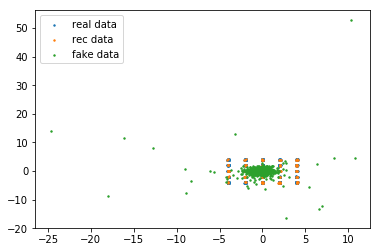

step 20000: KL: 1.881e+02, rec: -1.855e+03


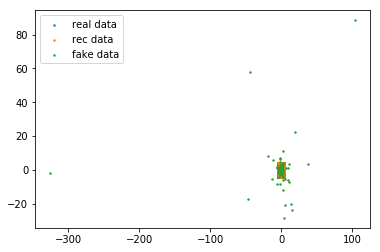

step 30000: KL: 1.878e+02, rec: -1.895e+03


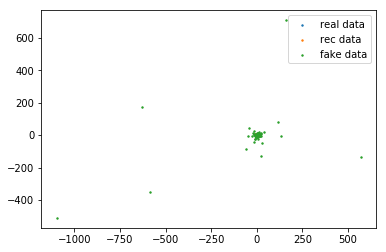

step 40000: KL: 1.876e+02, rec: -1.591e+03


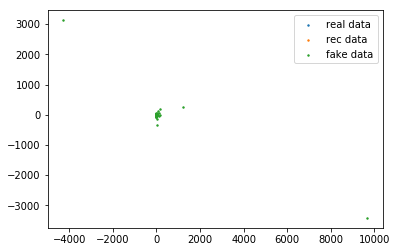

In [151]:
# Depth of encoder : 1
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=1, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 8.242e-01, rec: 2.150e+03


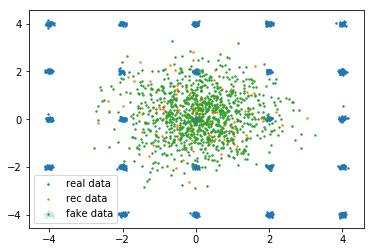

step 10000: KL: 1.892e+02, rec: -1.731e+03


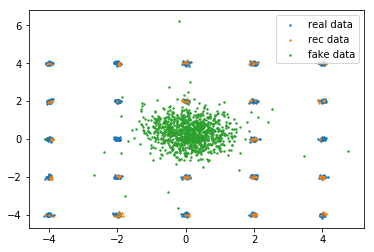

step 20000: KL: 1.872e+02, rec: -1.863e+03


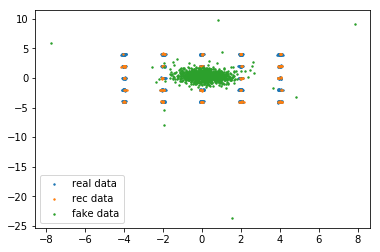

step 30000: KL: 1.819e+02, rec: -2.017e+03


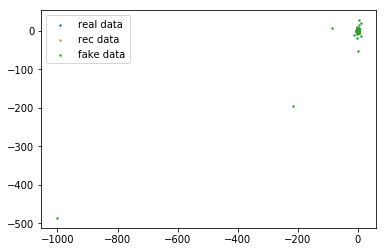

step 40000: KL: 1.864e+02, rec: -1.689e+03


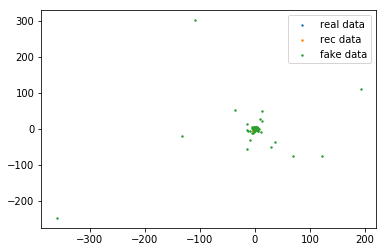

In [152]:
# Depth of encoder : 2
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 1.287e-01, rec: 2.137e+03


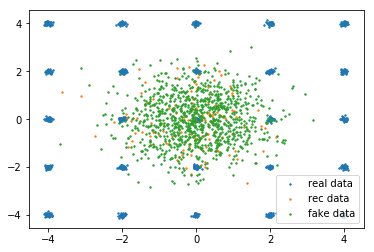

step 10000: KL: 1.793e+02, rec: -1.029e+03


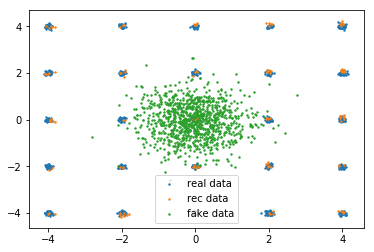

step 20000: KL: 1.701e+02, rec: -1.594e+03


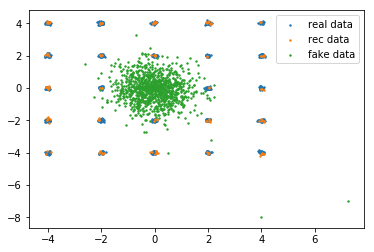

step 30000: KL: 1.562e+02, rec: -1.779e+03


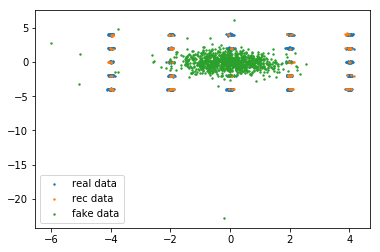

step 40000: KL: 1.544e+02, rec: -1.914e+03


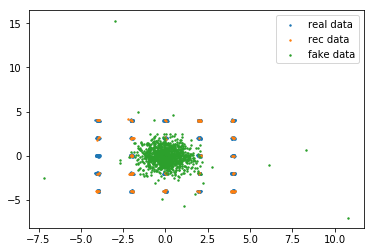

In [153]:
# Depth of encoder : 5
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=5, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 8.585e-02, rec: 2.319e+03


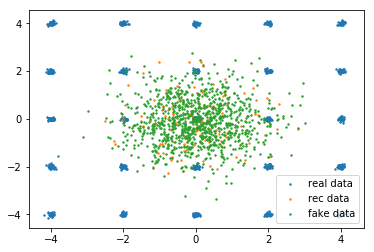

step 10000: KL: 1.004e+02, rec: -6.618e+02


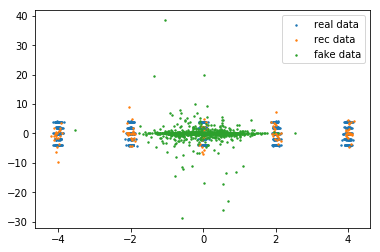

step 20000: KL: 9.427e+01, rec: -6.876e+02


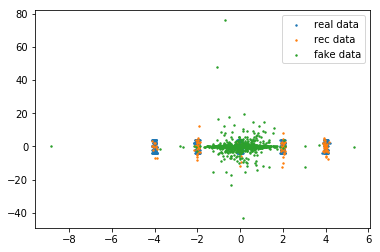

step 30000: KL: 8.907e+01, rec: 1.172e+02


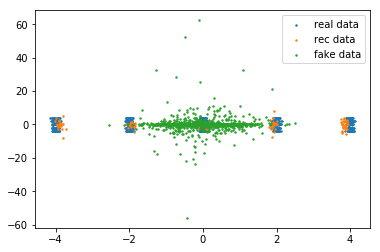

step 40000: KL: 8.789e+01, rec: -7.644e+02


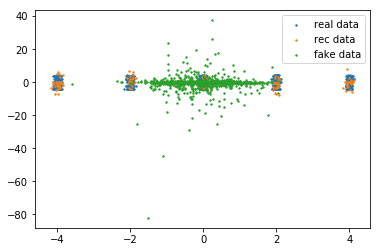

In [154]:
# Depth of encoder : 10
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=10, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

> | Encoder Depth 	| KL Loss        	| Rec Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $0$         	|   $214.2$       	|  $-2074$	|$4:32$|
| $1$         	| $187.6$	| $-1591$ | $6:13$|
| $2$         	|  $186.4$     	| $-1689$	|$7:07$|
| $5$        	    | $154.4$ 	| $-1914$	|$10:19$|
| $10$         	| $98.89$ 	| $-764.4$	|$15:22$|

> Same thing for the decoder.

step 0: KL: 8.737e-01, rec: 1.165e+03


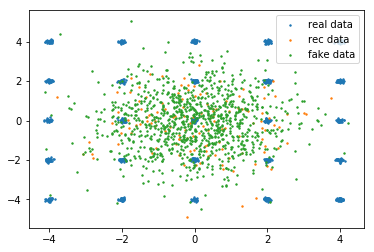

step 10000: KL: 5.112e+01, rec: 3.397e+02


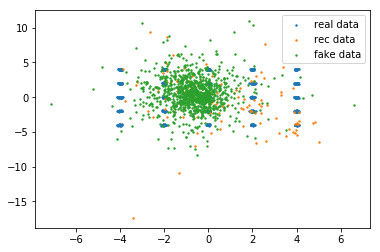

step 20000: KL: 9.547e+01, rec: -1.023e+02


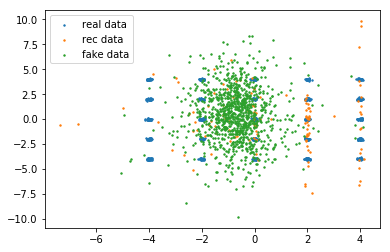

step 30000: KL: 1.038e+02, rec: 4.423e+01


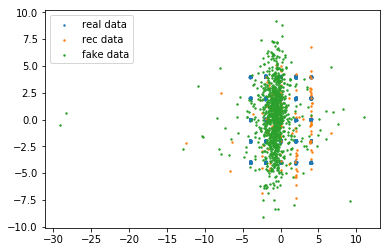

step 40000: KL: 1.230e+02, rec: -1.595e+02


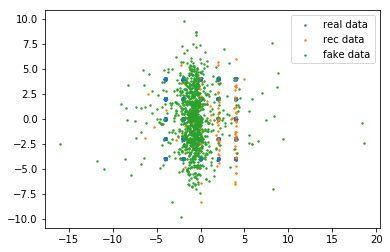

In [135]:
# Width of decoder : 2
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=2, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 6.292e-01, rec: 2.436e+03


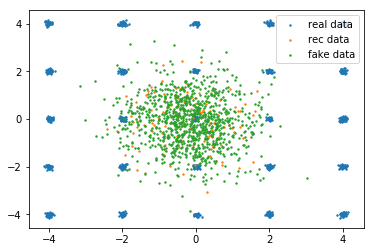

step 10000: KL: 2.281e+02, rec: -1.493e+03


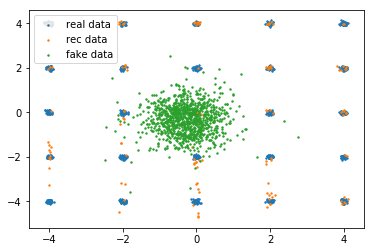

step 20000: KL: 2.444e+02, rec: -1.499e+03


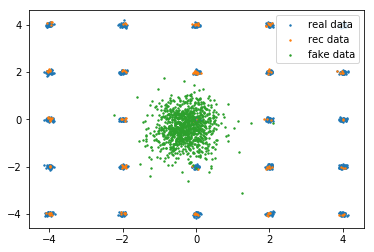

step 30000: KL: 2.586e+02, rec: -1.909e+03


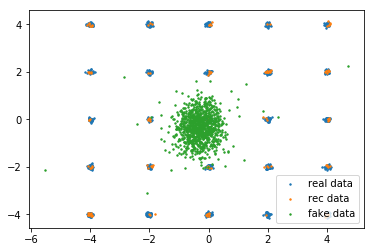

step 40000: KL: 2.490e+02, rec: -2.257e+03


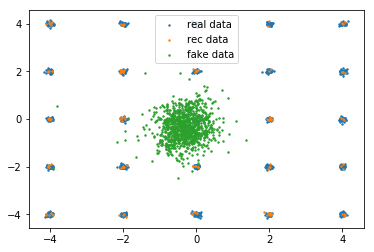

In [136]:
# Width of decoder : 10
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=10, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 9.620e-01, rec: 2.397e+03


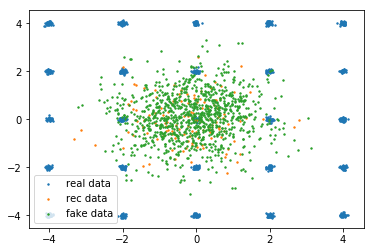

step 10000: KL: 2.253e+02, rec: -2.111e+03


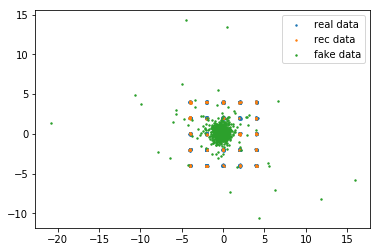

step 20000: KL: 2.195e+02, rec: -2.162e+03


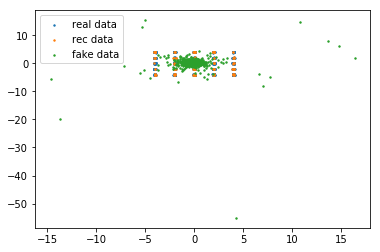

step 30000: KL: 2.183e+02, rec: -2.235e+03


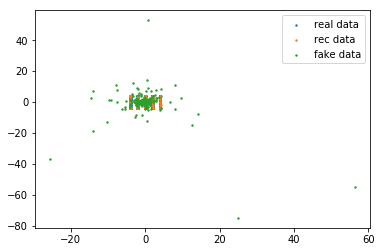

step 40000: KL: 2.190e+02, rec: -2.121e+03


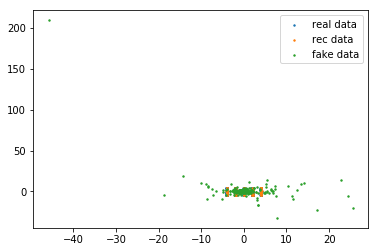

In [137]:
# Width of decoder : 50
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=50, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 1.313e+00, rec: 2.150e+03


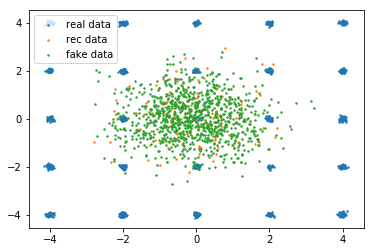

step 10000: KL: 1.916e+02, rec: -1.795e+03


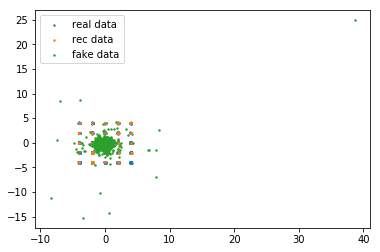

step 20000: KL: 1.987e+02, rec: -1.974e+03


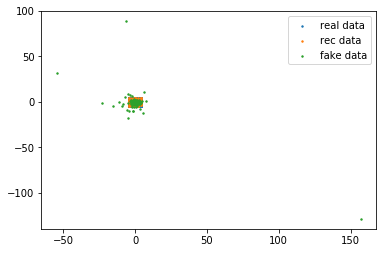

step 30000: KL: 1.902e+02, rec: -2.040e+03


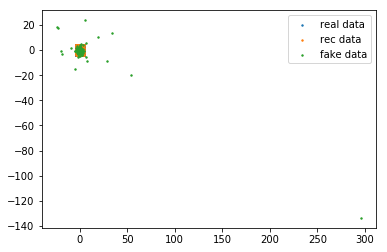

step 40000: KL: 1.879e+02, rec: -1.974e+03


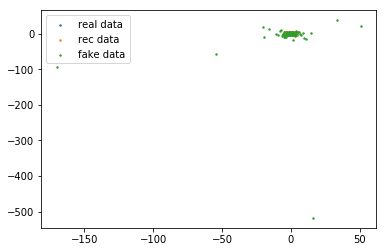

In [138]:
# Width of decoder : 100
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 7.972e-01, rec: 2.029e+03


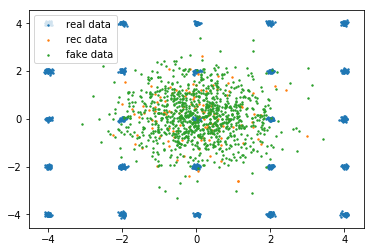

step 10000: KL: 1.563e+02, rec: -1.518e+03


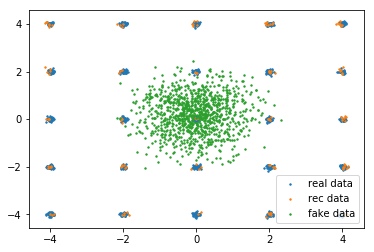

step 20000: KL: 1.514e+02, rec: -1.854e+03


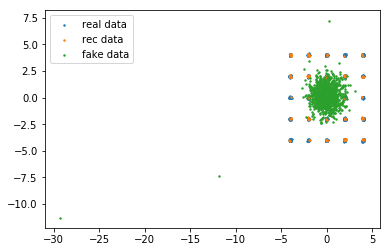

step 30000: KL: 1.506e+02, rec: -1.930e+03


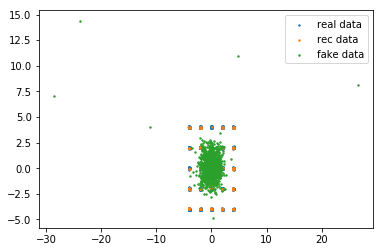

step 40000: KL: 1.479e+02, rec: -8.499e+02


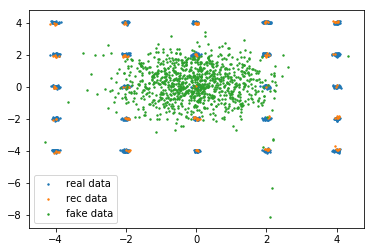

In [139]:
# Width of decoder : 200
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=200, DPTH_D=2,
    LATENT_N=20, frame=10000)

> | Decoder Width 	| KL Loss    	| Rec Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $2$         	|   $123.0$       	|  $-159.5$	|$5:45$|
| $10$         	|  $249.0$     	| $-2257$	|$6:16$|
| $50$        	    | $219.0$ 	| $-2121$	|$6:25$|
| $100$         	| $187.9$ 	| $-1974$	|$7:21$|
| $200$         	| $147.9$	| $-849.9$ |$10:27$|

step 0: KL: 1.040e+00, rec: 2.533e+03


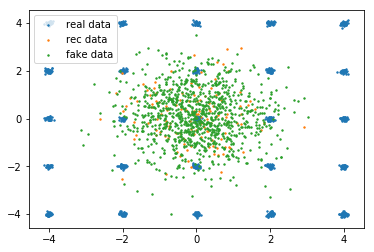

step 10000: KL: 2.164e+02, rec: -1.282e+03


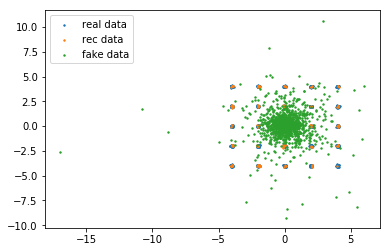

step 20000: KL: 2.252e+02, rec: -2.052e+03


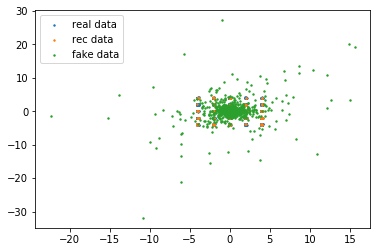

step 30000: KL: 2.247e+02, rec: -2.133e+03


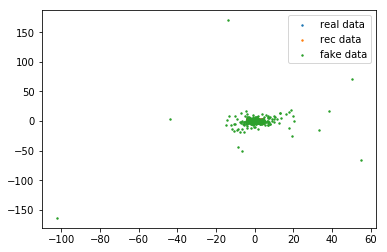

step 40000: KL: 2.217e+02, rec: -2.055e+03


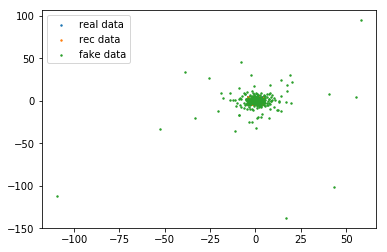

In [144]:
# Depth of decoder : 0
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=0,
    LATENT_N=20, frame=10000)

step 0: KL: 8.485e-01, rec: 2.025e+03


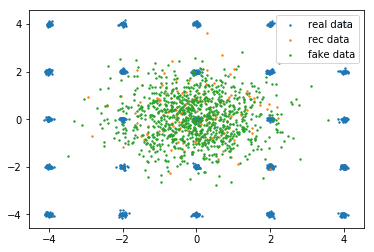

step 10000: KL: 1.957e+02, rec: -1.962e+03


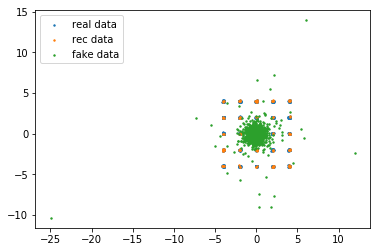

step 20000: KL: 1.925e+02, rec: -2.083e+03


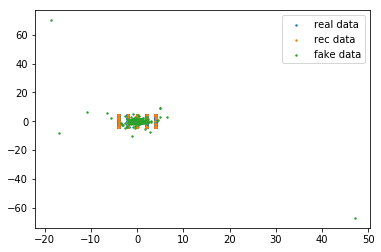

step 30000: KL: 1.961e+02, rec: -1.444e+03


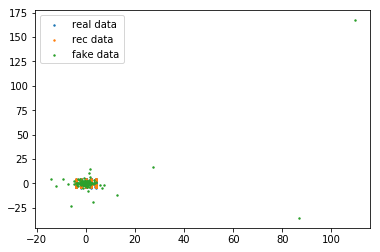

step 40000: KL: 1.922e+02, rec: -2.084e+03


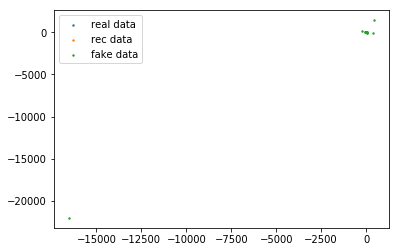

In [149]:
# Depth of decoder : 1
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=1,
    LATENT_N=20, frame=10000)

step 0: KL: 7.412e-01, rec: 2.146e+03


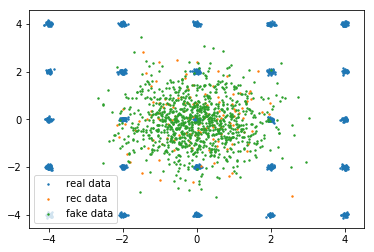

step 10000: KL: 1.980e+02, rec: -1.975e+03


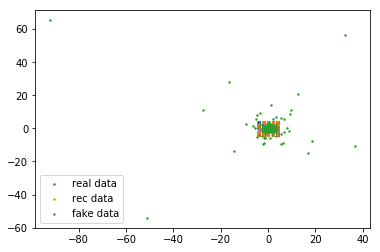

step 20000: KL: 1.906e+02, rec: -2.036e+03


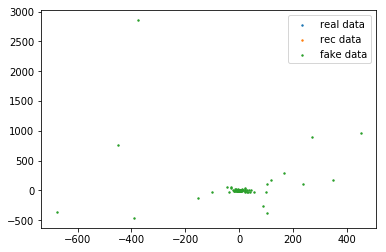

step 30000: KL: 1.897e+02, rec: -2.045e+03


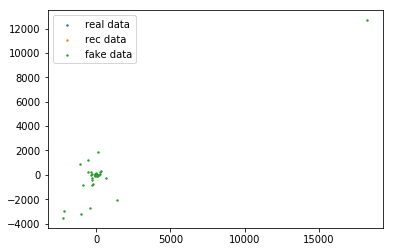

step 40000: KL: 1.874e+02, rec: -4.163e+02


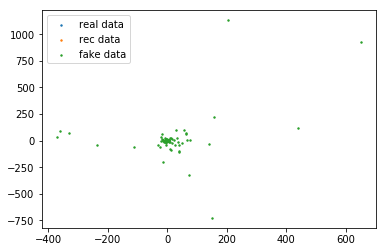

In [145]:
# Depth of decoder : 2
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=2,
    LATENT_N=20, frame=10000)

step 0: KL: 7.466e-01, rec: 2.036e+03


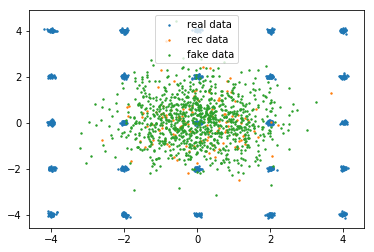

step 10000: KL: 1.525e+02, rec: -1.710e+03


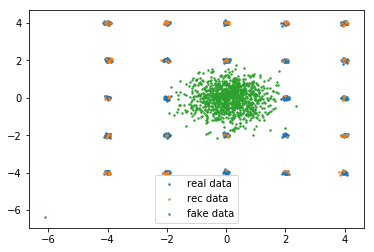

step 20000: KL: 1.494e+02, rec: -1.768e+03


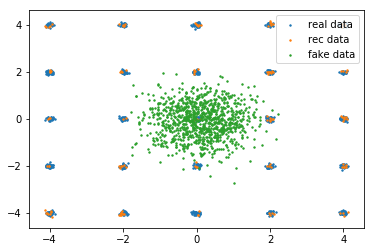

step 30000: KL: 1.465e+02, rec: -1.313e+03


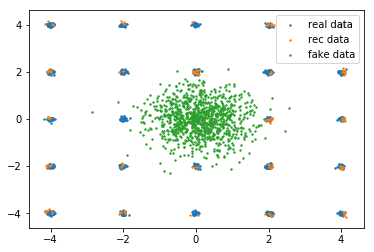

step 40000: KL: 1.450e+02, rec: -1.750e+03


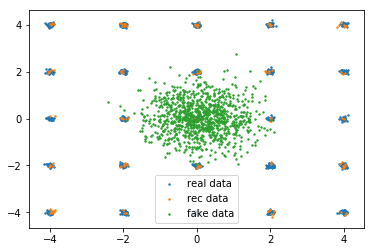

In [146]:
# Depth of decoder : 5
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=5,
    LATENT_N=20, frame=10000)

step 0: KL: 8.736e-01, rec: 2.069e+03


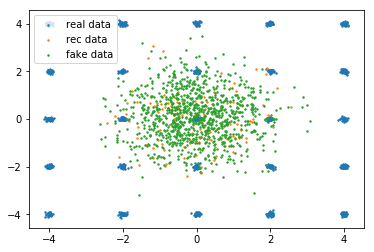

step 10000: KL: 1.489e+02, rec: -8.267e+02


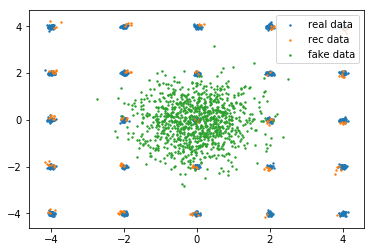

step 20000: KL: 1.455e+02, rec: -1.560e+03


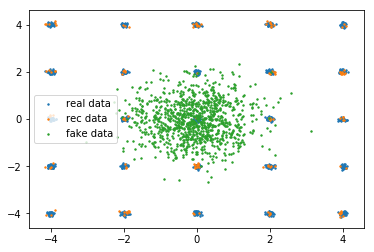

step 30000: KL: 1.430e+02, rec: -1.567e+03


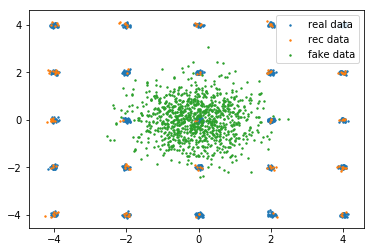

step 40000: KL: 1.401e+02, rec: -1.708e+03


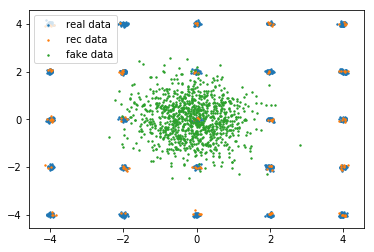

In [148]:
# Depth of decoder : 10
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=10,
    LATENT_N=20, frame=10000)

> | Decoder Depth 	| KL Loss        	| Rec Loss    	| Time (m) | 
|-------------	|--------	|--------|--------|
| $0$         	|   $221.7$       	|  $-2055$	|$5:32$|
| $1$         	| $192.2$	| $-2084$ | $5:21$|
| $2$         	|  $187.4$     	| $-416.3$	|$7:29$|
| $5$        	    | $145.0$ 	| $-1750$	|$10:46$|
| $10$         	| $141.0$ 	| $-1708$	|$14:55$|


> At last, it would be interesting to see the impact of ``LATENT_N``.

step 0: KL: 1.236e-02, rec: 2.147e+03


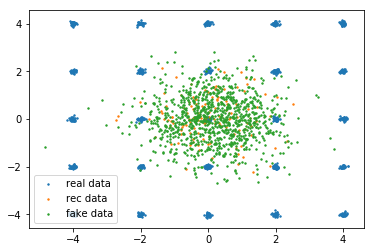

step 10000: KL: 1.485e+01, rec: -4.933e+02


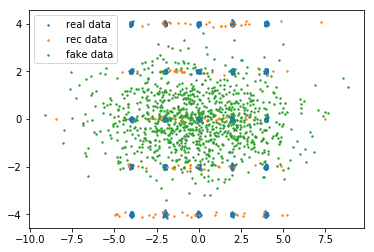

step 20000: KL: 1.515e+01, rec: -5.598e+02


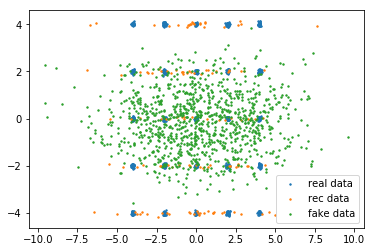

step 30000: KL: 1.549e+01, rec: -5.405e+02


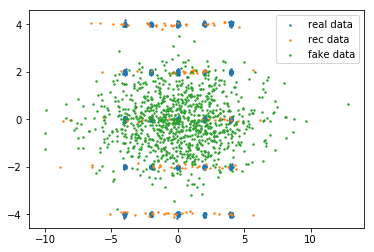

step 40000: KL: 1.548e+01, rec: -6.351e+02


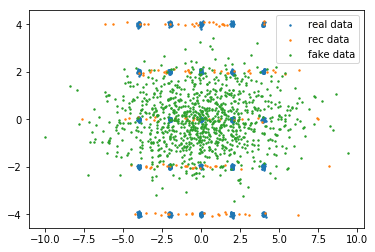

In [164]:
# Latent_n : 1
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=5,
    LATENT_N=1, frame=10000)

step 0: KL: 2.060e-01, rec: 1.984e+03


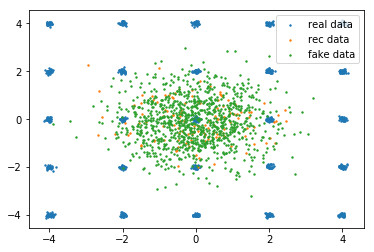

step 10000: KL: 5.891e+01, rec: -1.781e+03


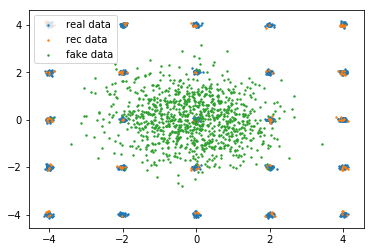

step 20000: KL: 5.858e+01, rec: -1.860e+03


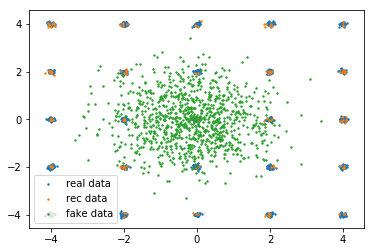

step 30000: KL: 5.788e+01, rec: -1.845e+03


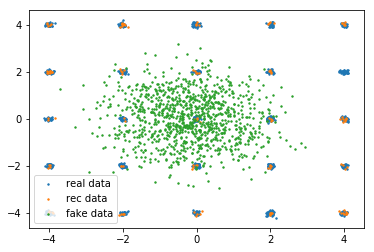

step 40000: KL: 5.756e+01, rec: -1.880e+03


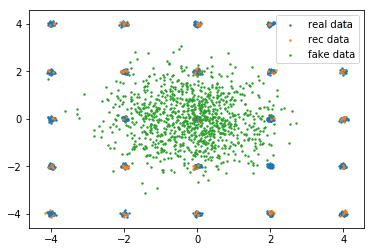

In [165]:
# Latent_n : 5
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=5,
    LATENT_N=5, frame=10000)

step 0: KL: 5.027e-01, rec: 2.112e+03


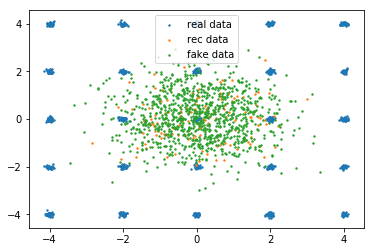

step 10000: KL: 5.567e+01, rec: -1.635e+03


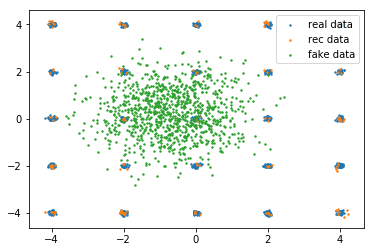

step 20000: KL: 5.398e+01, rec: 1.061e+02


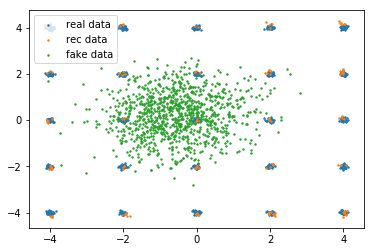

step 30000: KL: 5.243e+01, rec: -1.825e+03


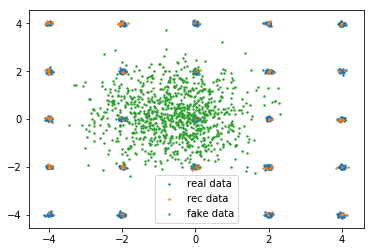

step 40000: KL: 5.192e+01, rec: -1.954e+03


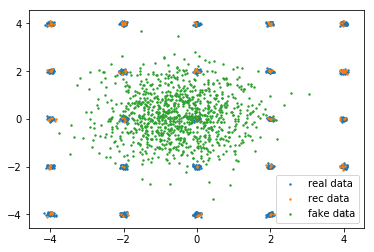

In [168]:
# Latent_n : 10
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=5,
    LATENT_N=10, frame=10000)

step 0: KL: 8.168e-01, rec: 2.278e+03


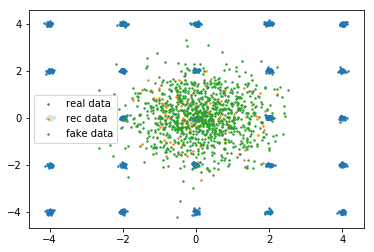

step 10000: KL: 9.050e+01, rec: -1.716e+03


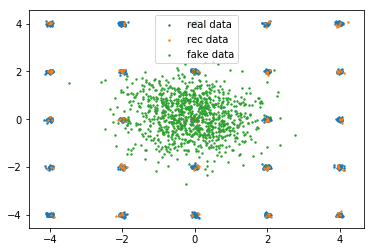

step 20000: KL: 8.833e+01, rec: -1.851e+03


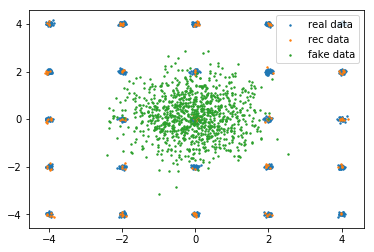

step 30000: KL: 8.706e+01, rec: -1.819e+03


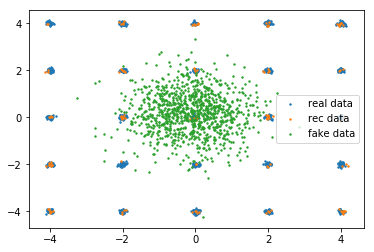

step 40000: KL: 8.438e+01, rec: -1.911e+03


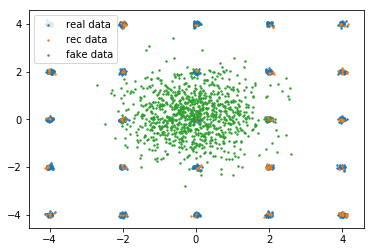

In [169]:
# Latent_n : 20
VAE(N_ITER=40001, BATCHLEN=128,
    WDTH_E=100, DPTH_E=2, WDTH_D=100, DPTH_D=5,
    LATENT_N=20, frame=10000)

> | Latent_n 	| KL Loss    	| Rec Loss    	| 
|-------------	|--------	|--------|
| $1$         	|   $15.48$      	|  $-635.1$	|
| $5$         	|     $57.56$  	| $1880$	|
| $10$        	    | $51.92$| $-1954$	|
| $20$        	    | $84.38$	| $-1911$	|

> Impact of the following parameters:
> - **encoder width**: first, we may notice that, globally, the convergence of the network is quicker than that of the GAN. Indeed, recovery points match the input points from around 7000 iterations. Increasing the width of the encoder allows to accelerate this convergence. For a width of 2 (which is poor), the recovery points are clearly not fitting the input points. Moreover, the fake ones do not (for most of them) belong to the original grid. The dedicated table shows that from 10 neurons per layer, the reconstruction loss is very satisfying. However, from most of cases, the fake points suffer from outliers that strongly penalises the KL divergence. These outliers come from the estimation of ``log_var``. Recall that they are not observed when we hardcode the latter variable with a small value. More especially, the proportion of outliers seems to decrease with the width of the encoder, as the support of the the fake points’ distribution. For example, 200 neurons per layer leads to very satisfying results with few outliers (when looking at some iterations), but, at last, although they belong to the original grid,  the fake points are really concentrated around the origin of the grid. That’s why the KL divergence is not as good as we would expect it to be.
> - **encoder depth**: two tendencies are quite remarkable here. The first one is that the reconstruction loss increases with the depth of the encoder. On the contrary, the KL loss decreases with the depth of the encoder. This can be linked to the previous paragraph: we observe that, the number of outliers and their « strengths » are decreasing with the complexity of the network. However, small encoder depths allow to get very  satisfying reconstruction points. There is an important tradeoff to find here.
> - **decoder width**: we can make the same observations as those concerning the width of the encoder. 
> - **decoder depth*: we can make the same observations as those concerning the width of the decoder. 
> - **latent_n**: only very small dimension can lead to poor reconstruction.
>
> As a conclusion for selecting the best parameters, I would suggest to choose : 
> - **encoder depth**: 2
> - **encoder width**: 100
> - **decoder depth**: 5
> - **decoder width**: 100
> - **latent_n**: 20

**Q15: As a conclusion, how would you compare the advantages and shortcomings of GANs and VAEs?**

> The main difference between GAN and VAE lies in their structural nature. GANs aims to perfectly replicate input data whereas VAEs, as denoted by the « V », are useful for generating data that are small variations of the input data (sampling $z$ is analogous to interpolate between encoded features clusters). If we want to mimic some images, GANs are more useful. However, VAEs are useful for projecting the original inputs into small and very informative vectors. The encoder learns to preserve as much of the relevant information as possible in the limited encoding. GANs are quite hard to train. First, the computational ressources needed for training are significantly higher than those required by VAEs (x2). Moreover, the convergence of the fake points is quite slower than the convergence of the reconstruction points for VAEs. We saw that both the discriminator and the generator are strongly sensitive to some parameters, especially the parameter ``TRAIN_RATIO``. This is problematic as this value is very influential on computational ressources. Gridsearching can then rapidly be burdensome. On the other hand, VAEs are easier to train but still quite sensitive to parameters such that the width of the networks; the latter influencing the presence of outliers in fake data points. For each parameter to tune, as for GANs or VAEs, we saw that, generally, a trade off has to be found. Although GANs are hard to train, this tradeoff only consists in finding  a balance between computational time and accuracy.  Once found, the latter leads to very satisfying results and good-looking fake data. However, tradeoff with VAEs are relative to both computational time, KL divergence and reconstruction loss. In other words, tuning VAEs strongly depends on your application : favour KL divergence to produce « new » fake data that are very plausible (it would be more explicit on images) or favour the reconstruction loss in order to mimic the input data. 
>
> Note on methodology:
>
> It appeared that training both GAN and VAE was quite long on my personal laptop. As a consequence, I would like to suggest some methodology aspects that would have been more rigorous, with more time:
>- The different tables available (for different parameters tuning) should display averaged losses to comfort the analysis.
 >- Randomized gridsearch should be used for tuning the hyper-parameters after studying the impact of each of them, as done in the notebook. Some metric, such that a weighted average of the losses, could have been used.
> - More statistics on convergence would have been nice : proportion of outliers for VAEs, displaying losses’ evolution through iterations, change input data, etc… 
> - Different activations / non-linearities could have been studied instead of systematic ReLu activations. 
> - For VAE part : when the networks correctly converged, fake data were centered around 0 but their variance is about half the normal one. I should have investigated on this as the fake data points never fully cover the original grid.
